# Setup
For Google Colab usage.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install torch-scatter torch-sparse torch-cluster torch-spline-conv -f https://data.pyg.org/whl/torch-2.5.1+cu121.html
!pip install torch-geometric

Looking in links: https://data.pyg.org/whl/torch-2.5.1+cu121.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.9/10.9 MB 70.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.1/5.1 MB 59.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 52.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 991.6/991.6 kB 9.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.1/63.1 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 50.4 MB/s eta 0:00:00


In [ ]:
import time
from datetime import datetime
import pickle
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

# Load Data
### Dataset
* From **460 measurements** of 500h with:
* 160 measurements have [BHE] tag (contains more severe blindness signals than other measurements)
* 300 measurements have mixed tag
* [1.0.0] pipeline

### Signals considered:
Mix of both continuous signals and categorical signals (one-hot-encoded). Engineered features can also be introduced but will increase complexity.
* **CAN bus**: speed, acceleration, yaw rate
* **Road condition**: dry, wet, snow-covered (categorical)
* **Time To Collision Risk**: feature derive from inverse TTC and lateral position
* **Lane keeping quality**: aggregate mid, left, right lane boundary safe (binary)

### Feature aggregation
* Aggregated windows with statistical features
* Windows of 6s, step size 3s

In [ ]:
file_path = '/content/drive/My Drive/Colab Notebooks/features_data/6s_sorted/460-mea-pipeline-1-0-0-full-features.csv'

In [ ]:
!ls /content/drive/My\ Drive/


In [ ]:
import pandas as pd
import numpy as np
import networkx as nx
import sklearn
import tqdm
import torch
import torch_sparse
import torch_cluster
import torch_geometric
import plotly

print("Torch version:", torch.__version__)
print("Torch Sparse version:", torch_sparse.__version__)
print("Torch Cluster version:", torch_cluster.__version__)
print("Torch Geometric version:", torch_geometric.__version__)
print("Pandas version:", pd.__version__)
print("NumPy version:", np.__version__)
print("NetworkX version:", nx.__version__)
print("Scikit-learn version:", sklearn.__version__)
print("TQDM version:", tqdm.__version__)
print("Plotly version:", plotly.__version__)

Torch version: 2.5.1+cu121
Torch Sparse version: 0.6.18+pt25cu121
Torch Cluster version: 1.6.3+pt25cu121
Torch Geometric version: 2.6.1
Pandas version: 2.2.2
NumPy version: 1.26.4
NetworkX version: 3.4.2
Scikit-learn version: 1.6.0
TQDM version: 4.67.1
Plotly version: 5.24.1


#### Load dataset
The data is already processed with feature aggregation, contains windows (as rows) and extracted features (as columns).

In [ ]:
# load data
features_df_raw = pd.read_csv(file_path)

In [ ]:
len(features_df_raw)

183183

In [ ]:
# Total duration (each window is 10s)
print(f"Total duration of the extracted data is: {len(features_df_raw)*10/60/60}h")

Total duration of the extracted data is: 169.61111111111111h


#### Randomly sample data
Randomly sample windows to avoid bias, turn the data from time-series into tabular data.

In [ ]:
# Randomly sample windows for each measurement
features_df_raw = features_df_raw.groupby('mea_acv_id', group_keys=False).apply(
    lambda x: x.sample(frac=1/3, random_state=42)
)

<ipython-input-8-b0326569ac81>:2: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  features_df_raw = features_df_raw.groupby('mea_acv_id', group_keys=False).apply(


In [ ]:
# convert timestamp to datetime
#features_df_raw['timestamp'] = pd.to_datetime(features_df_raw['timestamp'], unit='ns')

In [ ]:
# sort order on timestamp
#features_df_raw = features_df_raw.sort_values(by='timestamp')

In [ ]:
# reset index on new sorted df
features_df_raw = features_df_raw.reset_index(drop=True)

### Filter data
Filter data to only contain relevant signals.

In [ ]:
features_df_raw.columns.tolist()

['Unnamed: 0',
 'mea_acv_id',
 'start_time',
 'end_time',
 'mea',
 'mea_acv_description',
 'split_file',
 'timestamp',
 'sReference.nImageNumber',
 'sBasicVehicleSignals.fVehicleSpeed_mean',
 'sBasicVehicleSignals.fVehicleSpeed_min',
 'sBasicVehicleSignals.fVehicleSpeed_max',
 'sBasicVehicleSignals.fVehicleSpeed_std',
 'sBasicVehicleSignals.fVehicleSpeed_range',
 'sBasicVehicleSignals.fVehicleSpeed_zcr',
 'sBasicVehicleSignals.fAccelRate_mean',
 'sBasicVehicleSignals.fAccelRate_min',
 'sBasicVehicleSignals.fAccelRate_max',
 'sBasicVehicleSignals.fAccelRate_std',
 'sBasicVehicleSignals.fAccelRate_range',
 'sBasicVehicleSignals.fAccelRate_zcr',
 'sBasicVehicleSignals.fVehicleYaw_mean',
 'sBasicVehicleSignals.fVehicleYaw_min',
 'sBasicVehicleSignals.fVehicleYaw_max',
 'sBasicVehicleSignals.fVehicleYaw_std',
 'sBasicVehicleSignals.fVehicleYaw_range',
 'sBasicVehicleSignals.fVehicleYaw_zcr',
 'sBasicVehicleSignals.fLatAccel_mean',
 'sBasicVehicleSignals.fLatAccel_min',
 'sBasicVehicleSignal

In [ ]:
features_df = features_df_raw[['mea_acv_id', 'mea', 'mea_acv_description', 'split_file', 'sReference.nImageNumber', 'start_time', 'end_time', 'timestamp',

                               # CIN (vehicle kinematics)
                               'sBasicVehicleSignals.fVehicleSpeed_mean', 'sBasicVehicleSignals.fVehicleSpeed_max', 'sBasicVehicleSignals.fVehicleSpeed_min', 'sBasicVehicleSignals.fVehicleSpeed_range', 'sBasicVehicleSignals.fVehicleSpeed_std',
                               'sBasicVehicleSignals.fAccelRate_mean', 'sBasicVehicleSignals.fAccelRate_min', 'sBasicVehicleSignals.fAccelRate_max', 'sBasicVehicleSignals.fAccelRate_zcr', 'sBasicVehicleSignals.fAccelRate_std',
                               'sBasicVehicleSignals.fSteeringWheelAngle_mean', 'sBasicVehicleSignals.fSteeringWheelAngle_std',
                               'sBasicVehicleSignals.fVehicleYaw_mean', 'sBasicVehicleSignals.fVehicleYaw_std', 'sBasicVehicleSignals.fVehicleYaw_zcr',

                               # TTC related
                               'asObjectsOD[0].sTimeToCollisionFront.fValue_min', 'asObjectsOD[0].sTimeToCollisionFront.fValue_mean',
                               'asObjectsOD[0].sTimeToCollisionFront.fValue_std', 'asObjectsOD[0].sTimeToCollisionFront.fValue_max',
                               'asObjectsOD[0].eLaneAssignment_mode', 'asObjectsOD[0].eLaneAssignment_transition_count',
                               'ttc_risk_vehicle_mean', 'ttc_risk_vehicle_min', 'ttc_risk_vehicle_max', 'ttc_risk_vehicle_std', 'ttc_risk_vehicle_range',
                               'asObjectsOD[0].sInverseTimeToCollisionImagePlane.fValue_mean', 'asObjectsOD[0].sInverseTimeToCollisionImagePlane.fValue_max',
                               #'asObjectsOD[0].sInverseTimeToCollisionImagePlane.fValue_slope', 'asObjectsOD[0].sInverseTimeToCollisionImagePlane.fValue_std',


                               # TTC distance
                               'asObjectsOD[0].sRadialDistance.fValue_mean', 'asObjectsOD[0].sRadialDistance.fValue_min', 'asObjectsOD[0].sRadialDistance.fValue_max',
                               #'asObjectsOD[0].sPositionX.fValue_mean', 'asObjectsOD[0].sPositionX.fValue_min', 'asObjectsOD[0].sPositionX.fValue_max',
                               'asObjectsOD[0].sPositionY.fValue_mean', 'asObjectsOD[0].sPositionY.fValue_min', 'asObjectsOD[0].sPositionY.fValue_max',

                               # Visibility
                               'sFailsavesImpairment.nFullBlockage_mode',
                               'sFailsavesImpairment.nPartialBlockage_mode',
                               'sFailsavesImpairment.nBlurImage_mode',

                               # Environmental factors
                               'sFailsavesImpairment.nRain_mode', 'sFailsavesImpairment.nRain_transition_count',
                               'sFailsavesImpairment.nFrozenWindshield_mode', 'sFailsavesImpairment.nFrozenWindshield_transition_count',
                               'sFailsavesImpairment.nFog_mode', 'sFailsavesImpairment.nFog_transition_count',
                               'sFailsavesImpairment.nSplashes_mode', 'sFailsavesImpairment.nSplashes_transition_count',
                               'sFailsavesImpairment.nSunRay_mode', 'sFailsavesImpairment.nSunRay_transition_count',
                               'sFailsavesImpairment.nLowSun_mode', 'sFailsavesImpairment.nLowSun_transition_count',

                               # Turn switch signals
                               'sBasicVehicleSignals.eTurnSwitchStatus_mode', 'sBasicVehicleSignals.eTurnSwitchStatus_transition_count',

                               # Lane keeping quality
                               'asLaneBoundaries[0].eSafe_mode', 'asLaneBoundaries[0].eSafe_transition_count',
                               'asLaneBoundaries[1].eSafe_mode', 'asLaneBoundaries[1].eSafe_transition_count',
                               'asLaneBoundaries[2].eSafe_mode', 'asLaneBoundaries[2].eSafe_transition_count',

                               # Road condition
                               'eRoadConditionType_mode', 'eRoadConditionType_transition_count',
                               'sFailsavesImpairment.bImpairmentSHPS_mode', 'sFailsavesImpairment.bImpairmentSHPS_transition_count',

                               # Surrounding objects
                               'nNumVehicleObjects_mode', 'nNumVehicleObjects_transition_count',
                               'nNumGeneralObjects_mode', 'nNumGeneralObjects_transition_count',
                               'nNumAnimalObjects_mode', 'nNumAnimalObjects_transition_count'
                              ]]

### Handle missing values

In [ ]:
features_df = features_df.dropna()

In [ ]:
len(features_df)

45983

In [ ]:
# Total duration (each window is 10s)
print(f"Total duration of the extracted data is: {len(features_df)*10/60/60}h")

Total duration of the extracted data is: 127.73055555555555h


### Rename columns
Rename signals as columns in the dataframe.

In [ ]:
# New column names
new_column_names = {
       'sBasicVehicleSignals.fVehicleSpeed_mean':'speed_mean',
       'sBasicVehicleSignals.fVehicleSpeed_min':'speed_min',
       'sBasicVehicleSignals.fVehicleSpeed_max':'speed_max',
       'sBasicVehicleSignals.fVehicleSpeed_range':'speed_range',
       'sBasicVehicleSignals.fVehicleSpeed_std':'speed_std',

       'sBasicVehicleSignals.fAccelRate_mean':'accel_mean',
       'sBasicVehicleSignals.fAccelRate_min':'accel_min',
       'sBasicVehicleSignals.fAccelRate_max':'accel_max',
       'sBasicVehicleSignals.fAccelRate_zcr':'accel_zcr',
       'sBasicVehicleSignals.fAccelRate_std':'accel_std',

       'sBasicVehicleSignals.fSteeringWheelAngle_mean':'steering_mean',
       'sBasicVehicleSignals.fSteeringWheelAngle_std':'steering_std',

       'sBasicVehicleSignals.fVehicleYaw_mean':'yaw_mean',
       'sBasicVehicleSignals.fVehicleYaw_std':'yaw_std',
       'sBasicVehicleSignals.fVehicleYaw_zcr':'yaw_zcr',

       'asObjectsOD[0].sTimeToCollisionFront.fValue_min':'ttc_min',
       'asObjectsOD[0].sTimeToCollisionFront.fValue_mean':'ttc_mean',
       'asObjectsOD[0].sTimeToCollisionFront.fValue_std':'ttc_std',
       'asObjectsOD[0].sTimeToCollisionFront.fValue_slope':'ttc_slope',
       'asObjectsOD[0].sTimeToCollisionFront.fValue_max':'ttc_max',

       'asObjectsOD[0].sInverseTimeToCollisionImagePlane.fValue_mean':'inverse_ttc_mean',
       'asObjectsOD[0].sInverseTimeToCollisionImagePlane.fValue_max':'inverse_ttc_max',
       'asObjectsOD[0].sInverseTimeToCollisionImagePlane.fValue_slope':'inverse_ttc_slope',
       'asObjectsOD[0].sInverseTimeToCollisionImagePlane.fValue_std':'inverse_ttc_std',

       'asObjectsOD[0].sRadialDistance.fValue_mean':'ttc_dist_mean',
       'asObjectsOD[0].sRadialDistance.fValue_min':'ttc_dist_min',
       'asObjectsOD[0].sRadialDistance.fValue_max':'ttc_dist_max',
       'asObjectsOD[0].sPositionX.fValue_mean':'longi_dist_mean',
       'asObjectsOD[0].sPositionX.fValue_min':'longi_dist_min',
       'asObjectsOD[0].sPositionX.fValue_max':'longi_dist_max',
       'asObjectsOD[0].sPositionY.fValue_mean':'lat_dist_mean',
       'asObjectsOD[0].sPositionY.fValue_min':'lat_dist_min',
       'asObjectsOD[0].sPositionY.fValue_max':'lat_dist_max',

       'asObjectsOD[0].eLaneAssignment_mode':'front_vehicle_lane_assignment_mode',
       'asObjectsOD[0].eLaneAssignment_transition_count':'front_vehicle_lane_assignment_transition_count',

       'sBasicVehicleSignals.eTurnSwitchStatus_mode':'turn_switch_status_mode',
       'sBasicVehicleSignals.eTurnSwitchStatus_transition_count':'turn_switch_status_transition_count',

       'sFailsavesImpairment.nFullBlockage_mode':'full_block_mode',
       'sFailsavesImpairment.nFullBlockage_transition_count':'full_block_transition_count',

       'sFailsavesImpairment.nPartialBlockage_mode':'partial_block_mode',
       'sFailsavesImpairment.nPartialBlockage_transition_count':'partial_block_transition_count',

       'sFailsavesImpairment.nBlurImage_mode':'blur_image_mode',
       'sFailsavesImpairment.nBlurImage_transition_count':'blur_image_transition_count',

       'sFailsavesImpairment.nSunRay_mode':'sun_ray_mode',
       'sFailsavesImpairment.nSunRay_transition_count':'sun_ray_transition_count',

       'sFailsavesImpairment.nLowSun_mode':'low_sun_mode',
       'sFailsavesImpairment.nLowSun_transition_count':'low_sun_transition_count',

       'sFailsavesImpairment.nRain_mode':'rain_mode',
       'sFailsavesImpairment.nRain_transition_count':'rain_transition_count',

       'sFailsavesImpairment.nFrozenWindshield_mode':'frozen_windshield_mode',
       'sFailsavesImpairment.nFrozenWindshield_transition_count':'frozen_windshield_transition_count',

       'sFailsavesImpairment.nFog_mode':'fog_mode',
       'sFailsavesImpairment.nFog_transition_count':'fog_transition_count',

       'sFailsavesImpairment.nSplashes_mode':'splashes_mode',
       'sFailsavesImpairment.nSplashes_transition_count':'splashes_transition_count',

       'asLaneBoundaries[0].eSafe_mode':'mid_lane_safe_mode',
       'asLaneBoundaries[0].eSafe_transition_count':'mid_lane_safe_transition_count',

       'asLaneBoundaries[1].eSafe_mode':'left_lane_safe_mode',
       'asLaneBoundaries[1].eSafe_transition_count':'left_lane_safe_transition_count',

       'asLaneBoundaries[2].eSafe_mode':'right_lane_safe_mode',
       'asLaneBoundaries[2].eSafe_transition_count':'right_lane_safe_transition_count',

       'eRoadConditionType_mode':'road_condition_mode',
       'eRoadConditionType_transition_count':'road_condition_transition_count',

       'sFailsavesImpairment.bImpairmentSHPS_mode': 'road_condition_impairment_mode',
       'sFailsavesImpairment.bImpairmentSHPS_transition_count': 'road_condition_impairment_transition_count',

       'nNumVehicleObjects_mode':'num_vehicles_mode',
       'nNumVehicleObjects_transition_count':'num_vehicles_transition_count',

       'nNumGeneralObjects_mode':'num_objects_mode',
       'nNumGeneralObjects_transition_count':'num_objects_transition_count',

       'nNumAnimalObjects_mode':'num_animals_mode',
       'nNumAnimalObjects_transition_count':'num_animals_transition_count'
}

# Rename columns
features_df.rename(columns=new_column_names, inplace=True)

In [ ]:
features_df.columns

Index(['mea_acv_id', 'mea', 'mea_acv_description', 'split_file',
       'sReference.nImageNumber', 'start_time', 'end_time', 'timestamp',
       'speed_mean', 'speed_max', 'speed_min', 'speed_range', 'speed_std',
       'accel_mean', 'accel_min', 'accel_max', 'accel_zcr', 'accel_std',
       'steering_mean', 'steering_std', 'yaw_mean', 'yaw_std', 'yaw_zcr',
       'ttc_min', 'ttc_mean', 'ttc_std', 'ttc_max',
       'front_vehicle_lane_assignment_mode',
       'front_vehicle_lane_assignment_transition_count',
       'ttc_risk_vehicle_mean', 'ttc_risk_vehicle_min', 'ttc_risk_vehicle_max',
       'ttc_risk_vehicle_std', 'ttc_risk_vehicle_range', 'inverse_ttc_mean',
       'inverse_ttc_max', 'ttc_dist_mean', 'ttc_dist_min', 'ttc_dist_max',
       'lat_dist_mean', 'lat_dist_min', 'lat_dist_max', 'full_block_mode',
       'partial_block_mode', 'blur_image_mode', 'rain_mode',
       'rain_transition_count', 'frozen_windshield_mode',
       'frozen_windshield_transition_count', 'fog_mode',
   

### Remove irrelevant window (optional)
Remove irrelevant scenes (windows), where:
* Speed range = 0
* TTC min = 0

In [ ]:
# Remove windows where 'speed_range' = 0
features_df = features_df[features_df['speed_range']!=0].reset_index(drop=True)

In [ ]:
# Remove rows where 'ttc_min' is 0
features_df = features_df[features_df['speed_min'] != 0].reset_index(drop=True)

In [ ]:
len(features_df)

41327

In [ ]:
# Total duration (each window is 10s)
print(f"Total duration of the extracted data is: {len(features_df)*10/60/60}h")

Total duration of the extracted data is: 114.79722222222222h


# Normalization
Normalize continuous features, using Standardization or Min Max.

In [ ]:
features_df.columns

Index(['mea_acv_id', 'mea', 'mea_acv_description', 'split_file',
       'sReference.nImageNumber', 'start_time', 'end_time', 'timestamp',
       'speed_mean', 'speed_max', 'speed_min', 'speed_range', 'speed_std',
       'accel_mean', 'accel_min', 'accel_max', 'accel_zcr', 'accel_std',
       'steering_mean', 'steering_std', 'yaw_mean', 'yaw_std', 'yaw_zcr',
       'ttc_min', 'ttc_mean', 'ttc_std', 'ttc_max',
       'front_vehicle_lane_assignment_mode',
       'front_vehicle_lane_assignment_transition_count',
       'ttc_risk_vehicle_mean', 'ttc_risk_vehicle_min', 'ttc_risk_vehicle_max',
       'ttc_risk_vehicle_std', 'ttc_risk_vehicle_range', 'inverse_ttc_mean',
       'inverse_ttc_max', 'ttc_dist_mean', 'ttc_dist_min', 'ttc_dist_max',
       'lat_dist_mean', 'lat_dist_min', 'lat_dist_max', 'full_block_mode',
       'partial_block_mode', 'blur_image_mode', 'rain_mode',
       'rain_transition_count', 'frozen_windshield_mode',
       'frozen_windshield_transition_count', 'fog_mode',
   

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

# Define the columns to normalize
columns_to_normalize = ['speed_mean', 'speed_max', 'speed_min', 'speed_range', 'speed_std',
       'accel_mean', 'accel_min', 'accel_max', 'accel_zcr', 'accel_std',
       'steering_mean', 'steering_std', 'yaw_mean', 'yaw_std', 'yaw_zcr',
       'ttc_min', 'ttc_mean', 'ttc_std', 'ttc_max',
       'ttc_risk_vehicle_mean', 'ttc_risk_vehicle_min', 'ttc_risk_vehicle_max',
       'ttc_risk_vehicle_std', 'ttc_risk_vehicle_range',
       'inverse_ttc_mean', 'inverse_ttc_max',
       'ttc_dist_mean', 'ttc_dist_min', 'ttc_dist_max',
       'lat_dist_mean', 'lat_dist_min', 'lat_dist_max',
       'rain_transition_count', 'frozen_windshield_transition_count', 'fog_transition_count',
       'splashes_transition_count', 'sun_ray_transition_count', 'low_sun_transition_count',
       'turn_switch_status_transition_count', 'mid_lane_safe_transition_count',
       'left_lane_safe_transition_count', 'right_lane_safe_transition_count',
       'road_condition_transition_count', 'road_condition_impairment_transition_count',
       'num_vehicles_transition_count', 'num_objects_transition_count', 'num_animals_transition_count']

# Initialize the scaler
scaler = StandardScaler()

# Create a new DataFrame for the normalized data
features_df_normalize = features_df.copy()

# Normalize only the selected columns and assign the result to the new DataFrame
features_df_normalize[columns_to_normalize] = scaler.fit_transform(features_df[columns_to_normalize])

# Map categorical values to descriptive labels
Categorical values are presented as numbers. We map them into descriptive lables for better understanding.

##### **Map BHE signals**

In [ ]:
features_df_mapped = features_df_normalize.copy()
features_df_mapped_unnormalize = features_df.copy()

# Map of categorical values to descriptive labels
impairment_mapping = {
    0: 'init',
    1: 'not_processing',
    2: 'unknown_state',
    3: 'no_impairment',
    4: 'light_impairment',
    5: 'medium_impairment',
    6: 'severe_impairment',
    7: 'reserved',
    8: 'reserved'
}

# Columns to apply mapping
categorical_columns = ['full_block_mode', 'partial_block_mode', 'blur_image_mode', 'rain_mode',
                       'frozen_windshield_mode', 'fog_mode', 'splashes_mode', 'sun_ray_mode', 'low_sun_mode']

# Apply the mapping
for col in categorical_columns:
    features_df_mapped[col] = features_df_mapped[col].map(impairment_mapping)
    features_df_mapped_unnormalize[col] = features_df_mapped_unnormalize[col].map(impairment_mapping)

##### **Map lane assignment for front vehicle**

In [ ]:
# Map of categorical values to descriptive labels
lane_assignment_mapping = {
    7: 'mid_lane',
    6: 'left_lane',
    5: 'left_left_lane',
    8: 'right_lane',
    9: 'right_right_lane',
    15: 'unknown',
    4294967295: 'NaN'
}

# Apply the mapping
features_df_mapped['front_vehicle_lane_assignment_mode'] = features_df_mapped['front_vehicle_lane_assignment_mode'].map(lane_assignment_mapping)
features_df_mapped_unnormalize['front_vehicle_lane_assignment_mode'] = features_df_mapped_unnormalize['front_vehicle_lane_assignment_mode'].map(lane_assignment_mapping)

##### **Map lane safe**

In [ ]:
# Map of categorical values to descriptive labels
lane_safe_mapping = {
    0: 'not_safe',
    1: 'safe',
    2: 'not_defined'
}

# Columns to apply mapping
lane_columns = ['mid_lane_safe_mode', 'left_lane_safe_mode', 'right_lane_safe_mode']

# Apply the mapping
for col in lane_columns:
    features_df_mapped[col] = features_df_mapped[col].map(lane_safe_mapping)
    features_df_mapped_unnormalize[col] = features_df_mapped_unnormalize[col].map(lane_safe_mapping)

##### **Map road condition**

In [ ]:
# Map of categorical values to descriptive labels
road_condition_mapping = {
    1: 'dry',
    2: 'wet',
    4: 'snow_covered'
}

# Apply the mapping
features_df_mapped['road_condition_mode'] = features_df_mapped['road_condition_mode'].map(road_condition_mapping)
features_df_mapped_unnormalize['road_condition_mode'] = features_df_mapped_unnormalize['road_condition_mode'].map(road_condition_mapping)

##### **Map turn switch**

In [ ]:
# Map of categorical values to descriptive labels
turn_switch_mapping = {
    0: 'inactive',
    1: 'left',
    2: 'right',
    3: 'hazard'
}

# Apply the mapping
features_df_mapped['turn_switch_status_mode'] = features_df_mapped['turn_switch_status_mode'].map(turn_switch_mapping)
features_df_mapped_unnormalize['turn_switch_status_mode'] = features_df_mapped_unnormalize['turn_switch_status_mode'].map(turn_switch_mapping)

# One-hot-encoding
Encode categorical features with one-hot-encoding.

In [ ]:
features_df_mapped.columns

Index(['mea_acv_id', 'mea', 'mea_acv_description', 'split_file',
       'sReference.nImageNumber', 'start_time', 'end_time', 'timestamp',
       'speed_mean', 'speed_max', 'speed_min', 'speed_range', 'speed_std',
       'accel_mean', 'accel_min', 'accel_max', 'accel_zcr', 'accel_std',
       'steering_mean', 'steering_std', 'yaw_mean', 'yaw_std', 'yaw_zcr',
       'ttc_min', 'ttc_mean', 'ttc_std', 'ttc_max',
       'front_vehicle_lane_assignment_mode',
       'front_vehicle_lane_assignment_transition_count',
       'ttc_risk_vehicle_mean', 'ttc_risk_vehicle_min', 'ttc_risk_vehicle_max',
       'ttc_risk_vehicle_std', 'ttc_risk_vehicle_range', 'inverse_ttc_mean',
       'inverse_ttc_max', 'ttc_dist_mean', 'ttc_dist_min', 'ttc_dist_max',
       'lat_dist_mean', 'lat_dist_min', 'lat_dist_max', 'full_block_mode',
       'partial_block_mode', 'blur_image_mode', 'rain_mode',
       'rain_transition_count', 'frozen_windshield_mode',
       'frozen_windshield_transition_count', 'fog_mode',
   

In [ ]:
# Encode with get_dummies
columns_to_encode = ['full_block_mode', 'partial_block_mode', 'blur_image_mode',
                     'sun_ray_mode', 'low_sun_mode', 'rain_mode', 'frozen_windshield_mode', 'fog_mode',
                     'splashes_mode',
                     'mid_lane_safe_mode', 'left_lane_safe_mode', 'right_lane_safe_mode',
                     'turn_switch_status_mode', 'road_condition_mode',
                     'front_vehicle_lane_assignment_mode']
features_df_encoded = pd.get_dummies(features_df_mapped, columns=columns_to_encode, prefix=columns_to_encode)
features_df_encoded_unnormalize = pd.get_dummies(features_df_mapped_unnormalize, columns=columns_to_encode, prefix=columns_to_encode)

### Convert binary values (True, False) to (1, 0)

In [ ]:
features_df_encoded.columns.tolist()

['mea_acv_id',
 'mea',
 'mea_acv_description',
 'split_file',
 'sReference.nImageNumber',
 'start_time',
 'end_time',
 'timestamp',
 'speed_mean',
 'speed_max',
 'speed_min',
 'speed_range',
 'speed_std',
 'accel_mean',
 'accel_min',
 'accel_max',
 'accel_zcr',
 'accel_std',
 'steering_mean',
 'steering_std',
 'yaw_mean',
 'yaw_std',
 'yaw_zcr',
 'ttc_min',
 'ttc_mean',
 'ttc_std',
 'ttc_max',
 'front_vehicle_lane_assignment_transition_count',
 'ttc_risk_vehicle_mean',
 'ttc_risk_vehicle_min',
 'ttc_risk_vehicle_max',
 'ttc_risk_vehicle_std',
 'ttc_risk_vehicle_range',
 'inverse_ttc_mean',
 'inverse_ttc_max',
 'ttc_dist_mean',
 'ttc_dist_min',
 'ttc_dist_max',
 'lat_dist_mean',
 'lat_dist_min',
 'lat_dist_max',
 'rain_transition_count',
 'frozen_windshield_transition_count',
 'fog_transition_count',
 'splashes_transition_count',
 'sun_ray_transition_count',
 'low_sun_transition_count',
 'turn_switch_status_transition_count',
 'mid_lane_safe_transition_count',
 'left_lane_safe_transitio

In [ ]:
# Binary columns need to be converted
binary_columns = ['full_block_mode_no_impairment',
 'full_block_mode_not_processing',
 'full_block_mode_severe_impairment',
 'partial_block_mode_light_impairment',
 'partial_block_mode_medium_impairment',
 'partial_block_mode_no_impairment',
 'partial_block_mode_not_processing',
 'partial_block_mode_severe_impairment',
 'blur_image_mode_medium_impairment',
 'blur_image_mode_no_impairment',
 'blur_image_mode_severe_impairment',
 'sun_ray_mode_light_impairment',
 'sun_ray_mode_medium_impairment',
 'sun_ray_mode_no_impairment',
 'sun_ray_mode_not_processing',
 'sun_ray_mode_severe_impairment',
 'low_sun_mode_light_impairment',
 'low_sun_mode_medium_impairment',
 'low_sun_mode_no_impairment',
 'low_sun_mode_not_processing',
 'low_sun_mode_severe_impairment',
 'rain_mode_light_impairment',
 'rain_mode_medium_impairment',
 'rain_mode_no_impairment',
 'rain_mode_not_processing',
 'rain_mode_severe_impairment',
 'frozen_windshield_mode_no_impairment',
 'frozen_windshield_mode_not_processing',
 'frozen_windshield_mode_severe_impairment',
 'fog_mode_light_impairment',
 'fog_mode_no_impairment',
 'fog_mode_not_processing',
 'fog_mode_severe_impairment',
 'splashes_mode_light_impairment',
 'splashes_mode_medium_impairment',
 'splashes_mode_no_impairment',
 'splashes_mode_not_processing',
 'splashes_mode_severe_impairment',
 'mid_lane_safe_mode_not_defined',
 'mid_lane_safe_mode_not_safe',
 'mid_lane_safe_mode_safe',
 'left_lane_safe_mode_not_safe',
 'left_lane_safe_mode_safe',
 'right_lane_safe_mode_not_safe',
 'right_lane_safe_mode_safe',
 'turn_switch_status_mode_hazard',
 'turn_switch_status_mode_inactive',
 'turn_switch_status_mode_left',
 'turn_switch_status_mode_right',
 'road_condition_mode_dry',
 'road_condition_mode_snow_covered',
 'road_condition_mode_wet',
 'front_vehicle_lane_assignment_mode_NaN',
 'front_vehicle_lane_assignment_mode_left_lane',
 'front_vehicle_lane_assignment_mode_left_left_lane',
 'front_vehicle_lane_assignment_mode_mid_lane',
 'front_vehicle_lane_assignment_mode_right_lane',
 'front_vehicle_lane_assignment_mode_right_right_lane',
 'front_vehicle_lane_assignment_mode_unknown']

# Convert binary
features_df_encoded[binary_columns] = features_df_encoded[binary_columns].replace({True: 1, False: 0})
features_df_encoded_unnormalize[binary_columns] = features_df_encoded_unnormalize[binary_columns].replace({True: 1, False: 0})

<ipython-input-29-1962a749110b>:63: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  features_df_encoded[binary_columns] = features_df_encoded[binary_columns].replace({True: 1, False: 0})
<ipython-input-29-1962a749110b>:64: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  features_df_encoded_unnormalize[binary_columns] = features_df_encoded_unnormalize[binary_columns].replace({True: 1, False: 0})


# Engineer Features
* Engineer and create additional features based on basic signals.
* **Note**: adding complex features may lead to worse detection results. We start from simple signals and then gradually introduce new complex features for experiments.

### Lane keeping quality
Aggregate mid, left, right lane boundary safety into one feature.

In [ ]:
# Calculate the sum of unsafe lanes
features_df_encoded['unsafe_lanes_count'] = (
    features_df_encoded['mid_lane_safe_mode_not_safe'] +
    features_df_encoded['left_lane_safe_mode_not_safe'] +
    features_df_encoded['right_lane_safe_mode_not_safe']
)

features_df_encoded_unnormalize['unsafe_lanes_count'] = (
    features_df_encoded_unnormalize['mid_lane_safe_mode_not_safe'] +
    features_df_encoded_unnormalize['left_lane_safe_mode_not_safe'] +
    features_df_encoded_unnormalize['right_lane_safe_mode_not_safe']
)

# Map to lane_keeping_quality
for df in [features_df_encoded, features_df_encoded_unnormalize]:
    df['lane_keeping_quality'] = df['unsafe_lanes_count'].map({
        0: 'good',
        1: 'bad',
        2: 'very_bad',
        3: 'worst'
    })
    # Drop intermediate column if not needed
    df.drop('unsafe_lanes_count', axis=1, inplace=True)

In [ ]:
# Check values of 'lane_keeping_quality'
features_df_encoded['lane_keeping_quality'].value_counts()

,count
lane_keeping_quality,
good,41137
bad,178
very_bad,12


In [ ]:
# Encode with get_dummies
features_df_encoded = pd.get_dummies(features_df_encoded, columns=['lane_keeping_quality'], prefix=['lane_keeping_quality'])
features_df_encoded_unnormalize = pd.get_dummies(features_df_encoded_unnormalize, columns=['lane_keeping_quality'], prefix=['lane_keeping_quality'])

In [ ]:
# Binary columns need to be converted
binary_columns = ['lane_keeping_quality_good',
                  'lane_keeping_quality_bad',
                  'lane_keeping_quality_very_bad']

# Convert (True, False) to (0, 1)
features_df_encoded[binary_columns] = features_df_encoded[binary_columns].replace({True: 1, False: 0})
features_df_encoded_unnormalize[binary_columns] = features_df_encoded_unnormalize[binary_columns].replace({True: 1, False: 0})

<ipython-input-33-27b81e33bffe>:7: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  features_df_encoded[binary_columns] = features_df_encoded[binary_columns].replace({True: 1, False: 0})
<ipython-input-33-27b81e33bffe>:8: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  features_df_encoded_unnormalize[binary_columns] = features_df_encoded_unnormalize[binary_columns].replace({True: 1, False: 0})


# T-SNE
Implement T-SNE to briefly inspect outliers and data distribution.

In [ ]:
features_df_encoded.columns.tolist()

['mea_acv_id',
 'mea',
 'mea_acv_description',
 'split_file',
 'sReference.nImageNumber',
 'start_time',
 'end_time',
 'timestamp',
 'speed_mean',
 'speed_max',
 'speed_min',
 'speed_range',
 'speed_std',
 'accel_mean',
 'accel_min',
 'accel_max',
 'accel_zcr',
 'accel_std',
 'steering_mean',
 'steering_std',
 'yaw_mean',
 'yaw_std',
 'yaw_zcr',
 'ttc_min',
 'ttc_mean',
 'ttc_std',
 'ttc_max',
 'front_vehicle_lane_assignment_transition_count',
 'ttc_risk_vehicle_mean',
 'ttc_risk_vehicle_min',
 'ttc_risk_vehicle_max',
 'ttc_risk_vehicle_std',
 'ttc_risk_vehicle_range',
 'inverse_ttc_mean',
 'inverse_ttc_max',
 'ttc_dist_mean',
 'ttc_dist_min',
 'ttc_dist_max',
 'lat_dist_mean',
 'lat_dist_min',
 'lat_dist_max',
 'rain_transition_count',
 'frozen_windshield_transition_count',
 'fog_transition_count',
 'splashes_transition_count',
 'sun_ray_transition_count',
 'low_sun_transition_count',
 'turn_switch_status_transition_count',
 'mid_lane_safe_transition_count',
 'left_lane_safe_transitio

Here we select relevant features:
* Speed range (capture vehicle driving kinematics)
* TTC Risk (capture risky)
* Lane keeping quality
* Environmental factors (road condition, weather, visibility, etc.)

In [ ]:
iforest_df = features_df_encoded[[
                         'speed_range', 'ttc_risk_vehicle_max',

                         'road_condition_mode_dry',
                         'road_condition_mode_wet',
                         'road_condition_mode_snow_covered',

                         'lane_keeping_quality_good',
                         'lane_keeping_quality_bad',
                         'lane_keeping_quality_very_bad',

                         'rain_mode_severe_impairment',
                         'blur_image_mode_severe_impairment',
                         'sun_ray_mode_severe_impairment']]

In [ ]:
iforest_df_interpret = features_df_encoded[[
                         'speed_range', 'speed_min', 'speed_max',
                         'ttc_risk_vehicle_max', 'ttc_risk_vehicle_mean', 'ttc_risk_vehicle_min',

                         'road_condition_mode_dry',
                         'road_condition_mode_wet',
                         'road_condition_mode_snow_covered',

                         'lane_keeping_quality_good',
                         'lane_keeping_quality_bad',
                         'lane_keeping_quality_very_bad',

                         'rain_mode_severe_impairment',
                         'blur_image_mode_severe_impairment',
                         'sun_ray_mode_severe_impairment']]

In [ ]:
# Weight features based on importance
feature_weights = {
    'speed_range': 1.0,
    'road_condition_mode_dry': 0.5,
    'road_condition_mode_wet': 1.0,
    'road_condition_mode_snow_covered': 1.0,
    'mid_lane_safe_mode_not_safe': 1.0,
    'left_lane_safe_mode_not_safe': 1.0,
    'right_lane_safe_mode_not_safe': 1.0,
    'rain_mode_severe_impairment': 0.5,
    'blur_image_mode_severe_impairment': 0.5,
    'sun_ray_mode_severe_impairment': 0.5
}

# Create a weight array
weights = np.array([feature_weights[feature] for feature in iforest_df.columns])

# Apply weights to the data
iforest_df = iforest_df * weights

In [ ]:
# Weight features based on importance
feature_weights = {
    'speed_range': 1.0,
    'speed_min': 1.0,
    'speed_max':1.0,
    'road_condition_mode_dry': 0.5,
    'road_condition_mode_wet': 1.0,
    'road_condition_mode_snow_covered': 1.0,
    'mid_lane_safe_mode_not_safe': 1.0,
    'left_lane_safe_mode_not_safe': 1.0,
    'right_lane_safe_mode_not_safe': 1.0,
    'rain_mode_severe_impairment': 0.5,
    'blur_image_mode_severe_impairment': 0.5,
    'sun_ray_mode_severe_impairment': 0.5
}

# Create a weight array
weights = np.array([feature_weights[feature] for feature in iforest_df_interpret.columns])

# Apply weights to the data
iforest_df_interpret = iforest_df_interpret * weights

In [ ]:
iforest_df_unnormalize = features_df_encoded_unnormalize[iforest_df.columns].loc[iforest_df.index]
iforest_df_unnormalize_interpret = features_df_encoded_unnormalize[iforest_df_interpret.columns].loc[iforest_df_interpret.index]

In [ ]:
len(iforest_df)

41327

In [ ]:
# Total duration (each window is 10s)
print(f"Total duration of the extracted data is: {len(iforest_df)*10/60/60}h")

Total duration of the extracted data is: 114.79722222222222h


## 2D

### Normalized

In [ ]:
import plotly.express as px
import pandas as pd
from sklearn.manifold import TSNE
import matplotlib.cm as cm
from matplotlib.colors import Normalize

tsne = TSNE(n_components=2,
            perplexity=50,
            method='barnes_hut',
            random_state=42)
X_ts_2d = tsne.fit_transform(iforest_df)

<ipython-input-52-80c45feae925>:8: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(X_ts_2d[:, 0],


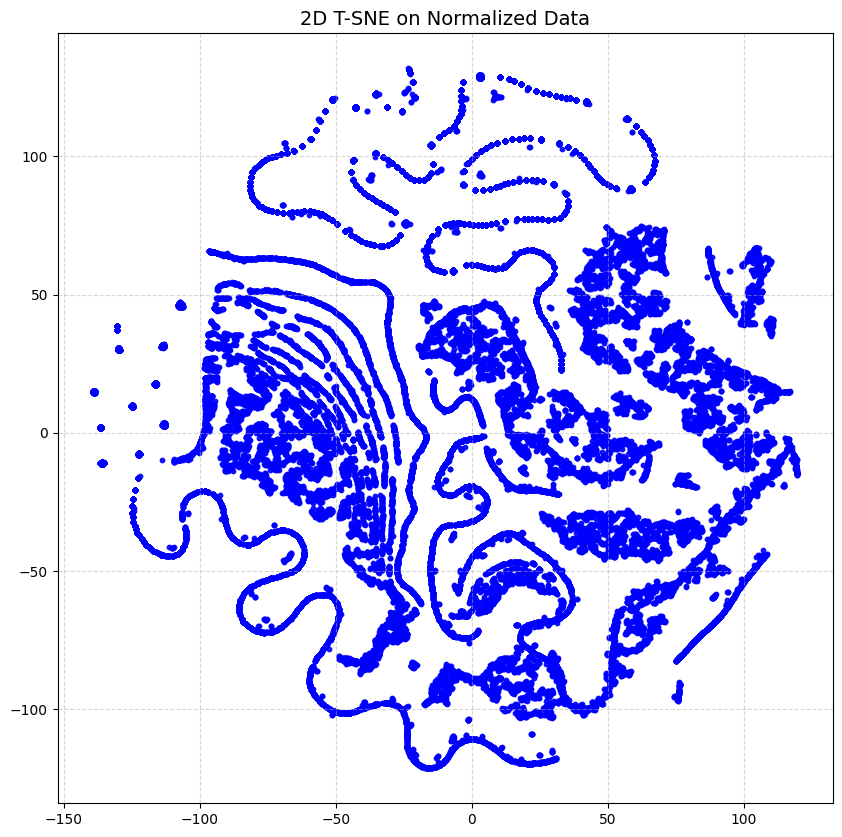

In [ ]:
from pylab import rcParams

# Set figure size
rcParams['figure.figsize'] = 10, 10
fig, ax = plt.subplots()

# Scatter plot
scatter = ax.scatter(X_ts_2d[:, 0],
                     X_ts_2d[:, 1],
                     c='blue',
                     alpha=0.9,
                     cmap=plt.cm.PuOr,
                     s=10)

# Add title
ax.set_title('2D T-SNE on Normalized Data', fontsize=14)

ax.grid(True, linestyle='--', alpha=0.5)  # Add grid with light dashed lines

# Save the figure
#fig.savefig('/content/drive/My Drive/Colab Notebooks/2D/2d_tsne_normalize', dpi=300)

# Show the plot
plt.show()

### Unnormalized

In [ ]:
import plotly.express as px
import pandas as pd
from sklearn.manifold import TSNE
import matplotlib.cm as cm
from matplotlib.colors import Normalize

tsne = TSNE(n_components=2,
            perplexity=50,
            method='barnes_hut',
            random_state=42)
X_ts_2d_unnormalize = tsne.fit_transform(iforest_df_unnormalize)

<ipython-input-54-f9e2a95691a5>:8: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(X_ts_2d_unnormalize[:, 0],


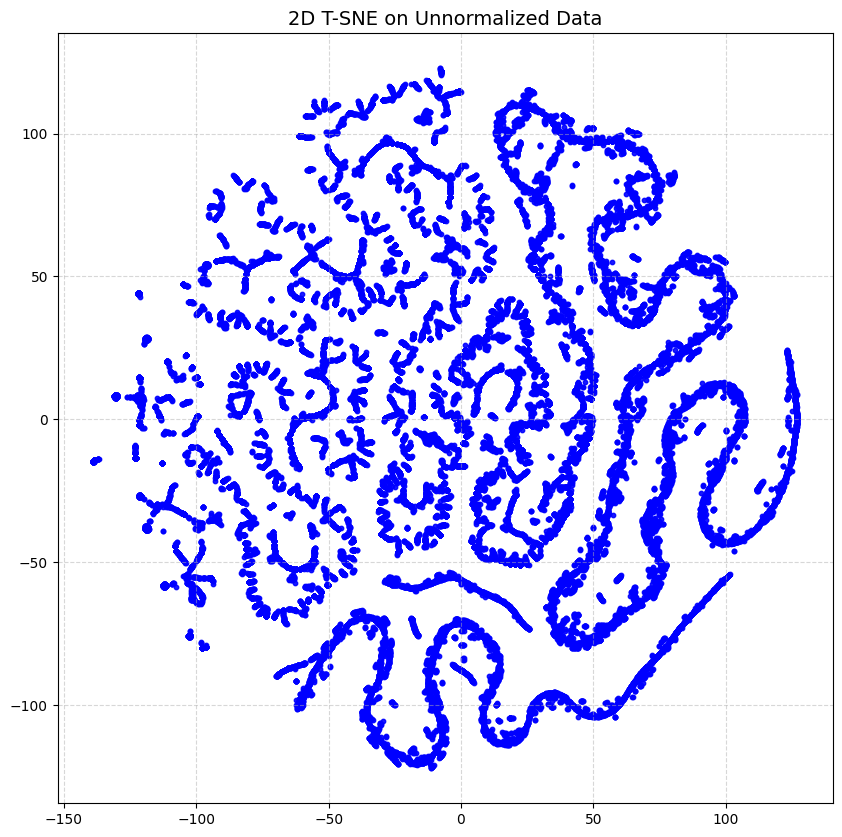

In [ ]:
from pylab import rcParams

# Set figure size
rcParams['figure.figsize'] = 10, 10
fig, ax = plt.subplots()

# Scatter plot
scatter = ax.scatter(X_ts_2d_unnormalize[:, 0],
                     X_ts_2d_unnormalize[:, 1],
                     c='blue',
                     alpha=0.9,
                     cmap=plt.cm.PuOr,
                     s=10)

# Add title
ax.set_title('2D T-SNE on Unnormalized Data', fontsize=14)

ax.grid(True, linestyle='--', alpha=0.5)  # Add grid with light dashed lines

# Save the figure
#fig.savefig('/content/drive/My Drive/Colab Notebooks/2D/2d_tsne_normalize', dpi=300)

# Show the plot
plt.show()

### Unnormalized with Proxy marked

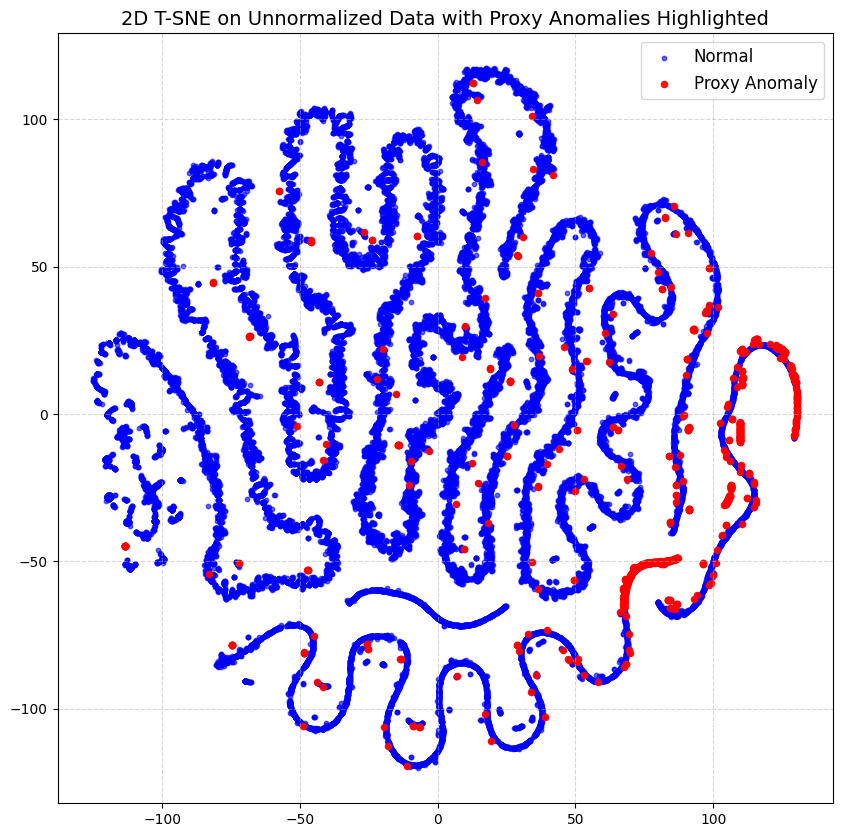

In [ ]:
from pylab import rcParams

# Ensure proxy points are transformed to match t-SNE output
proxy_points = proxy_iforest_df.index

# Set figure size
rcParams['figure.figsize'] = 10, 10
fig, ax = plt.subplots()

# Scatter plot for normal points
scatter = ax.scatter(
    X_ts_2d_unnormalize[:, 0],
    X_ts_2d_unnormalize[:, 1],
    c='blue',
    alpha=0.6,
    s=10,
    label='Normal'
)

# Scatter plot for proxy anomalies
proxy_indices = proxy_points.intersection(iforest_df.index)  # Ensure indices align
proxy_tsne_points = X_ts_2d_unnormalize[proxy_indices]
ax.scatter(
    proxy_tsne_points[:, 0],
    proxy_tsne_points[:, 1],
    c='red',
    alpha=0.9,
    s=20,
    label='Proxy Anomaly'
)

# Add title and legend
ax.set_title('2D T-SNE on Unnormalized Data with Proxy Anomalies Highlighted', fontsize=14)
ax.legend(fontsize=12)

# Add grid
ax.grid(True, linestyle='--', alpha=0.5)

# Show the plot
plt.show()


### Normalized with interactive plot

In [ ]:
import plotly.express as px
import pandas as pd

# Assuming `iforest_df` is your original data frame
# and `X_ts_2d` is the 2D t-SNE result.

# Create a DataFrame for visualization
tsne_df = pd.DataFrame(X_ts_2d, columns=['x', 'y'])
tsne_df = pd.concat([tsne_df, iforest_df_unnormalize_interpret.reset_index(drop=True)], axis=1)

# Plot with Plotly Express
fig = px.scatter(
    tsne_df,
    x='x',
    y='y',
    hover_data={  # Exclude x and y from hover
        'x': False,
        'y': False,
        **{col: True for col in iforest_df_unnormalize_interpret.columns}  # Include only original features
    },
    title='Normalized Interactive 2D t-SNE Plot'
)

# Adjust the figure size (e.g., wider and taller for a rectangular shape)
fig.update_layout(
    width=1000,   # Set the width (adjust as needed)
    height=800,   # Set the height (adjust as needed)
)

# Show the interactive plot
fig.show()

### Unnormalized with interactive plot

In [ ]:
import plotly.express as px
import pandas as pd

# Assuming `iforest_df` is your original data frame
# and `X_ts_2d` is the 2D t-SNE result.

# Create a DataFrame for visualization
tsne_df = pd.DataFrame(X_ts_2d_unnormalize, columns=['x', 'y'])
tsne_df = pd.concat([tsne_df, iforest_df_unnormalize_interpret.reset_index(drop=True)], axis=1)

# Plot with Plotly Express
fig = px.scatter(
    tsne_df,
    x='x',
    y='y',
    hover_data={  # Exclude x and y from hover
        'x': False,
        'y': False,
        **{col: True for col in iforest_df_unnormalize_interpret.columns}  # Include only original features
    },
    title='Unnormalized Interactive 2D t-SNE Plot'
)

# Adjust the figure size (e.g., wider and taller for a rectangular shape)
fig.update_layout(
    width=1000,   # Set the width (adjust as needed)
    height=800,   # Set the height (adjust as needed)
)

# Show the interactive plot
fig.show()

## 3D

In [ ]:
import plotly.express as px
import pandas as pd
from sklearn.manifold import TSNE
import matplotlib.cm as cm
from matplotlib.colors import Normalize

tsne = TSNE(n_components=3,
            perplexity=30,
            n_iter=1000,
            learning_rate=200,
            method='barnes_hut',
            random_state=42)
X_ts_3d = tsne.fit_transform(iforest_df)

In [ ]:
import plotly.express as px
import pandas as pd
import numpy as np

# Assuming `X_ts_2d` is the 2D t-SNE result
# Add a constant third dimension (e.g., z = 0)
X_ts_3d = np.hstack((X_ts_2d, np.zeros((X_ts_2d.shape[0], 1))))

# Create a DataFrame for visualization
tsne_df_3d = pd.DataFrame(X_ts_3d, columns=['x', 'y', 'z'])
tsne_df_3d = pd.concat([tsne_df_3d, iforest_df.reset_index(drop=True)], axis=1)

# Plot with Plotly Express
fig = px.scatter_3d(
    tsne_df_3d,
    x='x',
    y='y',
    z='z',
    hover_data={  # Exclude x, y, z from hover
        'x': False,
        'y': False,
        'z': False,
        **{col: True for col in iforest_df.columns}  # Include only original features
    },
    title='Interactive 3D t-SNE Plot',
)

# Adjust the figure layout for better density and spacing
fig.update_traces(
    marker=dict(
        size=4,            # Adjust point size
        opacity=0.8        # Adjust opacity for better visualization
    )
)

# Adjust layout dimensions
fig.update_layout(
    width=1000,   # Set the width
    height=800,   # Set the height
    scene=dict(   # Adjust axes ranges for consistent scaling
        xaxis=dict(range=[tsne_df_3d['x'].min(), tsne_df_3d['x'].max()]),
        yaxis=dict(range=[tsne_df_3d['y'].min(), tsne_df_3d['y'].max()]),
        zaxis=dict(range=[tsne_df_3d['z'].min(), tsne_df_3d['z'].max()]),
    )
)

# Show the interactive plot
fig.show()

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import pandas as pd

# Assuming `X_ts_2d` is the 2D t-SNE result
# Add a constant third dimension (e.g., z = 0)
X_ts_3d = np.hstack((X_ts_2d, np.zeros((X_ts_2d.shape[0], 1))))

# Create a DataFrame for visualization
tsne_df_3d = pd.DataFrame(X_ts_3d, columns=['x', 'y', 'z'])

# Plot using Matplotlib
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot
sc = ax.scatter(
    tsne_df_3d['x'],
    tsne_df_3d['y'],
    tsne_df_3d['z'],
    s=10,             # Point size
    alpha=0.8,        # Opacity
    c='blue',         # Point color
)

# Set axis labels
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

# Set title
ax.set_title('3D T-SNE on Normalized Data')

# Show the plot
plt.show()

# Deep Isolation Forest

In [ ]:
iforest_df.columns

Index(['speed_range', 'ttc_risk_vehicle_max', 'road_condition_mode_dry',
       'road_condition_mode_wet', 'road_condition_mode_snow_covered',
       'lane_keeping_quality_bad', 'lane_keeping_quality_very_bad',
       'rain_mode_severe_impairment', 'blur_image_mode_severe_impairment',
       'sun_ray_mode_severe_impairment'],
      dtype='object')

In [ ]:
# Total duration (each window is 10s)
print(f"Total duration of the extracted data is: {len(iforest_df)*10/60/60}h")

Total duration of the extracted data is: 114.79722222222222h


In [ ]:
# Define Net Torch

import numpy as np
import torch
import torch_geometric
from torch.nn import functional as F


def choose_net(network_name):
    if network_name == 'mlp':
        return MLPnet
    elif network_name == 'gru':
        return GRUNet
    elif network_name == 'lstm':
        return LSTMNet
    elif network_name == 'gin':
        return GinEncoderGraph
    elif network_name == 'dilated_conv':
        return DilatedConvEncoder
    else:
        raise NotImplementedError("")


def choose_act_func(activation):
    if activation == 'relu':
        act_module = torch.nn.ReLU()
        act_f = torch.relu
    elif activation == 'leaky_relu':
        act_module = torch.nn.LeakyReLU()
        act_f = F.leaky_relu
    elif activation == 'tanh':
        act_module = torch.nn.Tanh()
        act_f = torch.tanh
    elif activation == 'sigmoid':
        act_module = torch.nn.Sigmoid()
        act_f = torch.sigmoid
    else:
        raise NotImplementedError('')
    return act_module, act_f


def choose_pooling_func(pooling):
    if pooling == 'sum':
        pool_f = torch_geometric.nn.global_add_pool
    elif pooling == 'mean':
        pool_f = torch_geometric.nn.global_mean_pool
    elif pooling == 'max':
        pool_f = torch_geometric.nn.global_max_pool
    else:
        raise NotImplementedError('')
    return pool_f


class MLPnet(torch.nn.Module):
    def __init__(self, n_features, n_hidden=[500, 100], n_emb=20, activation='tanh',
                 skip_connection=None, dropout=None, be_size=None):
        super(MLPnet, self).__init__()
        self.skip_connection = skip_connection
        self.n_emb = n_emb

        assert activation in ['relu', 'tanh', 'sigmoid', 'leaky_relu']

        if type(n_hidden)==int: n_hidden = [n_hidden]
        if type(n_hidden)==str: n_hidden = n_hidden.split(','); n_hidden = [int(a) for a in n_hidden]
        num_layers = len(n_hidden)

        self.be_size = be_size

        self.layers = []
        for i in range(num_layers+1):
            in_channels, out_channels = self.get_in_out_channels(i, num_layers, n_features,
                                                                 n_hidden, n_emb, skip_connection)
            self.layers += [LinearBlock(in_channels, out_channels,
                                        activation=activation if i != num_layers else None,
                                        skip_connection=skip_connection if i != num_layers else 0,
                                        dropout=dropout,
                                        be_size=be_size)]
        self.network = torch.nn.Sequential(*self.layers)

    def forward(self, x):
        if self.be_size is not None:
            x = x.repeat(self.be_size, 1)
        x = self.network(x)
        return x

    def get_in_out_channels(self, i, num_layers, n_features, n_hidden, n_emb, skip_connection):
        if skip_connection is None:
            in_channels = n_features if i == 0 else n_hidden[i-1]
            out_channels = n_emb if i == num_layers else n_hidden[i]
        elif skip_connection == 'concat':
            in_channels = n_features if i == 0 else np.sum(n_hidden[:i])+n_features
            out_channels = n_emb if i == num_layers else n_hidden[i]
        else:
            raise NotImplementedError('')
        return in_channels, out_channels


class AEnet(torch.nn.Module):
    def __init__(self, n_features, n_hidden=[500, 100], n_emb=20, activation='tanh',
                 skip_connection=None, be_size=None):
        super(AEnet, self).__init__()
        assert activation in ['tanh', 'relu']
        if type(n_hidden)==int: n_hidden = [n_hidden]
        if type(n_hidden)==str: n_hidden = n_hidden.split(','); n_hidden = [int(a) for a in n_hidden]
        num_layers = len(n_hidden)
        self.be_size = be_size

        self.encoder_layers = []
        for i in range(num_layers+1):
            in_channels = n_features if i == 0 else n_hidden[i-1]
            out_channels = n_emb if i == num_layers else n_hidden[i]
            self.encoder_layers += [LinearBlock(in_channels, out_channels,
                                                bias=False,
                                                activation=activation if i != num_layers else None,
                                                skip_connection=None,
                                                be_size=be_size)]

        self.decoder_layers = []
        for i in range(num_layers+1):
            in_channels = n_emb if i == 0 else n_hidden[num_layers-i]
            out_channels = n_features if i == num_layers else n_hidden[num_layers-1-i]
            self.decoder_layers += [LinearBlock(in_channels, out_channels,
                                                bias=False,
                                                activation=activation if i != num_layers else None,
                                                skip_connection=None,
                                                be_size=be_size)]

        self.encoder = torch.nn.Sequential(*self.encoder_layers)
        self.decoder = torch.nn.Sequential(*self.decoder_layers)

    def forward(self, x):
        if self.be_size is not None:
            x = x.repeat(self.be_size, 1)
        enc = self.encoder(x)
        xx = self.decoder(enc)

        return enc, xx, x


class LinearBlock(torch.nn.Module):
    """
    Linear layer block with support of concatenation-based skip connection and batch ensemble
    Parameters
    ----------
    in_channels: int
        input dimensionality
    out_channels: int
        output dimensionality
    bias: bool (default=False)
        bias term in linear layer
    activation: string, choices=['tanh', 'sigmoid', 'leaky_relu', 'relu'] (default='tanh')
        the name of activation function
    skip_connection: string or None, default=None
        'concat' use concatenation to implement skip connection
    dropout: float or None, default=None
        the dropout rate
    be_size: int or None, default=None
        the number of ensemble size
    """
    def __init__(self, in_channels, out_channels,
                 bias=False, activation='tanh',
                 skip_connection=None, dropout=None, be_size=None):

        super(LinearBlock, self).__init__()

        self.act = activation
        self.skip_connection = skip_connection
        self.dropout = dropout
        self.be_size = be_size

        if activation is not None:
            self.act_layer, _ = choose_act_func(activation)

        if dropout is not None:
            self.dropout_layer = torch.nn.Dropout(p=dropout)

        if be_size is not None:
            bias = False
            self.ri = torch.nn.Parameter(torch.randn(be_size, in_channels))
            self.si = torch.nn.Parameter(torch.randn(be_size, out_channels))

        self.linear = torch.nn.Linear(in_channels, out_channels, bias=bias)

    def forward(self, x):
        if self.be_size is not None:
            R = torch.repeat_interleave(self.ri, int(x.shape[0]/self.be_size), dim=0)
            S = torch.repeat_interleave(self.si, int(x.shape[0]/self.be_size), dim=0)

            x1 = torch.mul(self.linear(torch.mul(x, R)), S)
        else:
            x1 = self.linear(x)

        if self.act is not None:
            x1 = self.act_layer(x1)

        if self.dropout is not None:
            x1 = self.dropout_layer(x1)

        if self.skip_connection == 'concat':
            x1 = torch.cat([x, x1], axis=1)

        return x1


class GRUNet(torch.nn.Module):
    def __init__(self, n_features, hidden_dim=20, layers=1):
        super(GRUNet, self).__init__()
        self.gru = torch.nn.GRU(n_features, hidden_size=hidden_dim, batch_first=True, num_layers=layers)

    def forward(self, x):
        _, hn = self.gru(x)
        return hn[-1]


class LSTMNet(torch.nn.Module):
    def __init__(self, n_features, hidden_dim=20, layers=1, bidirectional=False):
        super(LSTMNet, self).__init__()
        self.bi = bidirectional
        self.lstm = torch.nn.LSTM(n_features, hidden_size=hidden_dim, batch_first=True,
                                  bidirectional=bidirectional, num_layers=layers)

    def forward(self, x):
        output, (hn, c) = self.lstm(x)
        emb = hn[-1]
        if self.bi:
            emb = torch.cat([hn[-2], hn[-1]], dim=1)
        return emb


class SamePadConv(torch.nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, dilation=1, groups=1):
        super().__init__()
        self.receptive_field = (kernel_size - 1) * dilation + 1
        padding = self.receptive_field // 2
        self.conv = torch.nn.Conv1d(
            in_channels, out_channels, kernel_size,
            padding=padding,
            dilation=dilation,
            groups=groups
        )
        self.remove = 1 if self.receptive_field % 2 == 0 else 0

    def forward(self, x):
        out = self.conv(x)
        if self.remove > 0:
            out = out[:, :, : -self.remove]
        return out


class ConvBlock(torch.nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, dilation, final=False):
        super().__init__()
        self.conv1 = SamePadConv(in_channels, out_channels, kernel_size, dilation=dilation)
        self.conv2 = SamePadConv(out_channels, out_channels, kernel_size, dilation=dilation)
        self.projector = torch.nn.Conv1d(in_channels, out_channels, 1) if in_channels != out_channels or final else None

    def forward(self, x):
        residual = x if self.projector is None else self.projector(x)
        x = F.gelu(x)
        x = self.conv1(x)
        x = F.gelu(x)
        x = self.conv2(x)
        return x + residual


class DilatedConvEncoder(torch.nn.Module):
    def __init__(self, n_features, hidden_dim=20, n_emb=20, layers=1, kernel_size=3):
        super().__init__()
        self.input_fc = torch.nn.Linear(n_features, hidden_dim)
        channels = [hidden_dim] * layers + [n_emb]
        self.net = torch.nn.Sequential(*[
            ConvBlock(
                channels[i - 1] if i > 0 else hidden_dim,
                channels[i],
                kernel_size=kernel_size,
                dilation=2 ** i,
                final=(i == len(channels) - 1)
            )
            for i in range(len(channels))
        ])
        self.repr_dropout = torch.nn.Dropout(p=0.1)

    def forward(self, x):
        x = self.input_fc(x)
        x = x.transpose(1, 2)  # B x Ch x T
        x = self.net(x)
        # x = self.repr_dropout(x)
        x = x.transpose(1, 2)

        x = F.max_pool1d(
            x.transpose(1, 2),
            kernel_size=x.size(1)
        ).transpose(1, 2).squeeze(1)
        return x


class GinEncoderGraph(torch.nn.Module):
    def __init__(self, n_features, n_hidden, n_emb, n_layers,
                 pooling='sum', activation='relu'):
        super(GinEncoderGraph, self).__init__()

        assert pooling in ['sum', 'mean', 'max']
        assert activation in ['relu', 'tanh', 'sigmoid', 'leaky_relu']

        self.pooling = pooling
        self.num_gc_layers = n_layers

        self.convs = torch.nn.ModuleList()
        self.bns = torch.nn.ModuleList()

        self.act_module, self.act_f = choose_act_func(activation)
        self.pool_f = choose_pooling_func(pooling)

        for i in range(self.num_gc_layers):
            in_channel = n_features if i == 0 else n_hidden
            out_channel = n_emb if i == n_layers-1 else n_hidden
            nn = torch.nn.Sequential(
                torch.nn.Linear(in_channel, n_hidden, bias=False),
                self.act_module,
                torch.nn.Linear(n_hidden, out_channel, bias=False)
            )
            conv = torch_geometric.nn.GINConv(nn)
            bn = torch.nn.BatchNorm1d(out_channel)
            self.convs.append(conv)
            self.bns.append(bn)

    def forward(self, x, edge_index, batch):
        xs = []
        for i in range(self.num_gc_layers-1):
            x = self.act_f(self.convs[i](x, edge_index))
            x = self.bns[i](x)
            xs.append(x)

        x = self.convs[-1](x, edge_index)
        xs.append(x)

        xpool = self.pool_f(xs[-1], batch)

        return xpool, torch.cat(xs, 1)

In [ ]:
# Define DIF

import numpy as np
import torch
import random
import time
from sklearn.utils import check_array
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import IsolationForest
from tqdm import tqdm
from multiprocessing import Pool
from torch.utils.data import DataLoader
from torch_geometric.loader import DataLoader as pyGDataLoader


class DIF:
    """ Class of Deep isolation forest (DIF)
    DIF proposes a new representation scheme, named random representation ensemble,
    creating a group of random representations by optimisation-free neural networks.
    Random axis-parallel cuts are subsequently applied to perform the data partition.

    This representation scheme facilitates high freedom of the partition in the
    original data space (equivalent to non-linear partition on subspaces of varying sizes),
    encouraging a unique synergy between random representations and random partition-based isolation

    Parameters
    ----------
    network_name: str (default='mlp')
        the used network backbone

    network_class: None or torch.nn.Module class (default=None)
        directly feed a network class

    n_ensemble: int (default=50):
        The number of representations in the ensemble

    n_estimators : int (default=6)
        The number of isolation trees per representation.

    max_samples : int or float, default="auto"
        The number of samples to draw from X to train each base estimator.
            - If int, then draw `max_samples` samples.
            - If float, then draw `max_samples * X.shape[0]` samples.
            - If "auto", then `max_samples=min(256, n_samples)`.

        If max_samples is larger than the number of samples provided,
        all samples will be used for all trees (no sampling).

    hidden_dim: list, default=[500,100]
        the list of units number of hidden layers

    rep_dim: int, default=20
        the dimensionality of representations

    skip_connection: None or str, default=None
        whether use skip connection
            - if "concat", then use concatenation-based skip connection

    dropout: None or float, default=None
        whether use dropout in the network
            - if float, represent the dropout probability

    activation: str, default='tanh'
        the name of activation function, {'relu', 'tanh', 'sigmoid', 'leaky_relu'}

    data_type: str, default='tabular'
        the processed data type, {'tabular', 'ts', 'graph'}

    batch_size: int, default=64
        the number of data objects per mini-batch

    random_state : int, RandomState instance or None, default=42
        Controls the pseudo-randomness of the selection of the feature
        and split values for each branching step and each tree in the forest.
        Pass an int for reproducible results across multiple function calls.

    device: str, default='cuda'
        device for using pytorch, {'cuda', 'cpu'}

    n_processes, int, default=1
        the number of processes during inference

    new_score_func: bool (default=True)
        whether use the proposed new scoring function
        (Deviation-Enhanced Anomaly Scoring function, DEAS)

    new_ensemble_method: bool (default=True)
        whether use the proposed new ensemble method
        (Computational-efficient Representation Ensemble, CERE)

    verbose : int, default=0
        Controls the verbosity

    """
    def __init__(self, network_name='mlp', network_class=None,
                 n_ensemble=50, n_estimators=6, max_samples=256,
                 hidden_dim=[500,100], rep_dim=20, skip_connection=None, dropout=None, activation='tanh',
                 data_type='tabular', batch_size=64,
                 new_score_func=True, new_ensemble_method=True,
                 random_state=42, device='cuda', n_processes=1,
                 verbose=0, **network_args):
        # super(DeepIsolationForest, self).__init__(contamination=contamination)

        if data_type not in ['tabular', 'graph', 'ts']:
            raise NotImplementedError('unsupported data type')

        self.data_type = data_type
        self.n_ensemble = n_ensemble
        self.n_estimators = n_estimators
        self.max_samples = max_samples
        self.batch_size = batch_size

        self.new_score_func = new_score_func
        self.new_ensemble_method = new_ensemble_method

        self.device = device
        self.n_processes = n_processes
        self.verbose = verbose

        self.network_args = network_args
        self.Net = choose_net(network_name)
        if network_name == 'mlp':
            self.network_args['n_hidden'] = hidden_dim
            self.network_args['n_emb'] = rep_dim
            self.network_args['skip_connection'] = skip_connection
            self.network_args['dropout'] = dropout
            self.network_args['activation'] = activation
            self.network_args['be_size'] = None if self.new_ensemble_method == False else self.n_ensemble
        elif network_name == 'gin':
            self.network_args['activation'] = activation
        elif network_name == 'dilated_conv':
            self.network_args['hidden_dim'] = hidden_dim
            self.network_args['n_emb'] = rep_dim
        if network_class is not None:
            self.Net = network_class
        print(f'network additional parameters: {network_args}')

        self.transfer_flag = True

        self.n_features = -1
        self.net_lst = []
        self.clf_lst = []
        self.x_reduced_lst = []
        self.score_lst = []

        self.set_seed(random_state)
        return

    def fit(self, X, y=None):
        """
        Fit detector. y is ignored in unsupervised methods.
        Parameters
        ----------
        X : numpy array of shape (n_samples, n_features)
            The input samples.
        y : Ignored
            Not used, present for API consistency by convention.
        Returns
        -------
        self : object
            Fitted estimator.
        """
        start_time = time.time()
        self.n_features = X.shape[-1] if self.data_type != 'graph' else max(X.num_features, 1)
        ensemble_seeds = np.random.randint(0, 1e+5, self.n_ensemble)

        if self.verbose >= 2:
            net = self.Net(n_features=self.n_features, **self.network_args)
            print(net)

        self._training_transfer(X, ensemble_seeds)

        if self.verbose >= 2:
            it = tqdm(range(self.n_ensemble), desc='clf fitting', ncols=80)
        else:
            it = range(self.n_ensemble)

        for i in it:
            self.clf_lst.append(
                IsolationForest(n_estimators=self.n_estimators,
                                max_samples=self.max_samples,
                                random_state=ensemble_seeds[i])
            )
            self.clf_lst[i].fit(self.x_reduced_lst[i])

        if self.verbose >= 1:
            print(f'training done, time: {time.time()-start_time:.1f}')
        return self

    def decision_function(self, X):
        """Predict raw anomaly score of X using the fitted detector.
        The anomaly score of an input sample is computed based on different
        detector algorithms. For consistency, outliers are assigned with
        larger anomaly scores.
        Parameters
        ----------
        X : numpy array of shape (n_samples, n_features)
            The training input samples. Sparse matrices are accepted only
            if they are supported by the base estimator.
        Returns
        -------
        anomaly_scores : numpy array of shape (n_samples,)
            The anomaly score of the input samples.
        """

        test_reduced_lst = self._inference_transfer(X)
        final_scores = self._inference_scoring(test_reduced_lst, n_processes=self.n_processes)
        return final_scores

    def _training_transfer(self, X, ensemble_seeds):
        if self.new_ensemble_method:
            self.set_seed(ensemble_seeds[0])
            net = self.Net(n_features=self.n_features, **self.network_args).to(self.device)
            self.net_init(net)

            self.x_reduced_lst = self.deep_transfer_batch_ensemble(X, net)
            self.net_lst.append(net)
        else:
            for i in tqdm(range(self.n_ensemble), desc='training ensemble process', ncols=100, leave=None):
                self.set_seed(ensemble_seeds[i])
                net = self.Net(n_features=self.n_features, **self.network_args).to(self.device)
                self.net_init(net)

                self.x_reduced_lst.append(self.deep_transfer(X, net))
                self.net_lst.append(net)
        return

    def _inference_transfer(self, X):
        if self.data_type == 'tabular' and X.shape[0] == self.x_reduced_lst[0].shape[0]:
            return self.x_reduced_lst

        test_reduced_lst = []
        if self.new_ensemble_method:
            test_reduced_lst = self.deep_transfer_batch_ensemble(X, self.net_lst[0])
        else:
            for i in tqdm(range(self.n_ensemble), desc='testing ensemble process', ncols=100, leave=None):
                x_reduced = self.deep_transfer(X, self.net_lst[i])
                test_reduced_lst.append(x_reduced)
        return test_reduced_lst

    def _inference_scoring(self, x_reduced_lst, n_processes):
        if self.new_score_func:
            score_func = self.single_predict
        else:
            score_func = self.single_predict_abla

        n_samples = x_reduced_lst[0].shape[0]
        self.score_lst = np.zeros([self.n_ensemble, n_samples])
        if n_processes == 1:
            for i in range(self.n_ensemble):
                scores = score_func(x_reduced_lst[i], self.clf_lst[i])
                self.score_lst[i] = scores
        else:
            # multiprocessing predict
            start = np.arange(0, self.n_ensemble, np.ceil(self.n_ensemble / n_processes))
            for j in range(int(np.ceil(self.n_ensemble / n_processes))):
                run_id = start + j
                run_id = np.array(np.delete(run_id, np.where(run_id >= self.n_ensemble)), dtype=int)
                if self.verbose >= 1:
                    print('Multi-processing Running ensemble id :', run_id)

                pool = Pool(processes=n_processes)
                process_lst = [pool.apply_async(score_func, args=(x_reduced_lst[i], self.clf_lst[i]))
                               for i in run_id]
                pool.close()
                pool.join()

                for rid, process in zip(run_id, process_lst):
                    self.score_lst[rid] = process.get()

        final_scores = np.average(self.score_lst, axis=0)

        return final_scores


    def deep_transfer(self, X, net):
        x_reduced = []

        with torch.no_grad():
            if self.data_type != 'graph':
                loader = DataLoader(X, batch_size=self.batch_size, drop_last=False, pin_memory=True, shuffle=False)
                for batch_x in loader:
                    batch_x = batch_x.float().to(self.device)
                    batch_x_reduced = net(batch_x)
                    x_reduced.append(batch_x_reduced)
            else:
                loader = pyGDataLoader(X, batch_size=self.batch_size, shuffle=False, pin_memory=True, drop_last=False)
                for data in loader:
                    data.to(self.device)
                    x, edge_index, batch = data.x, data.edge_index, data.batch
                    if x is None:
                        x = torch.ones((batch.shape[0], 1)).to(self.device)
                    x, _ = net(x, edge_index, batch)
                    x_reduced.append(x)

        x_reduced = torch.cat(x_reduced).data.cpu().numpy()
        x_reduced = StandardScaler().fit_transform(x_reduced)
        x_reduced = np.tanh(x_reduced)
        return x_reduced

    def deep_transfer_batch_ensemble(self, X, net):
        x_reduced = []

        with torch.no_grad():
            loader = DataLoader(X, batch_size=self.batch_size, drop_last=False, pin_memory=True, shuffle=False)
            for batch_x in loader:
                batch_x = batch_x.float().to(self.device)
                batch_x_reduced = net(batch_x)

                batch_x_reduced = batch_x_reduced.reshape([self.n_ensemble, batch_x.shape[0], -1])
                x_reduced.append(batch_x_reduced)

        x_reduced_lst = [torch.cat([x_reduced[i][j] for i in range(len(x_reduced))]).data.cpu().numpy()
                         for j in range(x_reduced[0].shape[0])]

        for i in range(len(x_reduced_lst)):
            xx = x_reduced_lst[i]
            xx = StandardScaler().fit_transform(xx)
            xx = np.tanh(xx)
            x_reduced_lst[i] = xx

        return x_reduced_lst

    @staticmethod
    def net_init(net):
        for name, param in net.named_parameters():
            if name.endswith('weight'):
                torch.nn.init.normal_(param, mean=0., std=1.)
        return

    @staticmethod
    def set_seed(seed):
        torch.manual_seed(seed)
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)
        np.random.seed(seed)
        random.seed(seed)

    @staticmethod
    def single_predict_abla(x_reduced, clf):
        scores = clf.decision_function(x_reduced)
        scores = -1 * scores
        return scores

    @staticmethod
    def single_predict(x_reduced, clf):
        scores = _cal_score(x_reduced, clf)
        return scores


def _cal_score(xx, clf):
    depths = np.zeros((xx.shape[0], len(clf.estimators_)))
    depth_sum = np.zeros(xx.shape[0])
    deviations = np.zeros((xx.shape[0], len(clf.estimators_)))
    leaf_samples = np.zeros((xx.shape[0], len(clf.estimators_)))

    for ii, estimator_tree in enumerate(clf.estimators_):
        # estimator_population_ind = sample_without_replacement(n_population=xx.shape[0], n_samples=256,
        #                                                       random_state=estimator_tree.random_state)
        # estimator_population = xx[estimator_population_ind]

        tree = estimator_tree.tree_
        n_node = tree.node_count

        if n_node == 1:
            continue

        # get feature and threshold of each node in the iTree
        # in feature_lst, -2 indicates the leaf node
        feature_lst, threshold_lst = tree.feature.copy(), tree.threshold.copy()

        #     feature_lst = np.zeros(n_node, dtype=int)
        #     threshold_lst = np.zeros(n_node)
        #     for j in range(n_node):
        #         feature, threshold = tree.feature[j], tree.threshold[j]
        #         feature_lst[j] = feature
        #         threshold_lst[j] = threshold
        #         # print(j, feature, threshold)
        #         if tree.children_left[j] == -1:
        #             leaf_node_list.append(j)

        # compute depth and score
        leaves_index = estimator_tree.apply(xx)
        node_indicator = estimator_tree.decision_path(xx)

        # The number of training samples in each test sample leaf
        n_node_samples = estimator_tree.tree_.n_node_samples

        # node_indicator is a sparse matrix with shape (n_samples, n_nodes), indicating the path of input data samples
        # each layer would result in a non-zero element in this matrix,
        # and then the row-wise summation is the depth of data sample
        n_samples_leaf = estimator_tree.tree_.n_node_samples[leaves_index]
        d = (np.ravel(node_indicator.sum(axis=1)) + _average_path_length(n_samples_leaf) - 1.0)
        depths[:, ii] = d
        depth_sum += d

        # decision path of data matrix XX
        node_indicator = np.array(node_indicator.todense())

        # set a matrix with shape [n_sample, n_node], representing the feature value of each sample on each node
        # set the leaf node as -2
        value_mat = np.array([xx[i][feature_lst] for i in range(xx.shape[0])])
        value_mat[:, np.where(feature_lst == -2)[0]] = -2
        th_mat = np.array([threshold_lst for _ in range(xx.shape[0])])

        mat = np.abs(value_mat - th_mat) * node_indicator

        # dev_mat = np.abs(value_mat - th_mat)
        # m = np.mean(dev_mat, axis=0)
        # s = np.std(dev_mat, axis=0)
        # dev_mat_mean = np.array([m for _ in range(xx.shape[0])])
        # dev_mat_std = np.array([s for _ in range(xx.shape[0])])
        # dev_mat_zscore = np.maximum((dev_mat - dev_mat_mean) / (dev_mat_std+1e-6), 0)
        # mat = dev_mat_zscore * node_indicator

        exist = (mat != 0)
        dev = mat.sum(axis=1)/(exist.sum(axis=1)+1e-6)
        deviations[:, ii] = dev

        # # slow implementation of deviation calculation
        # t1 = time.time()
        # # calculate deviation in each node of the path
        # # node_deviation_matrix = np.full([xx.shape[0], node_indicator.shape[1]], np.nan)
        # for j in range(xx.shape[0]):
        #     node = np.where(node_indicator[j] == 1)[0]
        #     this_feature_lst = feature_lst[node]
        #     this_threshold_lst = threshold_lst[node]
        #     n_samples_lst = n_node_samples[node]
        #     leaf_samples[j][ii] = n_samples_lst[-1]
        #
        #     deviation = np.abs(xx[j][this_feature_lst[:-1]] - this_threshold_lst[:-1])
        #     if deviation.shape[0] == 0:
        #         print(this_feature_lst[:-1]);print(feature_lst, n_node)
        #
        #     # # directly use mean
        #     deviation = np.mean(deviation)
        #     deviations[j][ii] = deviation
        # print(2, time.time() - t1)

        # # padding node deviation matrix, and use node mean
        # node_deviation_matrix = pd.DataFrame(node_deviation_matrix)
        # for c in node_deviation_matrix.columns:
        #     node_deviation_matrix[c] = node_deviation_matrix[c].fillna(node_deviation_matrix[c].mean())
        #     if pd.isna(node_deviation_matrix[c].mean()):
        #         node_deviation_matrix.drop(c, axis=1, inplace=True)
        #         # node_deviation_matrix[c] = 0
        # node_deviation_matrix = node_deviation_matrix.values
        # deviations[:, ii] = np.mean(node_deviation_matrix, axis=1)

    scores = 2 ** (-depth_sum / (len(clf.estimators_) * _average_path_length([clf.max_samples_])))
    deviation = np.mean(deviations, axis=1)
    leaf_sample = (clf.max_samples_ - np.mean(leaf_samples, axis=1)) / clf.max_samples_

    # print()
    # print('s', scores)
    # print(deviation)
    # print(leaf_sample)

    scores = scores * deviation
    return scores


def _average_path_length(n_samples_leaf):
    """
    The average path length in a n_samples iTree, which is equal to
    the average path length of an unsuccessful BST search since the
    latter has the same structure as an isolation tree.
    Parameters
    ----------
    n_samples_leaf : array-like of shape (n_samples,)
        The number of training samples in each test sample leaf, for
        each estimators.

    Returns
    -------
    average_path_length : ndarray of shape (n_samples,)
    """

    n_samples_leaf = check_array(n_samples_leaf, ensure_2d=False)

    n_samples_leaf_shape = n_samples_leaf.shape
    n_samples_leaf = n_samples_leaf.reshape((1, -1))
    average_path_length = np.zeros(n_samples_leaf.shape)

    mask_1 = n_samples_leaf <= 1
    mask_2 = n_samples_leaf == 2
    not_mask = ~np.logical_or(mask_1, mask_2)

    average_path_length[mask_1] = 0.
    average_path_length[mask_2] = 1.
    average_path_length[not_mask] = (
        2.0 * (np.log(n_samples_leaf[not_mask] - 1.0) + np.euler_gamma)
        - 2.0 * (n_samples_leaf[not_mask] - 1.0) / n_samples_leaf[not_mask]
    )

    return average_path_length.reshape(n_samples_leaf_shape)

In [ ]:
# Prepare the data
iforest_df_array = iforest_df.values  # Convert the dataframe to a numpy array

# Configure and train the DIF model
dif_configs = {'n_ensemble': 50, 'n_estimators': 6, 'random_state': 42, 'max_samples': 'auto'}  # Define model configurations
model_dif = DIF(**dif_configs)  # Initialize the DIF model

network additional parameters: {'n_hidden': [500, 100], 'n_emb': 20, 'skip_connection': None, 'dropout': None, 'activation': 'tanh', 'be_size': 50}


In [ ]:
model_dif.fit(iforest_df_array)  # Train the model on the entire dataset

<ipython-input-57-074b5bc1ef2c>:337: DeprecationWarning: Seeding based on hashing is deprecated
since Python 3.9 and will be removed in a subsequent version. The only 
supported seed types are: None, int, float, str, bytes, and bytearray.
  random.seed(seed)


In [ ]:
# Get anomaly scores
scores_dif = model_dif.decision_function(iforest_df_array)
scores_dif

array([0.22020621, 0.228076  , 0.2124543 , ..., 0.21219714, 0.21889813,
       0.33849362])

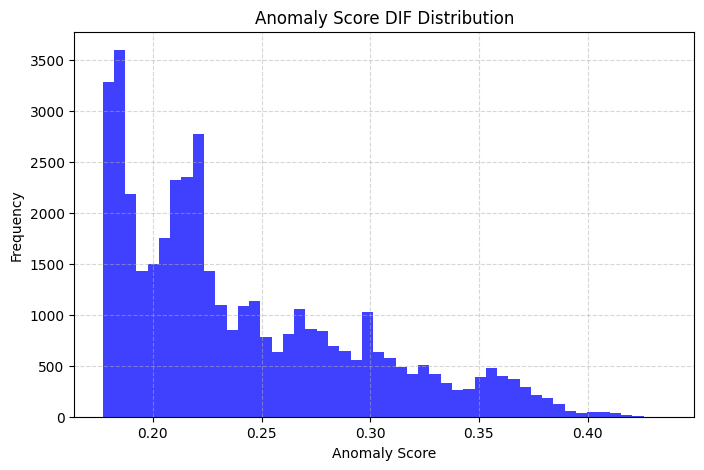

In [ ]:
import matplotlib.pyplot as plt

# Assuming `score` is the array of anomaly scores from the model.
# Example anomaly score data (you should replace this with your `score` array)
import numpy as np
#score = np.random.normal(loc=0, scale=1, size=1000)  # Replace with your anomaly scores

# Plotting the distribution of anomaly scores
plt.figure(figsize=(8, 5))
plt.hist(scores_dif, bins=50, alpha=0.75, color='blue')
plt.title("Anomaly Score DIF Distribution")
plt.xlabel("Anomaly Score")
plt.ylabel("Frequency")
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()


In [ ]:
import numpy as np

# Assuming `scores_dif` is your array of anomaly scores
# Calculate the threshold for the top 1% anomalies
threshold_dif = np.percentile(scores_dif, 95)

# Print the threshold value
print(f"Threshold for top 1% anomalies: {threshold_dif}")

# You can identify anomalies using the threshold
anomalies_dif_array = scores_dif[scores_dif > threshold_dif]

# Count the number of anomalies
print(f"Number of anomalies: {len(anomalies_dif_array)}")

# (Optional) label the scores as anomaly (1) or normal (0)
labels_dif = (scores_dif > threshold_dif).astype(int)

# Verify the proportion of anomalies
anomaly_dif_percentage = (labels_dif.sum() / len(scores_dif)) * 100
print(f"Percentage of anomalies: {anomaly_dif_percentage:.2f}%")

Threshold for top 1% anomalies: 0.3555573965252876
Number of anomalies: 2067
Percentage of anomalies: 5.00%


In [ ]:
data_dif = iforest_df.copy()
data_dif['anomaly_score'] = scores_dif

In [ ]:
# Create a boolean mask for rows that are anomalies
anomalies_dif_mask = scores_dif > threshold_dif

# Extract the anomalies as a new dataframe
anomalies_dif = data_dif[anomalies_dif_mask]

In [ ]:
# Create a boolean mask for rows that are normal (not anomalies)
normal_dif_mask = scores_dif <= threshold_dif

# Extract the normal rows as a new dataframe
normal_dif = data_dif[normal_dif_mask]

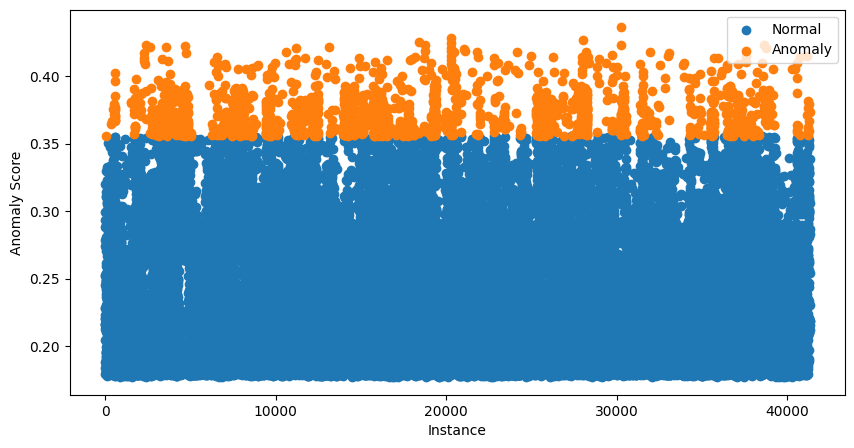

In [ ]:
# Visualization of the results
plt.figure(figsize=(10, 5))

# Plot normal instances
plt.scatter(normal_dif.index, normal_dif['anomaly_score'], label='Normal')

# Plot anomalies
plt.scatter(anomalies_dif.index, anomalies_dif['anomaly_score'], label='Anomaly')

plt.xlabel("Instance")
plt.ylabel("Anomaly Score")
plt.legend()
plt.show()

# Isolation Forest

In [ ]:
iforest_df.columns

Index(['speed_range', 'ttc_risk_vehicle_max', 'road_condition_mode_dry',
       'road_condition_mode_wet', 'road_condition_mode_snow_covered',
       'lane_keeping_quality_bad', 'lane_keeping_quality_very_bad',
       'rain_mode_severe_impairment', 'blur_image_mode_severe_impairment',
       'sun_ray_mode_severe_impairment'],
      dtype='object')

In [ ]:
import pandas as pd
from sklearn.ensemble import IsolationForest


# Isolation Forest parameters
n_estimators = 300  # Number of trees in the forest
max_samples = 256  # 'auto' will use min(256, n_samples) to fit each base estimator,
max_features = 0.8
contamination = 0.05  # Proportion of outliers; tune based on your needs
random_state = 42  # For reproducibility

# Instantiate and fit Isolation Forest
model_if = IsolationForest(
    n_estimators=n_estimators,
    max_samples=max_samples,
    max_features=max_features,
    contamination=contamination,
    random_state=random_state)

model_if.fit(iforest_df)

IsolationForest(contamination=0.05, max_features=0.8, max_samples=256,
                n_estimators=300, random_state=42)

In [ ]:
data_if = iforest_df.copy()
data_if['anomaly_score'] = model_if.decision_function(iforest_df)
data_if['anomaly'] = model_if.predict(iforest_df)

In [ ]:
normal_if = data_if[data_if['anomaly'] == 1]
anomalies_if = data_if[data_if['anomaly'] == -1]

In [ ]:
scores_if = model_if.decision_function(iforest_df)

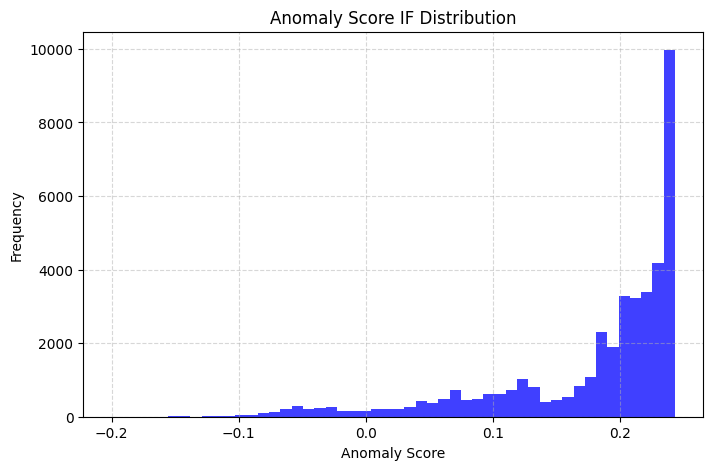

In [ ]:
import matplotlib.pyplot as plt

# Assuming `score` is the array of anomaly scores from the model.
# Example anomaly score data (you should replace this with your `score` array)
import numpy as np
#score = np.random.normal(loc=0, scale=1, size=1000)  # Replace with your anomaly scores

# Plotting the distribution of anomaly scores
plt.figure(figsize=(8, 5))
plt.hist(scores_if, bins=50, alpha=0.75, color='blue')
plt.title("Anomaly Score IF Distribution")
plt.xlabel("Anomaly Score")
plt.ylabel("Frequency")
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()

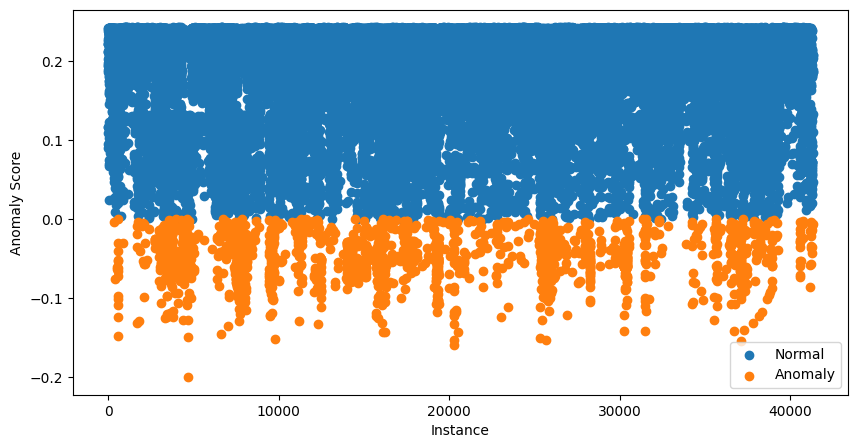

In [ ]:
# Visualization of the results
plt.figure(figsize=(10, 5))

# Plot normal instances
plt.scatter(normal_if.index, normal_if['anomaly_score'], label='Normal')

# Plot anomalies
plt.scatter(anomalies_if.index, anomalies_if['anomaly_score'], label='Anomaly')

plt.xlabel("Instance")
plt.ylabel("Anomaly Score")
plt.legend()
plt.show()

# LOF

In [ ]:
import pandas as pd
import numpy as np
from sklearn.neighbors import LocalOutlierFactor

# LOF setup
n_neighbors = 20  # Number of neighbors to consider
contamination = 0.05  # Proportion of anomalies in the data
distance ='hamming' # Best for categorical features

model_lof = LocalOutlierFactor(
    n_neighbors=n_neighbors,
    contamination=contamination,
    metric=distance,
    novelty=True  # Set to False as LOF does not directly support prediction on new data
)

# Fit LOF and predict anomalies
model_lof.fit(iforest_df)  # -1: anomaly, 1: normal

LocalOutlierFactor(contamination=0.05, metric='hamming', novelty=True)

In [ ]:
data_lof = iforest_df.copy()
data_lof['anomaly_score'] = model_lof.decision_function(iforest_df)
data_lof['anomaly'] = model_lof.predict(iforest_df)

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LocalOutlierFactor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LocalOutlierFactor was fitted with feature names
  warnings.warn(


In [ ]:
scores_lof = model_lof.decision_function(iforest_df)

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LocalOutlierFactor was fitted with feature names
  warnings.warn(


In [ ]:
normal_lof = data_lof[data_lof['anomaly'] == 1]
anomalies_lof = data_lof[data_lof['anomaly'] == -1]

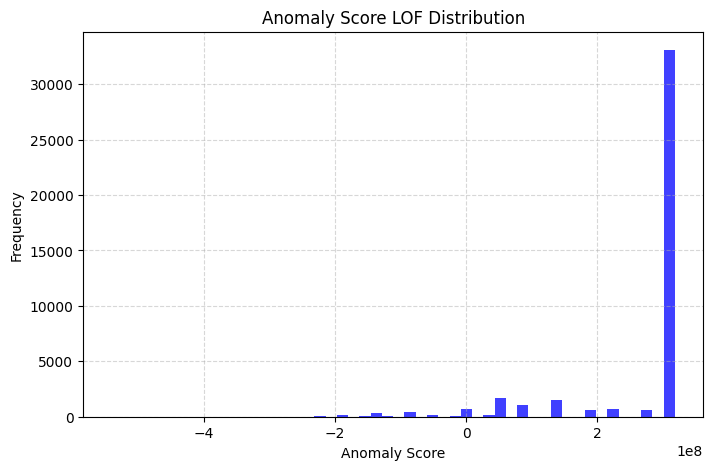

In [ ]:
import matplotlib.pyplot as plt

# Assuming `score` is the array of anomaly scores from the model.
# Example anomaly score data (you should replace this with your `score` array)
import numpy as np
#score = np.random.normal(loc=0, scale=1, size=1000)  # Replace with your anomaly scores

# Plotting the distribution of anomaly scores
plt.figure(figsize=(8, 5))
plt.hist(scores_lof, bins=50, alpha=0.75, color='blue')
plt.title("Anomaly Score LOF Distribution")
plt.xlabel("Anomaly Score")
plt.ylabel("Frequency")
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()

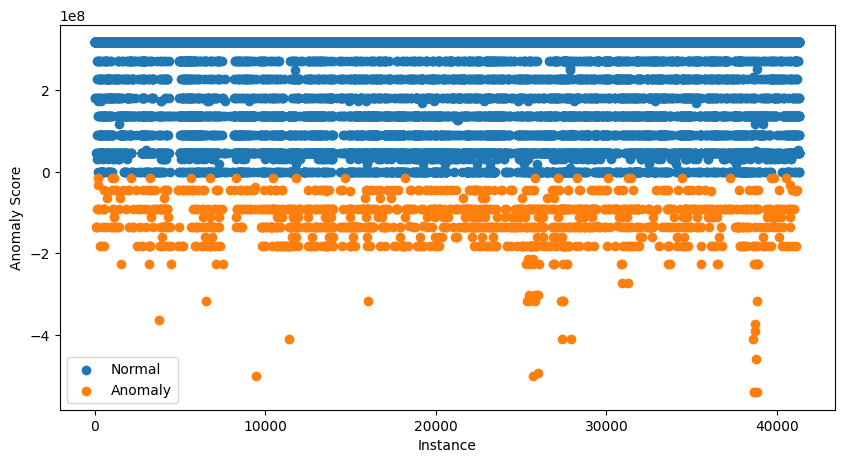

In [ ]:
# Visualization of the results
plt.figure(figsize=(10, 5))

# Plot normal instances
plt.scatter(normal_lof.index, normal_lof['anomaly_score'], label='Normal')

# Plot anomalies
plt.scatter(anomalies_lof.index, anomalies_lof['anomaly_score'], label='Anomaly')

plt.xlabel("Instance")
plt.ylabel("Anomaly Score")
plt.legend()
plt.show()

In [ ]:
len(anomalies_lof)

1969

# KNN

In [ ]:
import pandas as pd
import numpy as np
from sklearn.neighbors import NearestNeighbors


# KNN setup
n_neighbors = 5  # You can adjust this parameter
distance = 'manhattan' #

# Fit KNN
knn = NearestNeighbors(n_neighbors=n_neighbors, metric=distance)
knn.fit(iforest_df)

# Calculate distances to the n_neighbors
distances, indices = knn.kneighbors(iforest_df)

# Calculate the mean distance to n_neighbors for each point
mean_distances = distances.mean(axis=1)

# Define a threshold for anomalies
percentile = 95
threshold = np.percentile(mean_distances, percentile)
anomalies = mean_distances > threshold

# Output anomalies
print(f"Number of anomalies detected: {np.sum(anomalies)}")
print("Min distance:", mean_distances.min())
print("Max distance:", mean_distances.max())
print("Threshold:", threshold)

Number of anomalies detected: 2067
Min distance: 0.0
Max distance: 11.643479263993441
Threshold: 0.08383139512832792


In [ ]:
# Calculate distances to the n_neighbors
distances, indices = knn.kneighbors(iforest_df)

# Calculate the mean distance to n_neighbors for each point
mean_distances = distances.mean(axis=1)

# Define scores as the mean distances
scores_knn = mean_distances

In [ ]:
data_knn = iforest_df.copy()
anomalies_knn = data_knn[anomalies]
normal_knn = data_knn[~anomalies]

# OC-SVM

In [ ]:
from sklearn.svm import OneClassSVM
import numpy as np

# Define the model
model_ocsvm = OneClassSVM(
    kernel='rbf',            # Common kernel for non-linear data
    nu=0.05,                 # Proportion of anomalies (similar to contamination)
    gamma='scale'            # Kernel coefficient (auto-tuned with 'scale' or 'auto')
)

# Fit the model on your data
model_ocsvm.fit(iforest_df)

# Predict anomalies (-1 = anomaly, 1 = normal)
predictions = model_ocsvm.predict(iforest_df)

# Get anomaly scores (lower values = more anomalous)
scores_ocsvm = model_ocsvm.decision_function(iforest_df)

# Define threshold for anomalies (optional, if want custom logic)
#threshold = np.percentile(scores_ocsvm, 1)  # Top 5% as anomalies
#custom_anomalies = anomaly_scores < threshold

# Output results
print(f"Number of anomalies detected: {np.sum(predictions == -1)}")

Number of anomalies detected: 2078


In [ ]:
data_ocsvm = iforest_df.copy()
data_ocsvm['anomaly_score'] = model_ocsvm.decision_function(iforest_df)
data_ocsvm['anomaly'] = model_ocsvm.predict(iforest_df)

In [ ]:
normal_ocsvm = data_ocsvm[data_ocsvm['anomaly'] == 1]
anomalies_ocsvm = data_ocsvm[data_ocsvm['anomaly'] == -1]

# Cross Validation

In [ ]:
iforest_df.columns

Index(['speed_range', 'ttc_risk_vehicle_max', 'road_condition_mode_dry',
       'road_condition_mode_wet', 'road_condition_mode_snow_covered',
       'lane_keeping_quality_bad', 'lane_keeping_quality_very_bad',
       'rain_mode_severe_impairment', 'blur_image_mode_severe_impairment',
       'sun_ray_mode_severe_impairment'],
      dtype='object')

In [ ]:
import pandas as pd
import itertools

# Columns considered for cross-product counting
columns = ['rain_mode_severe_impairment',
           'blur_image_mode_severe_impairment',
           'sun_ray_mode_severe_impairment',

           'road_condition_mode_dry',
           'road_condition_mode_wet',
           'road_condition_mode_snow_covered',

           'lane_keeping_quality_good', 'lane_keeping_quality_bad', 'lane_keeping_quality_very_bad']

# Get all unique values for each signal
unique_values = {col: iforest_df[col].unique() for col in columns}

# Cross-product of all possible combinations
all_combinations = pd.DataFrame(list(itertools.product(*unique_values.values())), columns=columns)

# Count the actual occurrences in the dataframe
combination_counts = iforest_df.groupby(columns).size().reset_index(name='Counts')

# Merge the cross-product with the actual counts, filling missing combinations with zero frequency
cross_product_counts = pd.merge(all_combinations, combination_counts, on=columns, how='left').fillna(0)

# Sort by Frequency
cross_product_counts = cross_product_counts.sort_values(by='Counts', ascending=False).reset_index(drop=True)

In [ ]:
cross_product_counts

,rain_mode_severe_impairment,blur_image_mode_severe_impairment,sun_ray_mode_severe_impairment,road_condition_mode_dry,road_condition_mode_wet,road_condition_mode_snow_covered,lane_keeping_quality_good,lane_keeping_quality_bad,lane_keeping_quality_very_bad,Counts
0,0,0,0,1,0,0,1,0,0,34637.0
1,0,0,0,0,1,0,1,0,0,5019.0
2,0,0,0,0,0,1,1,0,0,895.0
3,1,0,0,0,1,0,1,0,0,267.0
4,0,0,0,1,0,0,0,1,0,139.0
...,...,...,...,...,...,...,...,...,...,...
507,0,1,0,0,0,1,1,1,0,0.0
508,0,1,0,0,0,1,1,0,1,0.0
509,0,1,0,0,0,0,0,1,1,0.0
510,0,1,0,0,0,0,0,1,0,0.0


In [ ]:
import pandas as pd

# Temporarily display all rows and columns
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(cross_product_counts)

,rain_mode_severe_impairment,blur_image_mode_severe_impairment,sun_ray_mode_severe_impairment,road_condition_mode_dry,road_condition_mode_wet,road_condition_mode_snow_covered,lane_keeping_quality_good,lane_keeping_quality_bad,lane_keeping_quality_very_bad,Counts
0,0,0,0,1,0,0,1,0,0,34637.0
1,0,0,0,0,1,0,1,0,0,5019.0
2,0,0,0,0,0,1,1,0,0,895.0
3,1,0,0,0,1,0,1,0,0,267.0
4,0,0,0,1,0,0,0,1,0,139.0
5,0,1,0,1,0,0,1,0,0,123.0
6,0,0,1,1,0,0,1,0,0,64.0
7,1,0,0,1,0,0,1,0,0,60.0
8,0,1,0,0,1,0,1,0,0,53.0
9,0,0,0,0,1,0,0,1,0,28.0


In [ ]:
# Get unique signal combination from predicted anomalies
#anomaly_combinations = iforest_df.loc[anomaly_indices, columns]
anomaly_combinations = anomalies_dif[columns].drop_duplicates()

# Copy of cross tabulation
cross_product_counts_new = cross_product_counts.copy()

# Merge with the cross-product DataFrame to see their frequency
anomalous_frequencies = pd.merge(anomaly_combinations, cross_product_counts_new, on=columns, how='inner')

# Find the matching rows in cross_product_counts and get their indices
matching_indices = cross_product_counts_new.set_index(columns).index.isin(anomaly_combinations.set_index(columns).index)

# Extract the indices from cross_product_counts
matching_rows_in_cross_product = cross_product_counts_new[matching_indices]

In [ ]:
matching_rows_in_cross_product

,rain_mode_severe_impairment,blur_image_mode_severe_impairment,sun_ray_mode_severe_impairment,road_condition_mode_dry,road_condition_mode_wet,road_condition_mode_snow_covered,lane_keeping_quality_good,lane_keeping_quality_bad,lane_keeping_quality_very_bad,Counts
0,0,0,0,1,0,0,1,0,0,34637.0
1,0,0,0,0,1,0,1,0,0,5019.0
2,0,0,0,0,0,1,1,0,0,895.0
3,1,0,0,0,1,0,1,0,0,267.0
4,0,0,0,1,0,0,0,1,0,139.0
5,0,1,0,1,0,0,1,0,0,123.0
6,0,0,1,1,0,0,1,0,0,64.0
7,1,0,0,1,0,0,1,0,0,60.0
8,0,1,0,0,1,0,1,0,0,53.0
9,0,0,0,0,1,0,0,1,0,28.0


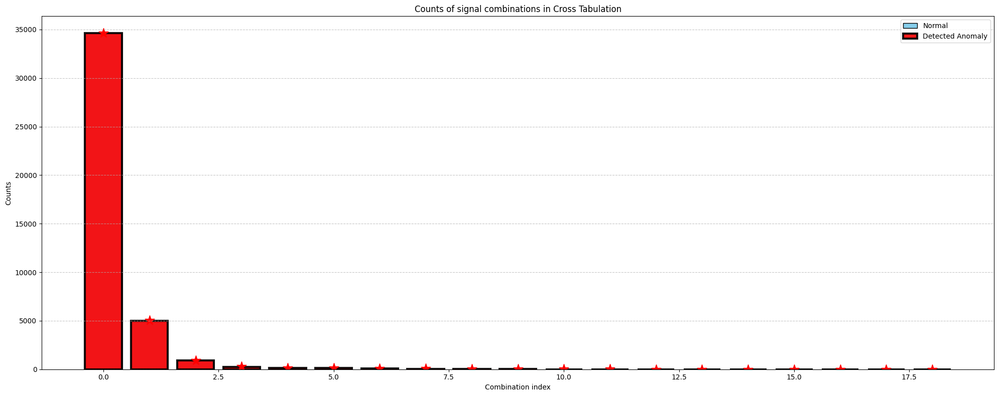

In [ ]:
# Signals columns
columns = ['rain_mode_severe_impairment',
           'blur_image_mode_severe_impairment',
           'sun_ray_mode_severe_impairment',

           'road_condition_mode_dry',
           'road_condition_mode_wet',
           'road_condition_mode_snow_covered',

           'lane_keeping_quality_good', 'lane_keeping_quality_bad', 'lane_keeping_quality_very_bad']

# Select only the valid signal combinations
valid_combinations = combination_counts

# Extract unique combinations of anomalies from the prediction
#anomaly_combinations = final_df_mapped_unnorm.loc[anomaly_indices, columns].drop_duplicates()

# Check which rows in valid signal combinations are anomaly predictions
valid_combinations['Is_Anomaly'] = valid_combinations[columns].apply(tuple, axis=1).isin(anomaly_combinations.apply(tuple, axis=1))

# Sort valid_combinations by 'Counts' in descending order
valid_combinations= valid_combinations.sort_values(by='Counts', ascending=False).reset_index(drop=True)

# Bar plot
plt.figure(figsize=(20, 8))

# Plot normal combinations
plt.bar(valid_combinations.index, valid_combinations['Counts'], color='skyblue', edgecolor='black', label='Normal')

# Plot anomalous combinations with thicker bars
plt.bar(valid_combinations[valid_combinations['Is_Anomaly']].index, valid_combinations[valid_combinations['Is_Anomaly']]['Counts'],
        color='red', edgecolor='black', label='Detected Anomaly', linewidth=3, alpha=0.9)

# Add markers above the anomaly bars for emphasis
for idx, row in valid_combinations[valid_combinations['Is_Anomaly']].iterrows():
    plt.scatter(idx, row['Counts'] + 5, color='red', marker='*', s=200, label='_nolegend_')  # Mark with a star above the bar

# Add labels and title
plt.xlabel('Combination index')  # No X-axis label
plt.ylabel('Counts')
plt.title('Counts of signal combinations in Cross Tabulation')
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.legend()
plt.tight_layout()
plt.show()

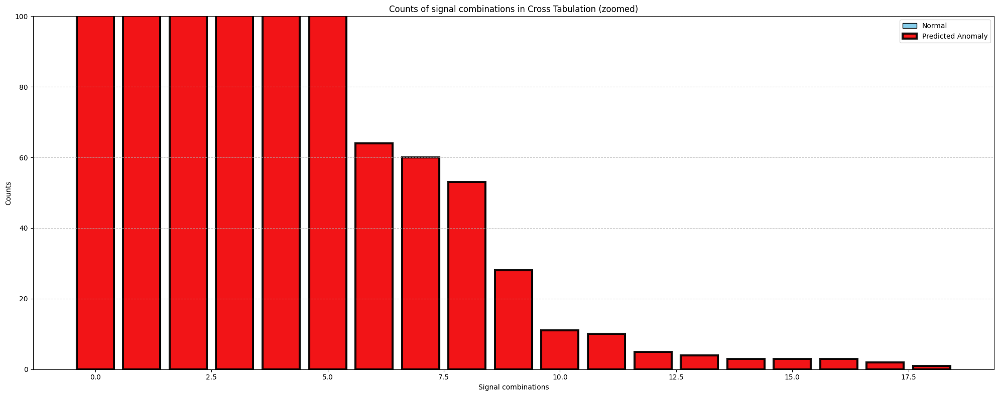

In [ ]:
# Bar plot
plt.figure(figsize=(20, 8))

# Plot normal combinations
plt.bar(valid_combinations.index, valid_combinations['Counts'], color='skyblue', edgecolor='black', label='Normal')

# Plot anomalous combinations with thicker bars
plt.bar(valid_combinations[valid_combinations['Is_Anomaly']].index, valid_combinations[valid_combinations['Is_Anomaly']]['Counts'],
        color='red', edgecolor='black', label='Predicted Anomaly', linewidth=3, alpha=0.9)

# Add labels and title
plt.xlabel('Signal combinations')  # No X-axis label
plt.ylabel('Counts')
plt.title('Counts of signal combinations in Cross Tabulation (zoomed)')
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Clip the Y-axis to a maximum value (e.g., 50) to focus on low counts
plt.ylim(0, 100)  # Set the maximum Y-axis value to clip the high bars

# Show the legend and plot
#plt.savefig("experiments/only_bhe_without_sampling/65/cross_product_zoomed.png")
plt.legend()
plt.tight_layout()
plt.show()

# Pseudo Labels

In [ ]:
iforest_df.columns

Index(['speed_range', 'ttc_risk_vehicle_max', 'road_condition_mode_dry',
       'road_condition_mode_wet', 'road_condition_mode_snow_covered',
       'lane_keeping_quality_bad', 'lane_keeping_quality_very_bad',
       'rain_mode_severe_impairment', 'blur_image_mode_severe_impairment',
       'sun_ray_mode_severe_impairment'],
      dtype='object')

In [ ]:
features_df_mapped_unnormalize.columns

Index(['mea_acv_id', 'mea', 'mea_acv_description', 'split_file',
       'sReference.nImageNumber', 'start_time', 'end_time', 'timestamp',
       'speed_mean', 'speed_max', 'speed_min', 'speed_range', 'speed_std',
       'accel_mean', 'accel_min', 'accel_max', 'accel_zcr', 'accel_std',
       'steering_mean', 'steering_std', 'yaw_mean', 'yaw_std', 'yaw_zcr',
       'ttc_min', 'ttc_mean', 'ttc_std', 'ttc_max',
       'front_vehicle_lane_assignment_mode',
       'front_vehicle_lane_assignment_transition_count',
       'ttc_risk_vehicle_mean', 'ttc_risk_vehicle_min', 'ttc_risk_vehicle_max',
       'ttc_risk_vehicle_std', 'ttc_risk_vehicle_range', 'inverse_ttc_mean',
       'inverse_ttc_max', 'ttc_dist_mean', 'ttc_dist_min', 'ttc_dist_max',
       'lat_dist_mean', 'lat_dist_min', 'lat_dist_max', 'full_block_mode',
       'partial_block_mode', 'blur_image_mode', 'rain_mode',
       'rain_transition_count', 'frozen_windshield_mode',
       'frozen_windshield_transition_count', 'fog_mode',
   

In [ ]:
iforest_df.columns

Index(['speed_range', 'ttc_risk_vehicle_max', 'road_condition_mode_dry',
       'road_condition_mode_wet', 'road_condition_mode_snow_covered',
       'lane_keeping_quality_bad', 'lane_keeping_quality_very_bad',
       'rain_mode_severe_impairment', 'blur_image_mode_severe_impairment',
       'sun_ray_mode_severe_impairment'],
      dtype='object')

In [ ]:
# Filter features_df contains only relevant features
features_df_interpret = features_df_mapped_unnormalize[['speed_range', 'road_condition_mode', 'ttc_risk_vehicle_max',
                                                        'mid_lane_safe_mode', 'left_lane_safe_mode', 'right_lane_safe_mode',
                                                        'rain_mode', 'blur_image_mode', 'sun_ray_mode']]

In [ ]:
# Calculate the 1% threshold
threshold_1_percent = iforest_df_unnormalize_interpret['ttc_risk_vehicle_max'].quantile(0.96)

print("1% Threshold:", threshold_1_percent)

1% Threshold: 0.3117287786828268


In [ ]:
# Define thresholds
high_speed_range = 30  # Threshold for high speed range
adverse_conditions = ['wet', 'snow_covered']

# Proxy rules for anomalies
proxy_df = features_df_interpret[
    (
        # Rule 0: Rare impairments with road conditions

            (features_df_interpret['rain_mode'] == 'severe_impairment') &
            (features_df_interpret['road_condition_mode'] == 'dry')

    ) |
    (
            (features_df_interpret['sun_ray_mode'] == 'severe_impairment') &
            (features_df_interpret['road_condition_mode'] == 'wet')

    )
    |
    (
        # Rule 1: Rare impairments combination
        (
            (features_df_interpret['rain_mode'] == 'severe_impairment') &
            (features_df_interpret['blur_image_mode'] == 'severe_impairment')
        ) |
        (
            (features_df_interpret['rain_mode'] == 'severe_impairment') &
            (features_df_interpret['sun_ray_mode'] == 'severe_impairment')
        ) |
        (
            (features_df_interpret['blur_image_mode'] == 'severe_impairment') &
            (features_df_interpret['sun_ray_mode'] == 'severe_impairment')
        ) |
        (
            (features_df_interpret['rain_mode'] == 'severe_impairment') &
            (features_df_interpret['blur_image_mode'] == 'severe_impairment') &
            (features_df_interpret['sun_ray_mode'] == 'severe_impairment')
        )
    )
    |
    (
        # Rule 2: Multiple lane boundaries unsafe
        (
            (features_df_interpret['mid_lane_safe_mode'] == 'not_safe') &
            (features_df_interpret['left_lane_safe_mode'] == 'not_safe')
        ) |
        (
            (features_df_interpret['mid_lane_safe_mode'] == 'not_safe') &
            (features_df_interpret['right_lane_safe_mode'] == 'not_safe')
        ) |
        (
            (features_df_interpret['left_lane_safe_mode'] == 'not_safe') &
            (features_df_interpret['right_lane_safe_mode'] == 'not_safe')
        )
    )
    |
    (
        # Rule 3: Lane boundaries unsafe in adverse road condition
        (
            (features_df_interpret['mid_lane_safe_mode'] == 'not_safe') |
            (features_df_interpret['left_lane_safe_mode'] == 'not_safe') |
            (features_df_interpret['right_lane_safe_mode'] == 'not_safe')
        ) &
        (features_df_interpret['road_condition_mode'].isin(adverse_conditions))
    )
    |
    (
        # Rule 4: Lane boundaries unsafe in bad weather condition
        (
            (features_df_interpret['mid_lane_safe_mode'] == 'not_safe') |
            (features_df_interpret['left_lane_safe_mode'] == 'not_safe') |
            (features_df_interpret['right_lane_safe_mode'] == 'not_safe')
        ) &
        (
            (features_df_interpret['rain_mode'] == 'severe_impairment') |
            (features_df_interpret['blur_image_mode'] == 'severe_impairment') |
            (features_df_interpret['sun_ray_mode'] == 'severe_impairment')
        )
    )
    |
    (
        # Rule 5: Lane boundaries unsafe with high speed range
        (
            (features_df_interpret['mid_lane_safe_mode'] == 'not_safe') |
            (features_df_interpret['left_lane_safe_mode'] == 'not_safe') |
            (features_df_interpret['right_lane_safe_mode'] == 'not_safe')
        ) &
        (features_df_interpret['speed_range'] > high_speed_range)
    )
    |
    (
        # Rule 6: High speed range in adverse road condition
        (features_df_interpret['speed_range'] > high_speed_range) &
        (features_df_interpret['road_condition_mode'].isin(adverse_conditions))
    )
    |
    (
        # Rule 7: High speed range in severe weather
        (features_df_interpret['speed_range'] > high_speed_range) &
        (
            (features_df_interpret['rain_mode'] == 'severe_impairment') |
            (features_df_interpret['blur_image_mode'] == 'severe_impairment') |
            (features_df_interpret['sun_ray_mode'] == 'severe_impairment')
        )
    )
    |

        # Rule 8: Lane boundaries unsafe
        ((features_df_interpret['mid_lane_safe_mode'] == 'not_safe') |
         (features_df_interpret['left_lane_safe_mode'] == 'not_safe') |
         (features_df_interpret['right_lane_safe_mode'] == 'not_safe')
        )
    |
    (
        # Rule 9: Extreme high-risk TTC
        (features_df_interpret['ttc_risk_vehicle_max'] > 0.3)
    )
    |
    (
        # Rule 10: High risk with adverse road conditions
        (features_df_interpret['ttc_risk_vehicle_max'] > 0.15) &
        (features_df_interpret['road_condition_mode'].isin(adverse_conditions))
    )
    |
    (
        # Rule 11: High risk with severe weather impairments
        (features_df_interpret['ttc_risk_vehicle_max'] > 0.15) &
        (
            (features_df_interpret['rain_mode'] == 'severe_impairment') |
            (features_df_interpret['blur_image_mode'] == 'severe_impairment') |
            (features_df_interpret['sun_ray_mode'] == 'severe_impairment')
        )
    )
    |
    (
        # Rule 12: High risk with unsafe lane boundaries
        (features_df_interpret['ttc_risk_vehicle_max'] > 0.15) &
        (
            (features_df_interpret['mid_lane_safe_mode'] == 'not_safe') |
            (features_df_interpret['left_lane_safe_mode'] == 'not_safe') |
            (features_df_interpret['right_lane_safe_mode'] == 'not_safe')
        )
    )
    |
    (
        # Rule 13: Extreme inverse TTC with high speed range
        (features_df_interpret['ttc_risk_vehicle_max'] > 0.15) &
        (features_df_interpret['speed_range'] > high_speed_range)
    )
]


In [ ]:
# Define thresholds
high_speed_range = 30  # Threshold for high speed range
adverse_conditions = ['wet', 'snow_covered']

# Proxy rules for anomalies
proxy_df = features_df_interpret[
    (
        # Rule 0: Rare impairments with road conditions

            (features_df_interpret['rain_mode'] == 'severe_impairment') &
            (features_df_interpret['road_condition_mode'] == 'dry')

    ) |
    (
            (features_df_interpret['sun_ray_mode'] == 'severe_impairment') &
            (features_df_interpret['road_condition_mode'] == 'wet')

    )
    |
    (
        # Rule 1: Rare impairments combination
        (
            (features_df_interpret['rain_mode'] == 'severe_impairment') &
            (features_df_interpret['blur_image_mode'] == 'severe_impairment')
        ) |
        (
            (features_df_interpret['rain_mode'] == 'severe_impairment') &
            (features_df_interpret['sun_ray_mode'] == 'severe_impairment')
        ) |
        (
            (features_df_interpret['blur_image_mode'] == 'severe_impairment') &
            (features_df_interpret['sun_ray_mode'] == 'severe_impairment')
        ) |
        (
            (features_df_interpret['rain_mode'] == 'severe_impairment') &
            (features_df_interpret['blur_image_mode'] == 'severe_impairment') &
            (features_df_interpret['sun_ray_mode'] == 'severe_impairment')
        )
    )
    |
    (
        # Rule 2: Multiple lane boundaries unsafe
        (
            (features_df_interpret['mid_lane_safe_mode'] == 'not_safe') &
            (features_df_interpret['left_lane_safe_mode'] == 'not_safe')
        ) |
        (
            (features_df_interpret['mid_lane_safe_mode'] == 'not_safe') &
            (features_df_interpret['right_lane_safe_mode'] == 'not_safe')
        ) |
        (
            (features_df_interpret['left_lane_safe_mode'] == 'not_safe') &
            (features_df_interpret['right_lane_safe_mode'] == 'not_safe')
        )
    )
    |
    (
        # Rule 3: Lane boundaries unsafe in adverse road condition
        (
            (features_df_interpret['mid_lane_safe_mode'] == 'not_safe') |
            (features_df_interpret['left_lane_safe_mode'] == 'not_safe') |
            (features_df_interpret['right_lane_safe_mode'] == 'not_safe')
        ) &
        (features_df_interpret['road_condition_mode'].isin(adverse_conditions))
    )
    |
    (
        # Rule 4: Lane boundaries unsafe in bad weather condition
        (
            (features_df_interpret['mid_lane_safe_mode'] == 'not_safe') |
            (features_df_interpret['left_lane_safe_mode'] == 'not_safe') |
            (features_df_interpret['right_lane_safe_mode'] == 'not_safe')
        ) &
        (
            (features_df_interpret['rain_mode'] == 'severe_impairment') |
            (features_df_interpret['blur_image_mode'] == 'severe_impairment') |
            (features_df_interpret['sun_ray_mode'] == 'severe_impairment')
        )
    )
    |
    (
        # Rule 5: Lane boundaries unsafe with high speed range
        (
            (features_df_interpret['mid_lane_safe_mode'] == 'not_safe') |
            (features_df_interpret['left_lane_safe_mode'] == 'not_safe') |
            (features_df_interpret['right_lane_safe_mode'] == 'not_safe')
        ) &
        (features_df_interpret['speed_range'] > high_speed_range)
    )
    |
    (
        # Rule 6: High speed range in adverse road condition
        (features_df_interpret['speed_range'] > high_speed_range) &
        (features_df_interpret['road_condition_mode'].isin(adverse_conditions))
    )
    |
    (
        # Rule 7: High speed range in severe weather
        (features_df_interpret['speed_range'] > high_speed_range) &
        (
            (features_df_interpret['rain_mode'] == 'severe_impairment') |
            (features_df_interpret['blur_image_mode'] == 'severe_impairment') |
            (features_df_interpret['sun_ray_mode'] == 'severe_impairment')
        )
    )
    |

        # Rule 8: Lane boundaries unsafe
        ((features_df_interpret['mid_lane_safe_mode'] == 'not_safe') |
         (features_df_interpret['left_lane_safe_mode'] == 'not_safe') |
         (features_df_interpret['right_lane_safe_mode'] == 'not_safe')
        )
    |
    (
        # Rule 9: Sustained high-risk TTC
        (features_df_interpret['ttc_risk_vehicle_max'] > 1.0)
    )
    |
    (
        # Rule 10: High risk with adverse road conditions
        (features_df_interpret['inverse_ttc_mean_ego'] > 0.5) &
        (features_df_interpret['road_condition_mode'].isin(adverse_conditions))
    )
    |
    (
        # Rule 11: High risk with severe weather impairments
        (features_df_interpret['inverse_ttc_mean_ego'] > 0.5) &
        (
            (features_df_interpret['rain_mode'] == 'severe_impairment') |
            (features_df_interpret['blur_image_mode'] == 'severe_impairment') |
            (features_df_interpret['sun_ray_mode'] == 'severe_impairment')
        )
    )
    |
    (
        # Rule 12: High risk with unsafe lane boundaries
        (features_df_interpret['inverse_ttc_mean_ego'] > 0.5) &
        (
            (features_df_interpret['mid_lane_safe_mode'] == 'not_safe') |
            (features_df_interpret['left_lane_safe_mode'] == 'not_safe') |
            (features_df_interpret['right_lane_safe_mode'] == 'not_safe')
        )
    )
    |
    (
        # Rule 13: Extreme inverse TTC with high speed range
        (features_df_interpret['inverse_ttc_mean_ego'] > 0.5) &
        (features_df_interpret['speed_range'] > high_speed_range)
    )
]


In [ ]:
len(proxy_df)

2695

In [ ]:
len(iforest_df)

41327

In [ ]:
proxy_df.head()

,speed_range,road_condition_mode,ttc_risk_vehicle_max,mid_lane_safe_mode,left_lane_safe_mode,right_lane_safe_mode,rain_mode,blur_image_mode,sun_ray_mode
80,4.593750,dry,0.691403,safe,safe,NaN,no_impairment,no_impairment,no_impairment
84,28.312500,dry,0.355774,safe,safe,safe,no_impairment,no_impairment,no_impairment
135,0.203125,dry,0.440325,safe,safe,safe,no_impairment,no_impairment,no_impairment
265,2.484375,dry,0.540158,safe,safe,safe,no_impairment,no_impairment,no_impairment
277,3.140625,wet,0.182805,safe,safe,NaN,no_impairment,no_impairment,no_impairment


In [ ]:
len(iforest_df)

6907

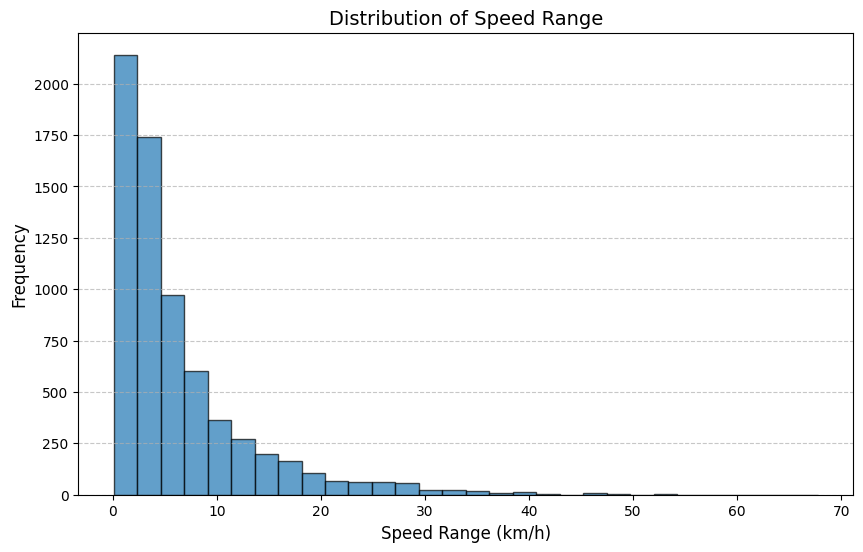

In [ ]:
import matplotlib.pyplot as plt

# Assuming `features_df_interpret` contains the `speed_range` column
speed_range_data = features_df_interpret['speed_range']

# Plotting the distribution of speed range
plt.figure(figsize=(10, 6))
plt.hist(speed_range_data, bins=30, alpha=0.7, edgecolor='black')
plt.title("Distribution of Speed Range", fontsize=14)
plt.xlabel("Speed Range (km/h)", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


### Evaluate IF

In [ ]:
proxy_iforest_df = iforest_df.loc[proxy_df.index]

In [ ]:
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score

# Add a 'proxy_label' column to proxy_iforest_df (ground truth)
proxy_iforest_df['proxy_label'] = 1  # All rows in proxy_iforest_df are anomalies

# Create a DataFrame for evaluation with all indices
all_indices = proxy_iforest_df.index.union(anomalies_if.index)
evaluation_df = pd.DataFrame(index=all_indices)

# Assign ground truth labels
evaluation_df['proxy_label'] = 0  # Default all to normal
evaluation_df.loc[proxy_iforest_df.index, 'proxy_label'] = 1  # Mark ground truth anomalies

# Assign predicted labels
evaluation_df['predicted'] = 0  # Default all to normal
evaluation_df.loc[anomalies_if.index, 'predicted'] = 1  # Mark predicted anomalies

# Calculate evaluation metrics
precision = precision_score(evaluation_df['proxy_label'], evaluation_df['predicted'])
recall = recall_score(evaluation_df['proxy_label'], evaluation_df['predicted'])
f1 = f1_score(evaluation_df['proxy_label'], evaluation_df['predicted'])
cm = confusion_matrix(evaluation_df['proxy_label'], evaluation_df['predicted'])

# Extract TP, FP, TN, FN from confusion matrix
tp = cm[1, 1]  # True Positives
fp = cm[0, 1]  # False Positives
tn = cm[0, 0]  # True Negatives
fn = cm[1, 0]  # False Negatives

# Display results
print("Confusion Matrix (Labeled):")
print(f"TP (True Positives): {tp}")
print(f"FP (False Positives): {fp}")
print(f"TN (True Negatives): {tn}")
print(f"FN (False Negatives): {fn}")
print()
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1-Score: {f1:.2f}")


Confusion Matrix (Labeled):
TP (True Positives): 979
FP (False Positives): 1088
TN (True Negatives): 0
FN (False Negatives): 1716

Precision: 0.47
Recall: 0.36
F1-Score: 0.41


### Evaluate DIF

In [ ]:
proxy_iforest_dif = iforest_df.loc[proxy_df.index]

In [ ]:
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score

# Add a 'proxy_label' column to proxy_iforest_df (ground truth)
proxy_iforest_dif['proxy_label'] = 1  # All rows in proxy_iforest_df are anomalies

# Create a DataFrame for evaluation with all indices
all_indices = proxy_iforest_dif.index.union(anomalies_dif.index)
evaluation_dif = pd.DataFrame(index=all_indices)

# Assign ground truth labels
evaluation_dif['proxy_label'] = 0  # Default all to normal
evaluation_dif.loc[proxy_iforest_dif.index, 'proxy_label'] = 1  # Mark ground truth anomalies

# Assign predicted labels
evaluation_dif['predicted'] = 0  # Default all to normal
evaluation_dif.loc[anomalies_dif.index, 'predicted'] = 1  # Mark predicted anomalies

# Calculate evaluation metrics
precision = precision_score(evaluation_dif['proxy_label'], evaluation_dif['predicted'])
recall = recall_score(evaluation_dif['proxy_label'], evaluation_dif['predicted'])
f1 = f1_score(evaluation_dif['proxy_label'], evaluation_dif['predicted'])
cm = confusion_matrix(evaluation_dif['proxy_label'], evaluation_dif['predicted'])

# Extract TP, FP, TN, FN from confusion matrix
tp = cm[1, 1]  # True Positives
fp = cm[0, 1]  # False Positives
tn = cm[0, 0]  # True Negatives
fn = cm[1, 0]  # False Negatives

# Display results
print("Confusion Matrix (Labeled):")
print(f"TP (True Positives): {tp}")
print(f"FP (False Positives): {fp}")
print(f"TN (True Negatives): {tn}")
print(f"FN (False Negatives): {fn}")
print()
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1-Score: {f1:.2f}")

Confusion Matrix (Labeled):
TP (True Positives): 1098
FP (False Positives): 969
TN (True Negatives): 0
FN (False Negatives): 1597

Precision: 0.53
Recall: 0.41
F1-Score: 0.46


In [ ]:
# Extract True Positives (TP): proxy_label = 1 and predicted = 1
true_positives = evaluation_dif[(evaluation_dif['proxy_label'] == 1) & (evaluation_dif['predicted'] == 1)]

# Extract False Positives (FP): proxy_label = 0 and predicted = 1
false_positives = evaluation_dif[(evaluation_dif['proxy_label'] == 0) & (evaluation_dif['predicted'] == 1)]

# Extract True Positive indices
tp_indices = true_positives.index

# Extract False Positive indices
fp_indices = false_positives.index

# Filter the full data from iforest_df_unnormalize for TP and FP
tp_full_data = iforest_df_unnormalize.loc[tp_indices]
fp_full_data = iforest_df_unnormalize.loc[fp_indices]

In [ ]:
tp_full_data

,speed_range,road_condition_mode_dry,road_condition_mode_wet,road_condition_mode_snow_covered,mid_lane_safe_mode_not_safe,left_lane_safe_mode_not_safe,right_lane_safe_mode_not_safe,rain_mode_severe_impairment,blur_image_mode_severe_impairment,sun_ray_mode_severe_impairment
418,4.156250,1,0,0,0,0,0,1,0,0
420,2.359375,1,0,0,0,0,0,1,0,0
428,27.671875,1,0,0,0,0,0,1,0,0
614,17.421875,1,0,0,0,0,0,1,0,0
2750,3.218750,0,1,0,0,1,0,1,0,0
2751,7.390625,0,1,0,0,1,0,1,0,0
3540,6.984375,1,0,0,0,0,0,1,0,0
3575,48.281250,0,1,0,0,0,0,0,1,0
3847,17.390625,0,1,0,0,1,0,0,0,0
5028,7.609375,1,0,0,0,0,0,1,0,0


In [ ]:
fp_full_data

,speed_range,road_condition_mode_dry,road_condition_mode_wet,road_condition_mode_snow_covered,mid_lane_safe_mode_not_safe,left_lane_safe_mode_not_safe,right_lane_safe_mode_not_safe,rain_mode_severe_impairment,blur_image_mode_severe_impairment,sun_ray_mode_severe_impairment
144,6.093750,1,0,0,1,0,0,0,0,0
380,10.343750,1,0,0,0,0,0,0,1,0
422,14.546875,0,1,0,0,0,0,1,0,0
440,9.343750,0,1,0,0,0,0,1,0,0
622,20.671875,0,1,0,0,0,0,1,0,0
1281,7.203125,0,1,0,0,0,0,0,1,0
1283,5.859375,0,1,0,0,0,0,0,1,0
1290,6.500000,0,1,0,0,0,0,1,0,0
1291,10.578125,0,1,0,0,0,0,1,0,0
1320,12.609375,0,1,0,0,0,0,1,0,0


### Evaluate KNN

In [ ]:
proxy_iforest_knn = iforest_df.loc[proxy_df.index]

In [ ]:
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score

# Add a 'proxy_label' column to proxy_iforest_df (ground truth)
proxy_iforest_knn['proxy_label'] = 1  # All rows in proxy_iforest_df are anomalies

# Create a DataFrame for evaluation with all indices
all_indices = proxy_iforest_knn.index.union(anomalies_knn.index)
evaluation_knn = pd.DataFrame(index=all_indices)

# Assign ground truth labels
evaluation_knn['proxy_label'] = 0  # Default all to normal
evaluation_knn.loc[proxy_iforest_knn.index, 'proxy_label'] = 1  # Mark ground truth anomalies

# Assign predicted labels
evaluation_knn['predicted'] = 0  # Default all to normal
evaluation_knn.loc[anomalies_knn.index, 'predicted'] = 1  # Mark predicted anomalies

# Calculate evaluation metrics
precision = precision_score(evaluation_knn['proxy_label'], evaluation_knn['predicted'])
recall = recall_score(evaluation_knn['proxy_label'], evaluation_knn['predicted'])
f1 = f1_score(evaluation_knn['proxy_label'], evaluation_knn['predicted'])
cm = confusion_matrix(evaluation_knn['proxy_label'], evaluation_knn['predicted'])

# Extract TP, FP, TN, FN from confusion matrix
tp = cm[1, 1]  # True Positives
fp = cm[0, 1]  # False Positives
tn = cm[0, 0]  # True Negatives
fn = cm[1, 0]  # False Negatives

# Display results
print("Confusion Matrix (Labeled):")
print(f"TP (True Positives): {tp}")
print(f"FP (False Positives): {fp}")
print(f"TN (True Negatives): {tn}")
print(f"FN (False Negatives): {fn}")
print()
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1-Score: {f1:.2f}")

Confusion Matrix (Labeled):
TP (True Positives): 1649
FP (False Positives): 418
TN (True Negatives): 0
FN (False Negatives): 1046

Precision: 0.80
Recall: 0.61
F1-Score: 0.69


### Evaluate LOF

In [ ]:
proxy_iforest_lof = iforest_df.loc[proxy_df.index]

In [ ]:
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score

# Add a 'proxy_label' column to proxy_iforest_df (ground truth)
proxy_iforest_lof['proxy_label'] = 1  # All rows in proxy_iforest_df are anomalies

# Create a DataFrame for evaluation with all indices
all_indices = proxy_iforest_lof.index.union(anomalies_lof.index)
evaluation_lof = pd.DataFrame(index=all_indices)

# Assign ground truth labels
evaluation_lof['proxy_label'] = 0  # Default all to normal
evaluation_lof.loc[proxy_iforest_lof.index, 'proxy_label'] = 1  # Mark ground truth anomalies

# Assign predicted labels
evaluation_lof['predicted'] = 0  # Default all to normal
evaluation_lof.loc[anomalies_lof.index, 'predicted'] = 1  # Mark predicted anomalies

# Calculate evaluation metrics
precision = precision_score(evaluation_lof['proxy_label'], evaluation_lof['predicted'])
recall = recall_score(evaluation_lof['proxy_label'], evaluation_lof['predicted'])
f1 = f1_score(evaluation_lof['proxy_label'], evaluation_lof['predicted'])
cm = confusion_matrix(evaluation_lof['proxy_label'], evaluation_lof['predicted'])

# Extract TP, FP, TN, FN from confusion matrix
tp = cm[1, 1]  # True Positives
fp = cm[0, 1]  # False Positives
tn = cm[0, 0]  # True Negatives
fn = cm[1, 0]  # False Negatives

# Display results
print("Confusion Matrix (Labeled):")
print(f"TP (True Positives): {tp}")
print(f"FP (False Positives): {fp}")
print(f"TN (True Negatives): {tn}")
print(f"FN (False Negatives): {fn}")
print()
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1-Score: {f1:.2f}")

Confusion Matrix (Labeled):
TP (True Positives): 46
FP (False Positives): 1186
TN (True Negatives): 0
FN (False Negatives): 2649

Precision: 0.04
Recall: 0.02
F1-Score: 0.02


### Evaluate OCSVM

In [ ]:
proxy_iforest_ocsvm = iforest_df.loc[proxy_df.index]

In [ ]:
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score

# Add a 'proxy_label' column to proxy_iforest_df (ground truth)
proxy_iforest_ocsvm['proxy_label'] = 1  # All rows in proxy_iforest_df are anomalies

# Create a DataFrame for evaluation with all indices
all_indices = proxy_iforest_ocsvm.index.union(anomalies_ocsvm.index)
evaluation_ocsvm = pd.DataFrame(index=all_indices)

# Assign ground truth labels
evaluation_ocsvm['proxy_label'] = 0  # Default all to normal
evaluation_ocsvm.loc[proxy_iforest_ocsvm.index, 'proxy_label'] = 1  # Mark ground truth anomalies

# Assign predicted labels
evaluation_ocsvm['predicted'] = 0  # Default all to normal
evaluation_ocsvm.loc[anomalies_ocsvm.index, 'predicted'] = 1  # Mark predicted anomalies

# Calculate evaluation metrics
precision = precision_score(evaluation_ocsvm['proxy_label'], evaluation_ocsvm['predicted'])
recall = recall_score(evaluation_ocsvm['proxy_label'], evaluation_ocsvm['predicted'])
f1 = f1_score(evaluation_ocsvm['proxy_label'], evaluation_ocsvm['predicted'])
cm = confusion_matrix(evaluation_ocsvm['proxy_label'], evaluation_ocsvm['predicted'])

# Extract TP, FP, TN, FN from confusion matrix
tp = cm[1, 1]  # True Positives
fp = cm[0, 1]  # False Positives
tn = cm[0, 0]  # True Negatives
fn = cm[1, 0]  # False Negatives

# Display results
print("Confusion Matrix (Labeled):")
print(f"TP (True Positives): {tp}")
print(f"FP (False Positives): {fp}")
print(f"TN (True Negatives): {tn}")
print(f"FN (False Negatives): {fn}")
print()
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1-Score: {f1:.2f}")

Confusion Matrix (Labeled):
TP (True Positives): 1364
FP (False Positives): 714
TN (True Negatives): 0
FN (False Negatives): 1331

Precision: 0.66
Recall: 0.51
F1-Score: 0.57


# Anomaly Score Distribution

### Distribution DIF

<ipython-input-102-ac1fa008da7a>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  features_df_interpret['anomaly_score'] = scores_dif
<ipython-input-102-ac1fa008da7a>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proxy_sample['anomaly_score'] = features_df_interpret.loc[proxy_sample.index, 'anomaly_score']


Proxy Set Scores Range: 0.3008292159463995 0.4361366254264351
Random Normal Sample Scores Range: 0.17691031094350115 0.39072011996299905


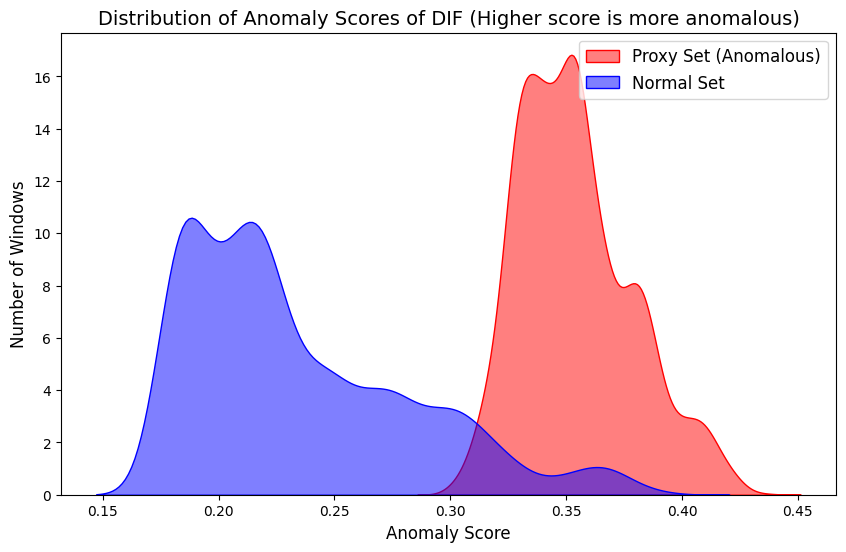

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assign anomaly scores to the original dataset
features_df_interpret['anomaly_score'] = scores_dif

# Create the normal set by excluding the proxy set
normal_df = features_df_interpret.drop(proxy_df.index)

# Proxy df
proxy_sample = proxy_df

# Randomly select samples from the normal set
random_normal_sample = normal_df.sample(n=len(proxy_sample), random_state=42)

# Extract anomaly scores for proxy and normal samples
proxy_sample['anomaly_score'] = features_df_interpret.loc[proxy_sample.index, 'anomaly_score']
random_normal_sample['anomaly_score'] = features_df_interpret.loc[random_normal_sample.index, 'anomaly_score']

# Debug: Ensure anomaly scores are in the correct range
print("Proxy Set Scores Range:", proxy_sample['anomaly_score'].min(), proxy_sample['anomaly_score'].max())
print("Random Normal Sample Scores Range:", random_normal_sample['anomaly_score'].min(), random_normal_sample['anomaly_score'].max())

# Plot KDE distributions
plt.figure(figsize=(10, 6))
sns.kdeplot(proxy_sample['anomaly_score'], label='Proxy Set (Anomalous)', color='red', fill=True, alpha=0.5)
sns.kdeplot(random_normal_sample['anomaly_score'], label='Normal Set', color='blue', fill=True, alpha=0.5)
plt.title("Distribution of Anomaly Scores of DIF (Higher score is more anomalous)", fontsize=14)
plt.xlabel("Anomaly Score", fontsize=12)
plt.ylabel("Number of Windows", fontsize=12)
plt.legend(fontsize=12)
plt.show()


### Distribution IF (original)

<ipython-input-103-406488bbf636>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  features_df_interpret['anomaly_score'] = scores_if
<ipython-input-103-406488bbf636>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proxy_sample['anomaly_score'] = features_df_interpret.loc[proxy_sample.index, 'anomaly_score']


Proxy Set Scores Range: -0.20021223552558098 0.14168219227696788
Random Normal Sample Scores Range: -0.07554413635920953 0.24309556561201057


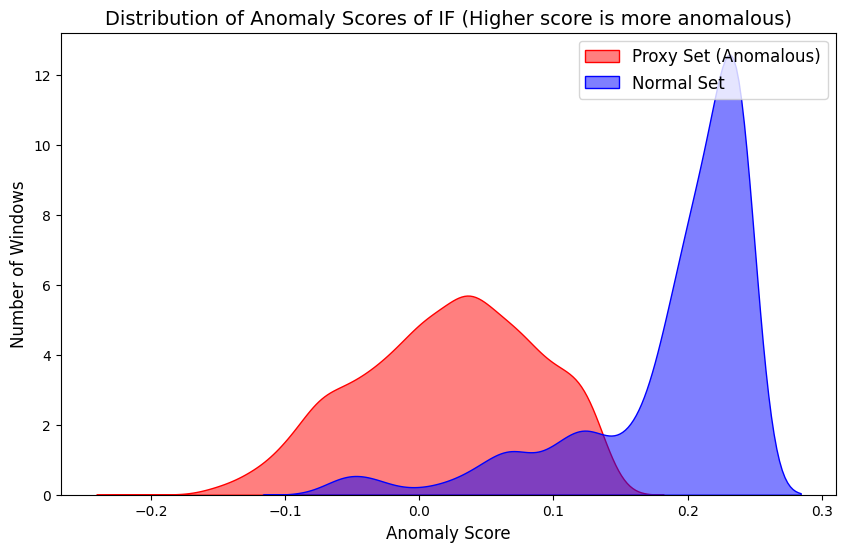

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assign anomaly scores to the original dataset
features_df_interpret['anomaly_score'] = scores_if

# Create the normal set by excluding the proxy set
normal_df = features_df_interpret.drop(proxy_df.index)

# Proxy df
proxy_sample = proxy_df

# Randomly select samples from the normal set
random_normal_sample = normal_df.sample(n=len(proxy_sample), random_state=42)

# Extract anomaly scores for proxy and normal samples
proxy_sample['anomaly_score'] = features_df_interpret.loc[proxy_sample.index, 'anomaly_score']
random_normal_sample['anomaly_score'] = features_df_interpret.loc[random_normal_sample.index, 'anomaly_score']

# Debug: Ensure anomaly scores are in the correct range
print("Proxy Set Scores Range:", proxy_sample['anomaly_score'].min(), proxy_sample['anomaly_score'].max())
print("Random Normal Sample Scores Range:", random_normal_sample['anomaly_score'].min(), random_normal_sample['anomaly_score'].max())

# Plot KDE distributions
plt.figure(figsize=(10, 6))
sns.kdeplot(proxy_sample['anomaly_score'], label='Proxy Set (Anomalous)', color='red', fill=True, alpha=0.5)
sns.kdeplot(random_normal_sample['anomaly_score'], label='Normal Set', color='blue', fill=True, alpha=0.5)
plt.title("Distribution of Anomaly Scores of IF (Higher score is more anomalous)", fontsize=14)
plt.xlabel("Anomaly Score", fontsize=12)
plt.ylabel("Number of Windows", fontsize=12)
plt.legend(fontsize=12)
plt.show()


### Distribution IF (flipped)

<ipython-input-104-7f5f40b537b2>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  features_df_interpret['anomaly_score'] = -scores_if
<ipython-input-104-7f5f40b537b2>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proxy_sample['anomaly_score'] = features_df_interpret.loc[proxy_sample.index, 'anomaly_score']


Proxy Set Scores Range: -0.14168219227696788 0.20021223552558098
Random Normal Sample Scores Range: -0.24309556561201057 0.07554413635920953


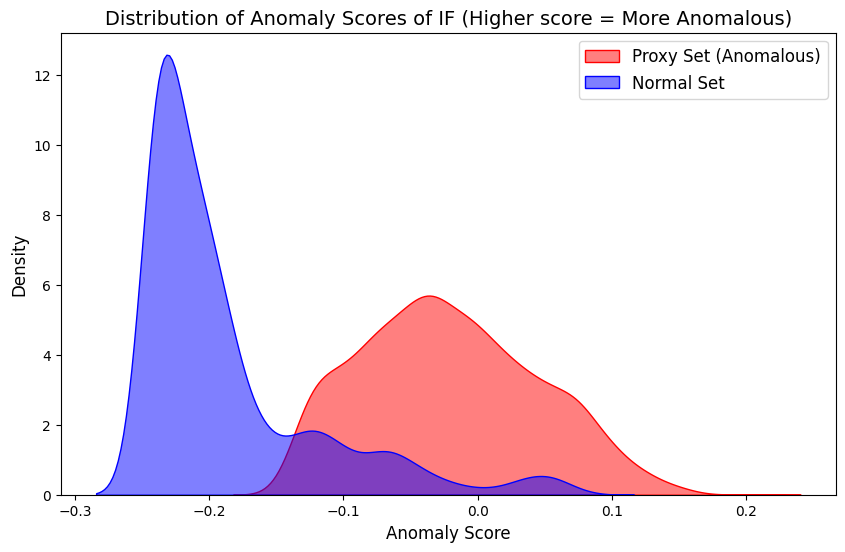

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Invert anomaly scores (if needed)
features_df_interpret['anomaly_score'] = -scores_if

# Assign scores to proxy and random normal samples
proxy_sample['anomaly_score'] = features_df_interpret.loc[proxy_sample.index, 'anomaly_score']
random_normal_sample['anomaly_score'] = features_df_interpret.loc[random_normal_sample.index, 'anomaly_score']

# Debug: Ensure anomaly scores are in the correct range
print("Proxy Set Scores Range:", proxy_sample['anomaly_score'].min(), proxy_sample['anomaly_score'].max())
print("Random Normal Sample Scores Range:", random_normal_sample['anomaly_score'].min(), random_normal_sample['anomaly_score'].max())

# Plot KDE distributions
plt.figure(figsize=(10, 6))
sns.kdeplot(proxy_sample['anomaly_score'], label='Proxy Set (Anomalous)', color='red', fill=True, alpha=0.5)
sns.kdeplot(random_normal_sample['anomaly_score'], label='Normal Set', color='blue', fill=True, alpha=0.5)
plt.title("Distribution of Anomaly Scores of IF (Higher score = More Anomalous)", fontsize=14)
plt.xlabel("Anomaly Score", fontsize=12)
plt.ylabel("Density", fontsize=12)
plt.legend(fontsize=12)
plt.show()

### Distribution Mix

<ipython-input-203-a3645bfd47b3>:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-203-a3645bfd47b3>:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-203-a3645bfd47b3>:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-203-a36

DIF - Proxy Set Scores Range: 0.2879588993868188 0.39529729559041704
DIF - Random Normal Sample Scores Range: 0.1768780144365445 0.3706934084379665
IF - Proxy Set Scores Range: -0.08200895891975502 0.26143696052288873
IF - Random Normal Sample Scores Range: -0.015369833102305663 0.3263568812193961
KNN - Proxy Set Scores Range: 0.04151272350816953 12.590866602630783
KNN - Random Normal Sample Scores Range: 0.0 0.6869768830986621


<ipython-input-203-a3645bfd47b3>:38: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-203-a3645bfd47b3>:38: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



LOF - Proxy Set Scores Range: -127.66919376444255 5.664318206614605
LOF - Random Normal Sample Scores Range: -45.332603566023124 5.757238101283519
OCSVM - Proxy Set Scores Range: -3.028744424815856 1.0446087179435688
OCSVM - Random Normal Sample Scores Range: -0.00019676127266965437 1.2299212294589212


<ipython-input-203-a3645bfd47b3>:38: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



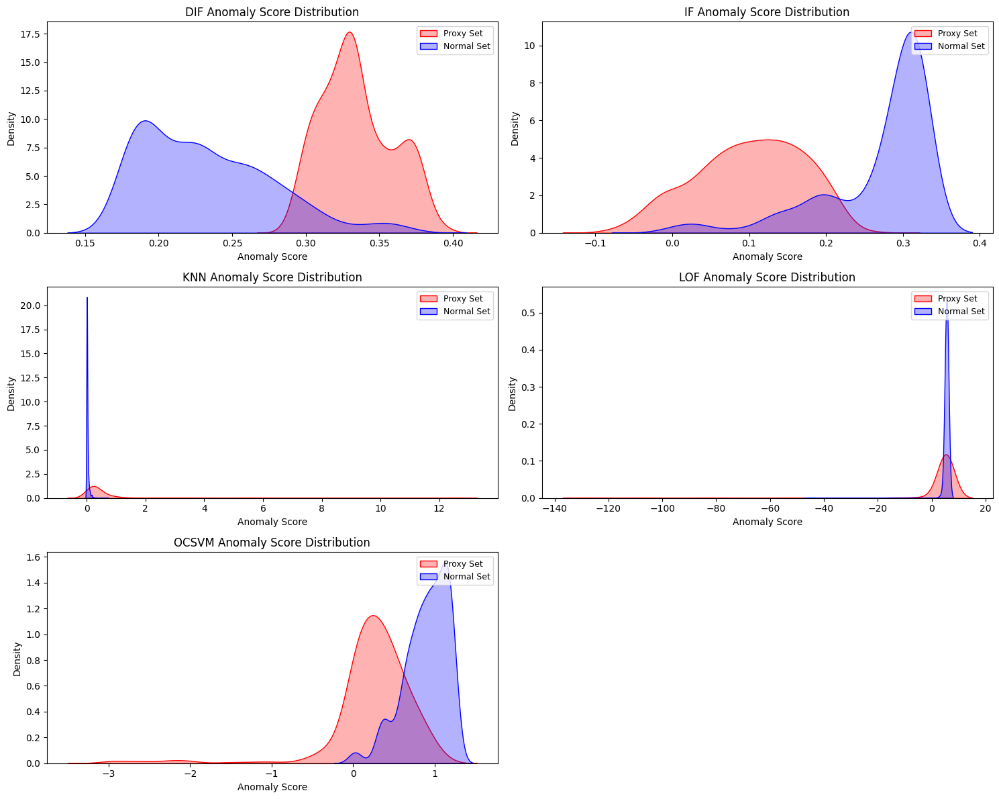

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assign scores to the dataset
features_df_interpret['anomaly_score_dif'] = scores_dif
features_df_interpret['anomaly_score_if'] = scores_if
features_df_interpret['anomaly_score_knn'] = scores_knn
features_df_interpret['anomaly_score_lof'] = scores_lof
features_df_interpret['anomaly_score_ocsvm'] = scores_ocsvm

# Proxy df
proxy_sample = proxy_df

# Create the normal set by excluding the proxy set
normal_df = features_df_interpret.drop(proxy_df.index)

# Randomly select samples from the normal set
random_normal_sample = normal_df.sample(n=len(proxy_sample), random_state=42)

# Extract anomaly scores for proxy and normal samples
methods = {
    'DIF': 'anomaly_score_dif',
    'IF': 'anomaly_score_if',
    'KNN': 'anomaly_score_knn',
    'LOF': 'anomaly_score_lof',
    'OCSVM': 'anomaly_score_ocsvm'
}

# Create subplots
fig, axes = plt.subplots(3, 2, figsize=(15, 12))  # 3 rows, 2 columns (1 empty slot)
axes = axes.flatten()

# Plot KDE distributions for all methods
for i, (method_name, score_column) in enumerate(methods.items()):
    ax = axes[i]

    # Extract scores for proxy and normal samples
    proxy_sample[score_column] = features_df_interpret.loc[proxy_sample.index, score_column]
    random_normal_sample[score_column] = features_df_interpret.loc[random_normal_sample.index, score_column]

    # Debug: Ensure anomaly scores are in the correct range for this method
    print(f"{method_name} - Proxy Set Scores Range:", proxy_sample[score_column].min(), proxy_sample[score_column].max())
    print(f"{method_name} - Random Normal Sample Scores Range:", random_normal_sample[score_column].min(), random_normal_sample[score_column].max())

    # Plot KDE for proxy set
    sns.kdeplot(
        proxy_sample[score_column],
        label=f'Proxy Set',
        fill=True,
        alpha=0.3,
        ax=ax,
        color='red'
    )

    # Plot KDE for normal set
    sns.kdeplot(
        random_normal_sample[score_column],
        label=f'Normal Set',
        fill=True,
        alpha=0.3,
        ax=ax,
        color='blue'
    )

    # Add subplot title and labels
    ax.set_title(f"{method_name} Anomaly Score Distribution", fontsize=12)
    ax.set_xlabel("Anomaly Score", fontsize=10)
    ax.set_ylabel("Density", fontsize=10)
    ax.legend(fontsize=9)

# Remove the last empty subplot
fig.delaxes(axes[-1])  # Remove the empty subplot if 3x2 grid is used for 5 plots

# Adjust layout
plt.tight_layout()
plt.show()


<ipython-input-76-28afe9f1fbfb>:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-76-28afe9f1fbfb>:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-76-28afe9f1fbfb>:26: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



Proxy Set Scores Range: 0.2756624212634372 0.42297755748687504
Random Normal Sample Scores Range: 0.1434267158936515 0.3926436607374539


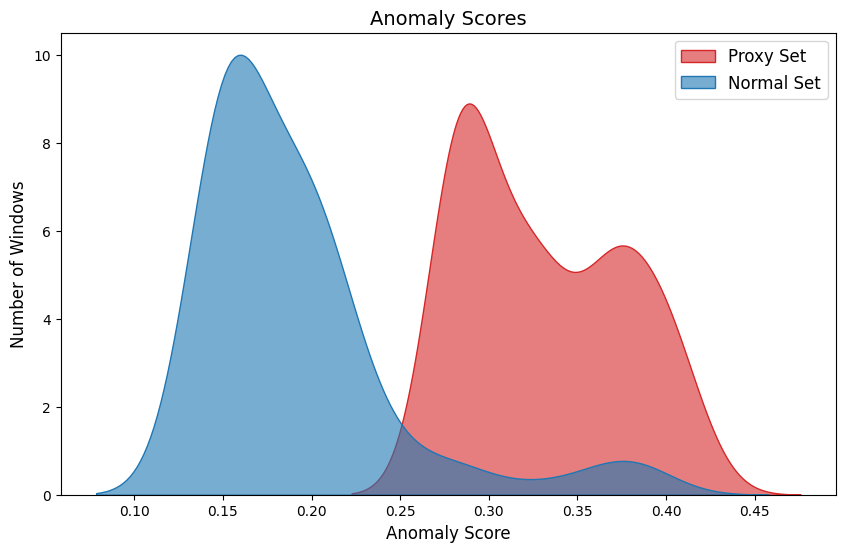

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.cm import get_cmap

# Assign anomaly scores to the original dataset
features_df_interpret['anomaly_score'] = scores_dif

# Create the normal set by excluding the proxy set
normal_df = features_df_interpret.drop(proxy_df.index)

# Proxy df
proxy_sample = proxy_df

# Randomly select samples from the normal set
random_normal_sample = normal_df.sample(n=len(proxy_sample), random_state=42)

# Extract anomaly scores for proxy and normal samples
proxy_sample['anomaly_score'] = features_df_interpret.loc[proxy_sample.index, 'anomaly_score']
random_normal_sample['anomaly_score'] = features_df_interpret.loc[random_normal_sample.index, 'anomaly_score']

# Debug: Ensure anomaly scores are in the correct range
print("Proxy Set Scores Range:", proxy_sample['anomaly_score'].min(), proxy_sample['anomaly_score'].max())
print("Random Normal Sample Scores Range:", random_normal_sample['anomaly_score'].min(), random_normal_sample['anomaly_score'].max())

# Use a Matplotlib colormap for colors
cmap = get_cmap('tab10')
proxy_color = cmap(3)  # First color in the colormap
normal_color = cmap(0)  # Second color in the colormap

# Plot KDE distributions
plt.figure(figsize=(10, 6))

sns.kdeplot(
    proxy_sample['anomaly_score'],
    color=proxy_color, fill=True, label='Proxy Set', alpha=0.6
)
sns.kdeplot(
    random_normal_sample['anomaly_score'],
    color=normal_color, fill=True, label='Normal Set', alpha=0.6
)

# Customize plot
plt.title("Anomaly Scores", fontsize=14)
plt.xlabel("Anomaly Score", fontsize=12)
plt.ylabel("Number of Windows", fontsize=12)
plt.legend(fontsize=12)

plt.show()


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.cm import get_cmap
from scipy.stats import mode

# Assign anomaly scores to the original dataset
features_df_interpret['anomaly_score'] = scores_dif

# Create the normal set by excluding the proxy set
normal_df = features_df_interpret.drop(proxy_df.index)

# Proxy df
proxy_sample = proxy_df

# Randomly select samples from the normal set
random_normal_sample = normal_df.sample(n=len(proxy_sample), random_state=42)

# Extract anomaly scores for proxy and normal samples
proxy_sample['anomaly_score'] = features_df_interpret.loc[proxy_sample.index, 'anomaly_score']
random_normal_sample['anomaly_score'] = features_df_interpret.loc[random_normal_sample.index, 'anomaly_score']

# Debug: Ensure anomaly scores are in the correct range
print("Proxy Set Scores Range:", proxy_sample['anomaly_score'].min(), proxy_sample['anomaly_score'].max())
print("Random Normal Sample Scores Range:", random_normal_sample['anomaly_score'].min(), random_normal_sample['anomaly_score'].max())

# Use a Matplotlib colormap for colors
cmap = get_cmap('tab10')
proxy_color = cmap(3)  # Color for Proxy Set
normal_color = cmap(0)  # Color for Normal Set

# Calculate mode for proxy and normal sets
proxy_mode = mode(proxy_sample['anomaly_score']).mode[0]
normal_mode = mode(random_normal_sample['anomaly_score']).mode[0]

# Plot KDE distributions
plt.figure(figsize=(10, 6))

sns.kdeplot(
    proxy_sample['anomaly_score'],
    color=proxy_color, fill=True, label='Proxy Set', alpha=0.6
)
sns.kdeplot(
    random_normal_sample['anomaly_score'],
    color=normal_color, fill=True, label='Normal Set', alpha=0.6
)

# Add vertical lines for the modes
plt.axvline(proxy_mode, color=proxy_color, linestyle='--', linewidth=1.5)
plt.text(proxy_mode, plt.gca().get_ylim()[1] * 0.9, f'Mode: {proxy_mode:.2f}',
         color=proxy_color, ha='center', fontsize=10, backgroundcolor='white')

plt.axvline(normal_mode, color=normal_color, linestyle='--', linewidth=1.5)
plt.text(normal_mode, plt.gca().get_ylim()[1] * 0.9, f'Mode: {normal_mode:.2f}',
         color=normal_color, ha='center', fontsize=10, backgroundcolor='white')

# Customize plot
plt.title("Anomaly Scores with Modes", fontsize=14)
plt.xlabel("Anomaly Score", fontsize=12)
plt.ylabel("Number of Windows", fontsize=12)
plt.legend(fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.show()


Proxy Set Scores Range: 0.2756624212634372 0.42297755748687504
Random Normal Sample Scores Range: 0.1434267158936515 0.3926436607374539


<ipython-input-77-4ff4a4442a45>:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-77-4ff4a4442a45>:19: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-77-4ff4a4442a45>:27: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



IndexError: invalid index to scalar variable.

### 3D

In [ ]:
import plotly.express as px
import pandas as pd
from sklearn.manifold import TSNE
import matplotlib.cm as cm
from matplotlib.colors import Normalize

tsne = TSNE(n_components=3,
            perplexity=30,
            n_iter=1000,
            learning_rate=200,
            method='barnes_hut',
            random_state=42)
X_ts_3d = tsne.fit_transform(iforest_df)

In [ ]:
import plotly.express as px
import pandas as pd
from sklearn.manifold import TSNE
import matplotlib.cm as cm
from matplotlib.colors import Normalize

tsne = TSNE(n_components=3,
            perplexity=30,
            n_iter=1000,
            learning_rate=200,
            method='barnes_hut',
            random_state=42)
X_ts_3d_unnormalize = tsne.fit_transform(iforest_df_unnormalize)

<ipython-input-106-baecd79dfac5>:8: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



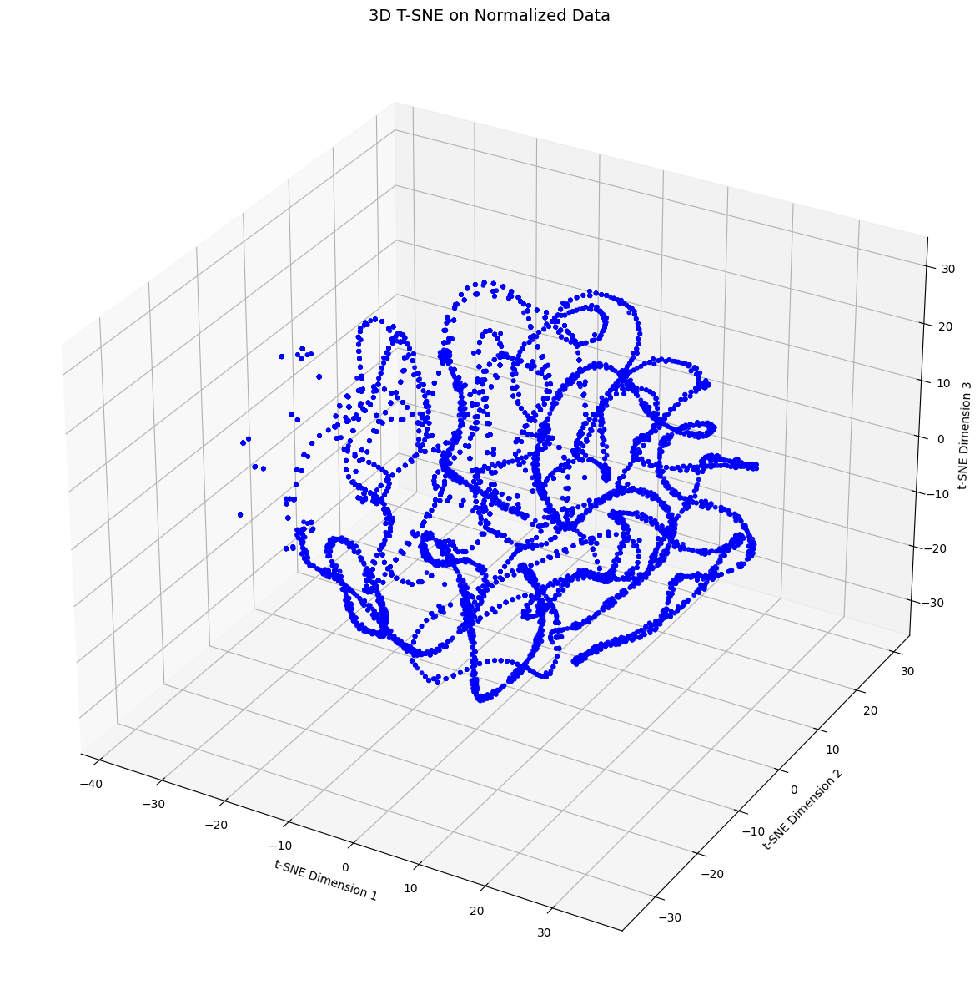

In [ ]:
# Set plot size
rcParams['figure.figsize'] = 15, 15

# Plot 3D scatter plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(
    X_ts_3d[:, 0],
    X_ts_3d[:, 1],
    X_ts_3d[:, 2],
    cmap=plt.cm.PuOr,
    c='blue',
    s=10,
    alpha=0.9
)

ax.set_title('3D t-SNE Visualization')
ax.set_xlabel('t-SNE Dimension 1')
ax.set_ylabel('t-SNE Dimension 2')
ax.set_zlabel('t-SNE Dimension 3')

# Add title
ax.set_title('3D T-SNE on Normalized Data', fontsize=14)

# Save the figure
fig.savefig('/content/drive/My Drive/Colab Notebooks/3D/3d_tsne', dpi=300)

# Show the plot
plt.show()

<ipython-input-118-a2ca0081593a>:8: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



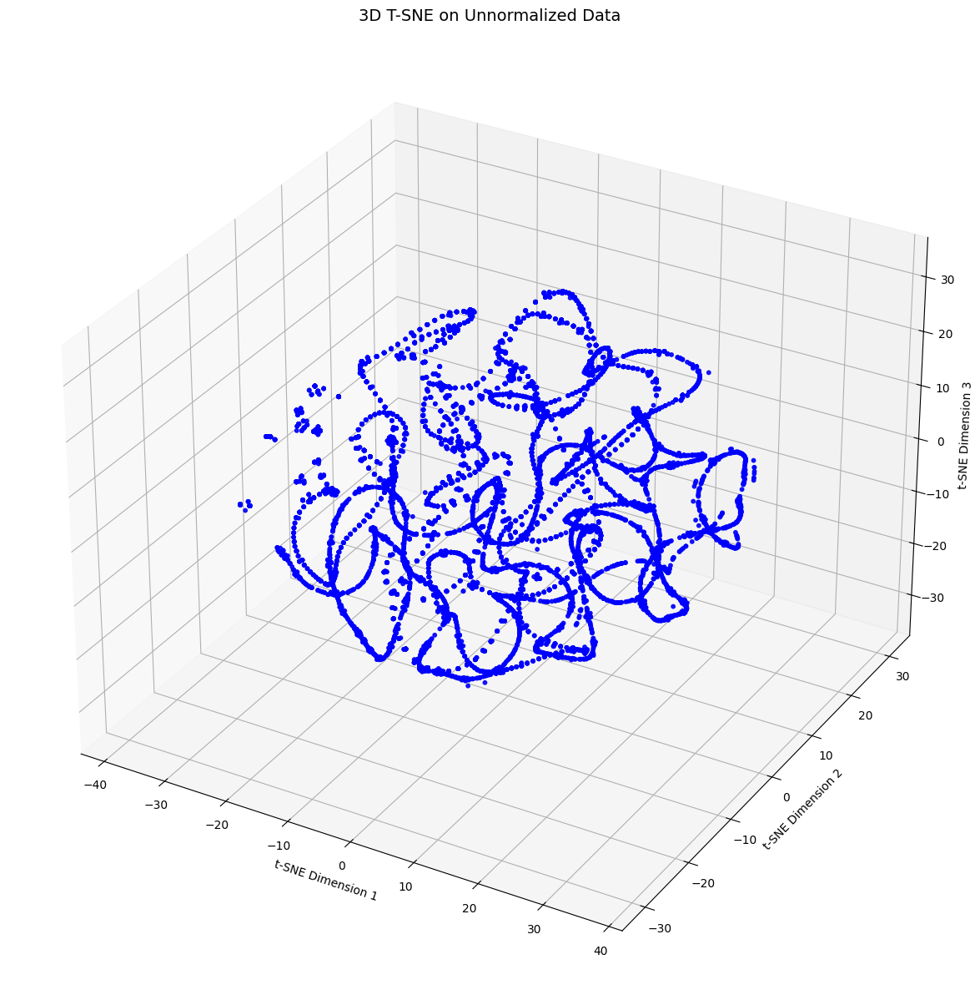

In [ ]:
# Set plot size
rcParams['figure.figsize'] = 15, 15

# Plot 3D scatter plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(
    X_ts_3d_unnormalize[:, 0],
    X_ts_3d_unnormalize[:, 1],
    X_ts_3d_unnormalize[:, 2],
    cmap=plt.cm.PuOr,
    c='blue',
    s=10,
    alpha=0.9
)

ax.set_title('3D t-SNE Visualization')
ax.set_xlabel('t-SNE Dimension 1')
ax.set_ylabel('t-SNE Dimension 2')
ax.set_zlabel('t-SNE Dimension 3')

# Add title
ax.set_title('3D T-SNE on Unnormalized Data', fontsize=14)

# Save the figure
fig.savefig('/content/drive/My Drive/Colab Notebooks/3D/3d_tsne_unnormalize', dpi=300)

# Show the plot
plt.show()

# 2D T-SNE

In [ ]:
import plotly.express as px
import pandas as pd
from sklearn.manifold import TSNE
import matplotlib.cm as cm
from matplotlib.colors import Normalize

tsne = TSNE(n_components=2,
            perplexity=40,
            n_iter=2000,
            learning_rate=100,
            method='barnes_hut',
            random_state=42)
X_ts_2d = tsne.fit_transform(iforest_df)

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


In [ ]:
import plotly.express as px
import pandas as pd
from sklearn.manifold import TSNE
import matplotlib.cm as cm
from matplotlib.colors import Normalize

tsne = TSNE(n_components=2,
            perplexity=40,
            n_iter=2000,
            learning_rate=100,
            method='barnes_hut',
            random_state=42)
X_ts_2d_unnormalize = tsne.fit_transform(iforest_df_unnormalize)

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


### Normalized

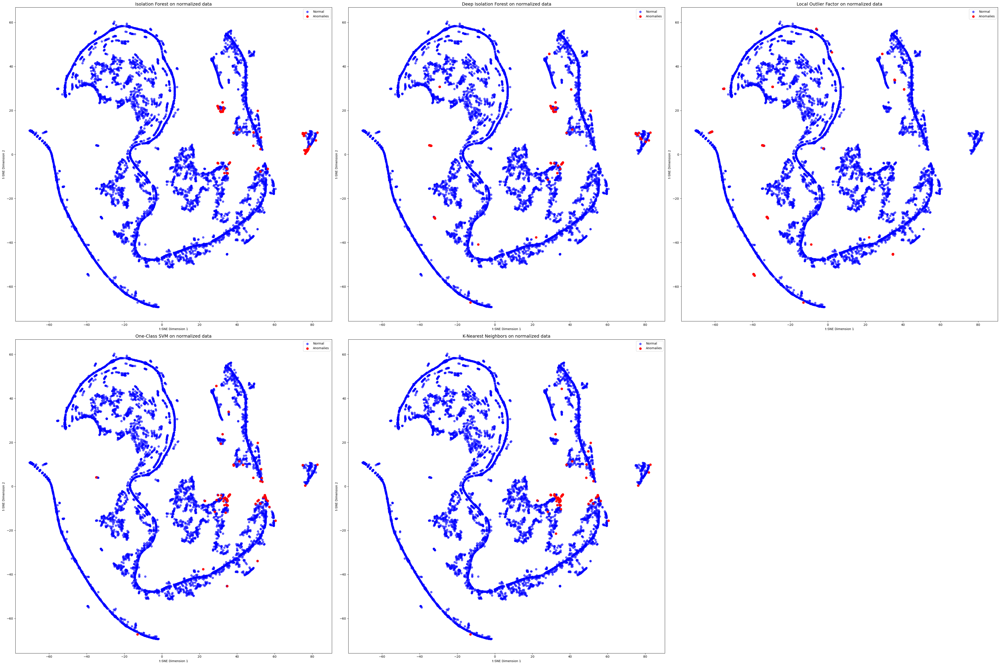

In [ ]:
# Add t-SNE coordinates to the data (IF)
data_if['tsne_x'] = X_ts_2d[:, 0]
data_if['tsne_y'] = X_ts_2d[:, 1]

# Split into normal and anomalies (IF)
normal_if = data_if[data_if['anomaly'] == 1]
anomalies_if = data_if[data_if['anomaly'] == -1]

# Add t-SNE coordinates to the data (DIF)
data_dif['tsne_x'] = X_ts_2d[:, 0]
data_dif['tsne_y'] = X_ts_2d[:, 1]

# Split into normal and anomalies (DIF)
normal_dif = data_dif[normal_dif_mask]
anomalies_dif = data_dif[anomalies_dif_mask]

# Add t-SNE coordinates to KNN data
data_knn['tsne_x'] = X_ts_2d[:, 0]
data_knn['tsne_y'] = X_ts_2d[:, 1]

# Split into normal and anomalies
normal_knn = data_knn[~anomalies]
anomalies_knn = data_knn[anomalies]

# Add t-SNE coordinates to LOF data
data_lof['tsne_x'] = X_ts_2d[:, 0]
data_lof['tsne_y'] = X_ts_2d[:, 1]

# Split into normal and anomalies (LOF)
normal_lof = data_lof[data_lof['anomaly'] == 1]
anomalies_lof = data_lof[data_lof['anomaly'] == -1]

# Add t-SNE coordinates to OCSVM data
data_ocsvm['tsne_x'] = X_ts_2d[:, 0]
data_ocsvm['tsne_y'] = X_ts_2d[:, 1]

# Split into normal and anomalies
normal_ocsvm = data_ocsvm[data_ocsvm['anomaly'] == 1]
anomalies_ocsvm = data_ocsvm[data_ocsvm['anomaly'] == -1]


# Update figure size for 3x2 layout
rcParams['figure.figsize'] = 45, 30  # Adjust for two rows of plots
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(45, 30))  # 3 in the first row, 2 in the second

# Flatten the axes array for easier indexing
axes = axes.flatten()

# Plot 1: Isolation Forest (IF)
axes[0].scatter(normal_if['tsne_x'], normal_if['tsne_y'], c='blue', s=40, label='Normal', alpha=0.6)
axes[0].scatter(anomalies_if['tsne_x'], anomalies_if['tsne_y'], c='red', s=50, label='Anomalies', alpha=0.9)
axes[0].legend()
axes[0].set_title('Isolation Forest on normalized data', fontsize=14)
axes[0].set_xlabel('t-SNE Dimension 1')
axes[0].set_ylabel('t-SNE Dimension 2')

# Plot 2: Deep Isolation Forest (DIF)
axes[1].scatter(normal_dif['tsne_x'], normal_dif['tsne_y'], c='blue', s=40, label='Normal', alpha=0.6)
axes[1].scatter(anomalies_dif['tsne_x'], anomalies_dif['tsne_y'], c='red', s=50, label='Anomalies', alpha=0.9)
axes[1].legend()
axes[1].set_title('Deep Isolation Forest on normalized data', fontsize=14)
axes[1].set_xlabel('t-SNE Dimension 1')
axes[1].set_ylabel('t-SNE Dimension 2')

# Plot 3: Local Outlier Factor (LOF)
axes[2].scatter(normal_lof['tsne_x'], normal_lof['tsne_y'], c='blue', s=40, label='Normal', alpha=0.6)
axes[2].scatter(anomalies_lof['tsne_x'], anomalies_lof['tsne_y'], c='red', s=50, label='Anomalies', alpha=0.9)
axes[2].legend()
axes[2].set_title('Local Outlier Factor on normalized data', fontsize=14)
axes[2].set_xlabel('t-SNE Dimension 1')
axes[2].set_ylabel('t-SNE Dimension 2')

# Plot 4: One-Class SVM (OC-SVM)
axes[3].scatter(normal_ocsvm['tsne_x'], normal_ocsvm['tsne_y'], c='blue', s=40, label='Normal', alpha=0.6)
axes[3].scatter(anomalies_ocsvm['tsne_x'], anomalies_ocsvm['tsne_y'], c='red', s=50, label='Anomalies', alpha=0.9)
axes[3].legend()
axes[3].set_title('One-Class SVM on normalized data', fontsize=14)
axes[3].set_xlabel('t-SNE Dimension 1')
axes[3].set_ylabel('t-SNE Dimension 2')

# Plot 5: KNN
axes[4].scatter(normal_knn['tsne_x'], normal_knn['tsne_y'], c='blue', s=40, label='Normal', alpha=0.6)
axes[4].scatter(anomalies_knn['tsne_x'], anomalies_knn['tsne_y'], c='red', s=50, label='Anomalies', alpha=0.9)
axes[4].legend()
axes[4].set_title('K-Nearest Neighbors on normalized data', fontsize=14)
axes[4].set_xlabel('t-SNE Dimension 1')
axes[4].set_ylabel('t-SNE Dimension 2')

# Remove the empty subplot (5th column in second row)
fig.delaxes(axes[5])  # Remove the unused subplot

# Adjust layout and show the plot
plt.tight_layout()
plt.show()


### Unnormalized

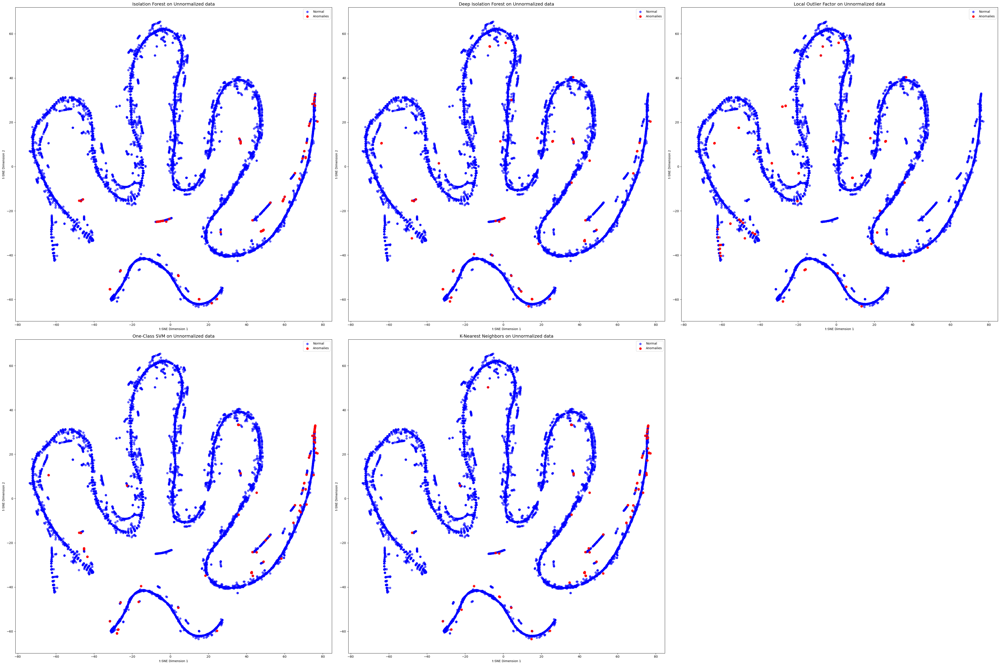

In [ ]:
# Add t-SNE coordinates to the data (IF)
data_if['tsne_x'] = X_ts_2d_unnormalize[:, 0]
data_if['tsne_y'] = X_ts_2d_unnormalize[:, 1]

# Split into normal and anomalies (IF)
normal_if = data_if[data_if['anomaly'] == 1]
anomalies_if = data_if[data_if['anomaly'] == -1]

# Add t-SNE coordinates to the data (DIF)
data_dif['tsne_x'] = X_ts_2d_unnormalize[:, 0]
data_dif['tsne_y'] = X_ts_2d_unnormalize[:, 1]

# Split into normal and anomalies (DIF)
normal_dif = data_dif[normal_dif_mask]
anomalies_dif = data_dif[anomalies_dif_mask]

# Add t-SNE coordinates to KNN data
data_knn['tsne_x'] = X_ts_2d_unnormalize[:, 0]
data_knn['tsne_y'] = X_ts_2d_unnormalize[:, 1]

# Split into normal and anomalies
normal_knn = data_knn[~anomalies]
anomalies_knn = data_knn[anomalies]

# Add t-SNE coordinates to LOF data
data_lof['tsne_x'] = X_ts_2d_unnormalize[:, 0]
data_lof['tsne_y'] = X_ts_2d_unnormalize[:, 1]

# Split into normal and anomalies (LOF)
normal_lof = data_lof[data_lof['anomaly'] == 1]
anomalies_lof = data_lof[data_lof['anomaly'] == -1]

# Add t-SNE coordinates to OCSVM data
data_ocsvm['tsne_x'] = X_ts_2d_unnormalize[:, 0]
data_ocsvm['tsne_y'] = X_ts_2d_unnormalize[:, 1]

# Split into normal and anomalies
normal_ocsvm = data_ocsvm[data_ocsvm['anomaly'] == 1]
anomalies_ocsvm = data_ocsvm[data_ocsvm['anomaly'] == -1]


# Update figure size for 3x2 layout
rcParams['figure.figsize'] = 45, 30  # Adjust for two rows of plots
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(45, 30))  # 3 in the first row, 2 in the second

# Flatten the axes array for easier indexing
axes = axes.flatten()

# Plot 1: Isolation Forest (IF)
axes[0].scatter(normal_if['tsne_x'], normal_if['tsne_y'], c='blue', s=40, label='Normal', alpha=0.6)
axes[0].scatter(anomalies_if['tsne_x'], anomalies_if['tsne_y'], c='red', s=50, label='Anomalies', alpha=0.9)
axes[0].legend()
axes[0].set_title('Isolation Forest on Unnormalized data', fontsize=14)
axes[0].set_xlabel('t-SNE Dimension 1')
axes[0].set_ylabel('t-SNE Dimension 2')

# Plot 2: Deep Isolation Forest (DIF)
axes[1].scatter(normal_dif['tsne_x'], normal_dif['tsne_y'], c='blue', s=40, label='Normal', alpha=0.6)
axes[1].scatter(anomalies_dif['tsne_x'], anomalies_dif['tsne_y'], c='red', s=50, label='Anomalies', alpha=0.9)
axes[1].legend()
axes[1].set_title('Deep Isolation Forest on Unnormalized data', fontsize=14)
axes[1].set_xlabel('t-SNE Dimension 1')
axes[1].set_ylabel('t-SNE Dimension 2')

# Plot 3: Local Outlier Factor (LOF)
axes[2].scatter(normal_lof['tsne_x'], normal_lof['tsne_y'], c='blue', s=40, label='Normal', alpha=0.6)
axes[2].scatter(anomalies_lof['tsne_x'], anomalies_lof['tsne_y'], c='red', s=50, label='Anomalies', alpha=0.9)
axes[2].legend()
axes[2].set_title('Local Outlier Factor on Unnormalized data', fontsize=14)
axes[2].set_xlabel('t-SNE Dimension 1')
axes[2].set_ylabel('t-SNE Dimension 2')

# Plot 4: One-Class SVM (OC-SVM)
axes[3].scatter(normal_ocsvm['tsne_x'], normal_ocsvm['tsne_y'], c='blue', s=40, label='Normal', alpha=0.6)
axes[3].scatter(anomalies_ocsvm['tsne_x'], anomalies_ocsvm['tsne_y'], c='red', s=50, label='Anomalies', alpha=0.9)
axes[3].legend()
axes[3].set_title('One-Class SVM on Unnormalized data', fontsize=14)
axes[3].set_xlabel('t-SNE Dimension 1')
axes[3].set_ylabel('t-SNE Dimension 2')

# Plot 5: KNN
axes[4].scatter(normal_knn['tsne_x'], normal_knn['tsne_y'], c='blue', s=40, label='Normal', alpha=0.6)
axes[4].scatter(anomalies_knn['tsne_x'], anomalies_knn['tsne_y'], c='red', s=50, label='Anomalies', alpha=0.9)
axes[4].legend()
axes[4].set_title('K-Nearest Neighbors on Unnormalized data', fontsize=14)
axes[4].set_xlabel('t-SNE Dimension 1')
axes[4].set_ylabel('t-SNE Dimension 2')

# Remove the empty subplot (5th column in second row)
fig.delaxes(axes[5])  # Remove the unused subplot

# Adjust layout and show the plot
plt.tight_layout()
plt.show()


### Normalized IF vs DIF

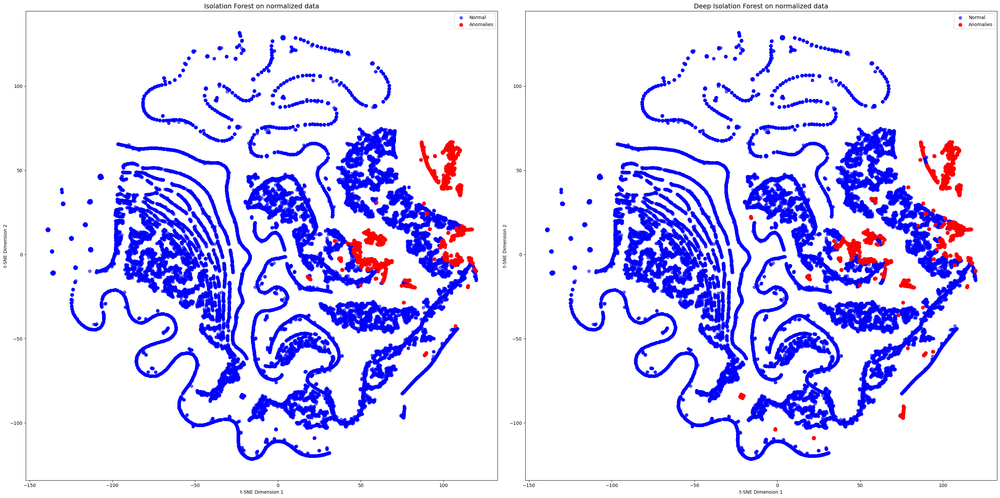

In [ ]:
import matplotlib.pyplot as plt
from matplotlib import rcParams

# Add t-SNE coordinates to the data (IF)
data_if['tsne_x'] = X_ts_2d[:, 0]
data_if['tsne_y'] = X_ts_2d[:, 1]

# Split into normal and anomalies (IF)
normal_if = data_if[data_if['anomaly'] == 1]
anomalies_if = data_if[data_if['anomaly'] == -1]

# Add t-SNE coordinates to the data (DIF)
data_dif['tsne_x'] = X_ts_2d[:, 0]
data_dif['tsne_y'] = X_ts_2d[:, 1]

# Split into normal and anomalies (DIF)
normal_dif = data_dif[normal_dif_mask]
anomalies_dif = data_dif[anomalies_dif_mask]

# Plotting t-SNE with anomalies highlighted in side-by-side subplots
rcParams['figure.figsize'] = 30, 15  # Adjust figure size for horizontal layout
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(30, 15))  # Two subplots side by side

# Plot 1: Isolation Forest (IF)
axes[0].scatter(normal_if['tsne_x'], normal_if['tsne_y'], c='blue', s=40, label='Normal', alpha=0.6)
axes[0].scatter(anomalies_if['tsne_x'], anomalies_if['tsne_y'], c='red', s=50, label='Anomalies', alpha=0.9)
axes[0].legend()
axes[0].set_title('Isolation Forest on normalized data', fontsize=14)
axes[0].set_xlabel('t-SNE Dimension 1')
axes[0].set_ylabel('t-SNE Dimension 2')

# Plot 2: DIF
axes[1].scatter(normal_dif['tsne_x'], normal_dif['tsne_y'], c='blue', s=40, label='Normal', alpha=0.6)
axes[1].scatter(anomalies_dif['tsne_x'], anomalies_dif['tsne_y'], c='red', s=50, label='Anomalies', alpha=0.9)
axes[1].legend()
axes[1].set_title('Deep Isolation Forest on normalized data', fontsize=14)
axes[1].set_xlabel('t-SNE Dimension 1')
axes[1].set_ylabel('t-SNE Dimension 2')

# Save the figure
#fig.savefig('/content/drive/My Drive/Colab Notebooks/2D/2d_tsne_normalized', dpi=300)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

### Unnormalized IF vs DIF

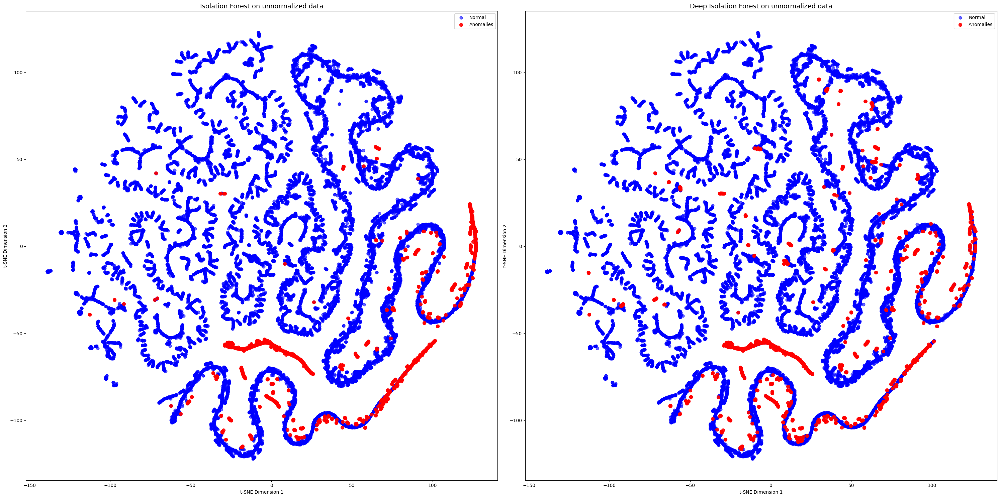

In [ ]:
import matplotlib.pyplot as plt
from matplotlib import rcParams

# Add t-SNE coordinates to the data (IF)
data_if['tsne_x'] = X_ts_2d_unnormalize[:, 0]
data_if['tsne_y'] = X_ts_2d_unnormalize[:, 1]

# Split into normal and anomalies (IF)
normal_if = data_if[data_if['anomaly'] == 1]
anomalies_if = data_if[data_if['anomaly'] == -1]

# Add t-SNE coordinates to the data (DIF)
data_dif['tsne_x'] = X_ts_2d_unnormalize[:, 0]
data_dif['tsne_y'] = X_ts_2d_unnormalize[:, 1]

# Split into normal and anomalies (DIF)
normal_dif = data_dif[normal_dif_mask]
anomalies_dif = data_dif[anomalies_dif_mask]

# Plotting t-SNE with anomalies highlighted in side-by-side subplots
rcParams['figure.figsize'] = 30, 15  # Adjust figure size for horizontal layout
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(30, 15))  # Two subplots side by side

# Plot 1: Isolation Forest (IF)
axes[0].scatter(normal_if['tsne_x'], normal_if['tsne_y'], c='blue', s=40, label='Normal', alpha=0.6)
axes[0].scatter(anomalies_if['tsne_x'], anomalies_if['tsne_y'], c='red', s=50, label='Anomalies', alpha=0.9)
axes[0].legend()
axes[0].set_title('Isolation Forest on unnormalized data', fontsize=14)
axes[0].set_xlabel('t-SNE Dimension 1')
axes[0].set_ylabel('t-SNE Dimension 2')

# Plot 2: DIF
axes[1].scatter(normal_dif['tsne_x'], normal_dif['tsne_y'], c='blue', s=40, label='Normal', alpha=0.6)
axes[1].scatter(anomalies_dif['tsne_x'], anomalies_dif['tsne_y'], c='red', s=50, label='Anomalies', alpha=0.9)
axes[1].legend()
axes[1].set_title('Deep Isolation Forest on unnormalized data', fontsize=14)
axes[1].set_xlabel('t-SNE Dimension 1')
axes[1].set_ylabel('t-SNE Dimension 2')

# Save the figure
#fig.savefig('/content/drive/My Drive/Colab Notebooks/2D/2d_tsne_unnormalized', dpi=300)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

In [ ]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Add t-SNE coordinates and prepare data for each model
data_if_unnormalize = iforest_df_unnormalize_interpret.copy()
data_if_unnormalize['tsne_x'] = X_ts_2d[:, 0]
data_if_unnormalize['tsne_y'] = X_ts_2d[:, 1]
data_if_unnormalize['category'] = 'Normal'
data_if_unnormalize.loc[anomalies_if.index, 'category'] = 'Anomaly'

data_dif_unnormalize = iforest_df_unnormalize_interpret.copy()
data_dif_unnormalize['tsne_x'] = X_ts_2d[:, 0]
data_dif_unnormalize['tsne_y'] = X_ts_2d[:, 1]
data_dif_unnormalize['category'] = 'Normal'
data_dif_unnormalize.loc[anomalies_dif.index, 'category'] = 'Anomaly'

data_knn_unnormalize = iforest_df_unnormalize_interpret.copy()
data_knn_unnormalize['tsne_x'] = X_ts_2d[:, 0]
data_knn_unnormalize['tsne_y'] = X_ts_2d[:, 1]
data_knn_unnormalize['category'] = 'Normal'  # Default to 'Normal'
data_knn_unnormalize.loc[anomalies_knn.index, 'category'] = 'Anomaly'

data_lof_unnormalize = iforest_df_unnormalize_interpret.copy()
data_lof_unnormalize['tsne_x'] = X_ts_2d[:, 0]
data_lof_unnormalize['tsne_y'] = X_ts_2d[:, 1]
data_lof_unnormalize['category'] = 'Normal'
data_lof_unnormalize.loc[anomalies_lof.index, 'category'] = 'Anomaly'

data_ocsvm_unnormalize = iforest_df_unnormalize_interpret.copy()
data_ocsvm_unnormalize['tsne_x'] = X_ts_2d[:, 0]
data_ocsvm_unnormalize['tsne_y'] = X_ts_2d[:, 1]
data_ocsvm_unnormalize['category'] = 'Normal'
data_ocsvm_unnormalize.loc[anomalies_ocsvm.index, 'category'] = 'Anomaly'

# Exclude tsne_x and tsne_y from hover data
excluded_columns = ['tsne_x', 'tsne_y']

# Prepare hover texts for all models
hover_texts = {
    "IF": data_if_unnormalize.drop(columns=excluded_columns).apply(
        lambda row: "<br>".join([f"{col}: {row[col]}" for col in row.index]), axis=1),
    "DIF": data_dif_unnormalize.drop(columns=excluded_columns).apply(
        lambda row: "<br>".join([f"{col}: {row[col]}" for col in row.index]), axis=1),
    "KNN": data_knn_unnormalize.drop(columns=excluded_columns).apply(
        lambda row: "<br>".join([f"{col}: {row[col]}" for col in row.index]), axis=1),
    "LOF": data_lof_unnormalize.drop(columns=excluded_columns).apply(
        lambda row: "<br>".join([f"{col}: {row[col]}" for col in row.index]), axis=1),
    "OCSVM": data_ocsvm_unnormalize.drop(columns=excluded_columns).apply(
        lambda row: "<br>".join([f"{col}: {row[col]}" for col in row.index]), axis=1),
}

# Prepare data for plotting
data_models = {
    "IF": data_if_unnormalize,
    "DIF": data_dif_unnormalize,
    "KNN": data_knn_unnormalize,
    "LOF": data_lof_unnormalize,
    "OCSVM": data_ocsvm_unnormalize
}

# Create a subplot with 3 plots in the first row and 2 plots in the second row
fig = make_subplots(
    rows=2, cols=3,
    subplot_titles=list(data_models.keys()),
    specs=[[{"type": "scatter"}, {"type": "scatter"}, {"type": "scatter"}],
           [{"type": "scatter"}, {"type": "scatter"}, None]]
)

# Add traces for each model
for i, (model_name, model_data) in enumerate(data_models.items(), start=1):
    row = (i - 1) // 3 + 1  # Calculate row index (1 or 2)
    col = (i - 1) % 3 + 1   # Calculate column index (1, 2, or 3)

    fig.add_trace(
        go.Scatter(
            x=model_data['tsne_x'],
            y=model_data['tsne_y'],
            mode='markers',
            marker=dict(
                color=model_data['category'].map({'Normal': 'blue', 'Anomaly': 'red'}),
                size=5,
                opacity=0.6
            ),
            text=hover_texts[model_name],
            hovertemplate="%{text}<extra></extra>",  # Use hover text
            name=model_name
        ),
        row=row, col=col
    )

# Update layout for the combined plot
fig.update_layout(
    title="t-SNE Visualization of Anomalies Across Models",
    height=2000,  # Adjusted height
    width=2400,  # Adjusted width for balanced layout
    showlegend=False
)

# Show the plot
fig.show()


NameError: name 'anomalies_knn' is not defined

### Interactive Normalized

In [ ]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Add t-SNE coordinates for IF
data_if_unnormalize = iforest_df_unnormalize_interpret.copy()
data_if_unnormalize['tsne_x'] = X_ts_2d[:, 0]
data_if_unnormalize['tsne_y'] = X_ts_2d[:, 1]
data_if_unnormalize['category'] = 'Normal'
data_if_unnormalize.loc[data_if['anomaly'] == -1, 'category'] = 'Anomaly'

# Add t-SNE coordinates for DIF
data_dif_unnormalize = iforest_df_unnormalize_interpret.copy()
data_dif_unnormalize['tsne_x'] = X_ts_2d[:, 0]
data_dif_unnormalize['tsne_y'] = X_ts_2d[:, 1]
data_dif_unnormalize['category'] = 'Normal'
data_dif_unnormalize.loc[anomalies_dif.index, 'category'] = 'Anomaly'

# Exclude tsne_x and tsne_y from hover data
excluded_columns = ['tsne_x', 'tsne_y']

# Prepare hover text for IF
hover_text_if = data_if_unnormalize.drop(columns=excluded_columns).apply(
    lambda row: "<br>".join([f"{col}: {row[col]}" for col in row.index]), axis=1
)

# Plot 1: Isolation Forest
fig = make_subplots(rows=1, cols=2, subplot_titles=("Isolation Forest (IF) on Normalized Data", "Deep Isolation Forest (DIF) on Normalized Data"))

fig.add_trace(
    go.Scatter(
        x=data_if_unnormalize['tsne_x'],
        y=data_if_unnormalize['tsne_y'],
        mode='markers',
        marker=dict(
            color=data_if_unnormalize['category'].map({'Normal': 'blue', 'Anomaly': 'red'}),
            size=5,
            opacity=0.6
        ),
        text=hover_text_if,
        hovertemplate="%{text}<extra></extra>",  # Use hover text
        name="IF"
    ),
    row=1, col=1
)

# Prepare hover text for DIF
hover_text_dif = data_dif_unnormalize.drop(columns=excluded_columns).apply(
    lambda row: "<br>".join([f"{col}: {row[col]}" for col in row.index]), axis=1
)

# Plot 2: Deep Isolation Forest
fig.add_trace(
    go.Scatter(
        x=data_dif_unnormalize['tsne_x'],
        y=data_dif_unnormalize['tsne_y'],
        mode='markers',
        marker=dict(
            color=data_dif_unnormalize['category'].map({'Normal': 'blue', 'Anomaly': 'red'}),
            size=5,
            opacity=0.6
        ),
        text=hover_text_dif,
        hovertemplate="%{text}<extra></extra>",  # Use hover text
        name="DIF"
    ),
    row=1, col=2
)

# Update layout with larger size and centered title
fig.update_layout(
    showlegend=False,
    height=800,  # Increased height
    width=1600  # Increased width
)

# Save the plot as an interactive HTML file
#fig.write_html('/content/drive/My Drive/Colab Notebooks/2D/interactive_2d_tsne_normalized.html')

# Show the plot
fig.show()


Output hidden; open in https://colab.research.google.com to view.

### Interactive Unnormalized

In [ ]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Add t-SNE coordinates for IF
data_if_unnormalize = iforest_df_unnormalize_interpret.copy()
data_if_unnormalize['tsne_x'] = X_ts_2d_unnormalize[:, 0]
data_if_unnormalize['tsne_y'] = X_ts_2d_unnormalize[:, 1]
data_if_unnormalize['category'] = 'Normal'
data_if_unnormalize.loc[data_if['anomaly'] == -1, 'category'] = 'Anomaly'

# Add t-SNE coordinates for DIF
data_dif_unnormalize = iforest_df_unnormalize_interpret.copy()
data_dif_unnormalize['tsne_x'] = X_ts_2d_unnormalize[:, 0]
data_dif_unnormalize['tsne_y'] = X_ts_2d_unnormalize[:, 1]
data_dif_unnormalize['category'] = 'Normal'
data_dif_unnormalize.loc[anomalies_dif.index, 'category'] = 'Anomaly'

# Exclude tsne_x and tsne_y from hover data
excluded_columns = ['tsne_x', 'tsne_y']

# Prepare hover text for IF
hover_text_if = data_if_unnormalize.drop(columns=excluded_columns).apply(
    lambda row: "<br>".join([f"{col}: {row[col]}" for col in row.index]), axis=1
)

# Plot 1: Isolation Forest
fig = make_subplots(rows=1, cols=2, subplot_titles=("Isolation Forest (IF) on Unnormalized Data", "Deep Isolation Forest (DIF) on Unnormalized Data"))

fig.add_trace(
    go.Scatter(
        x=data_if_unnormalize['tsne_x'],
        y=data_if_unnormalize['tsne_y'],
        mode='markers',
        marker=dict(
            color=data_if_unnormalize['category'].map({'Normal': 'blue', 'Anomaly': 'red'}),
            size=5,
            opacity=0.6
        ),
        text=hover_text_if,
        hovertemplate="%{text}<extra></extra>",  # Use hover text
        name="IF"
    ),
    row=1, col=1
)

# Prepare hover text for DIF
hover_text_dif = data_dif_unnormalize.drop(columns=excluded_columns).apply(
    lambda row: "<br>".join([f"{col}: {row[col]}" for col in row.index]), axis=1
)

# Plot 2: Deep Isolation Forest
fig.add_trace(
    go.Scatter(
        x=data_dif_unnormalize['tsne_x'],
        y=data_dif_unnormalize['tsne_y'],
        mode='markers',
        marker=dict(
            color=data_dif_unnormalize['category'].map({'Normal': 'blue', 'Anomaly': 'red'}),
            size=5,
            opacity=0.6
        ),
        text=hover_text_dif,
        hovertemplate="%{text}<extra></extra>",  # Use hover text
        name="DIF"
    ),
    row=1, col=2
)

# Update layout with larger size and centered title
fig.update_layout(
    showlegend=False,
    height=800,  # Increased height
    width=1600  # Increased width
)

# Save the plot as an interactive HTML file
#fig.write_html('/content/drive/My Drive/Colab Notebooks/2D/interactive_2d_tsne_normalized.html')

# Show the plot
fig.show()


Output hidden; open in https://colab.research.google.com to view.

In [ ]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Add t-SNE coordinates for IF (3D)
data_if_unnormalize = iforest_df_unnormalize.copy()
data_if_unnormalize['tsne_x'] = X_ts_3d[:, 0]
data_if_unnormalize['tsne_y'] = X_ts_3d[:, 1]
data_if_unnormalize['tsne_z'] = X_ts_3d[:, 2]
data_if_unnormalize['category'] = 'Normal'
data_if_unnormalize.loc[data_if['anomaly'] == -1, 'category'] = 'Anomaly'

# Add t-SNE coordinates for DIF (3D)
data_dif_unnormalize = iforest_df_unnormalize.copy()
data_dif_unnormalize['tsne_x'] = X_ts_3d[:, 0]
data_dif_unnormalize['tsne_y'] = X_ts_3d[:, 1]
data_dif_unnormalize['tsne_z'] = X_ts_3d[:, 2]
data_dif_unnormalize['category'] = 'Normal'
data_dif_unnormalize.loc[anomalies_dif.index, 'category'] = 'Anomaly'

# Exclude tsne_x, tsne_y, and tsne_z from hover data
excluded_columns = ['tsne_x', 'tsne_y', 'tsne_z']

# Prepare hover text for IF
hover_text_if = data_if_unnormalize.drop(columns=excluded_columns).apply(
    lambda row: "<br>".join([f"{col}: {row[col]}" for col in row.index]), axis=1
)

# Prepare hover text for DIF
hover_text_dif = data_dif_unnormalize.drop(columns=excluded_columns).apply(
    lambda row: "<br>".join([f"{col}: {row[col]}" for col in row.index]), axis=1
)

# Create a figure for 3D plots
fig = make_subplots(
    rows=1, cols=2,
    specs=[[{'type': 'scatter3d'}, {'type': 'scatter3d'}]],  # Specify 3D subplots
    subplot_titles=("Isolation Forest (IF) on Normalized Data", "Deep Isolation Forest (DIF) on Normalized Data")
)

# Plot 1: Isolation Forest
fig.add_trace(
    go.Scatter3d(
        x=data_if_unnormalize['tsne_x'],
        y=data_if_unnormalize['tsne_y'],
        z=data_if_unnormalize['tsne_z'],
        mode='markers',
        marker=dict(
            color=data_if_unnormalize['category'].map({'Normal': 'blue', 'Anomaly': 'red'}),
            size=3,
            opacity=0.6
        ),
        text=hover_text_if,
        hovertemplate="%{text}<extra></extra>",  # Use hover text
        name="IF"
    ),
    row=1, col=1
)

# Plot 2: Deep Isolation Forest
fig.add_trace(
    go.Scatter3d(
        x=data_dif_unnormalize['tsne_x'],
        y=data_dif_unnormalize['tsne_y'],
        z=data_dif_unnormalize['tsne_z'],
        mode='markers',
        marker=dict(
            color=data_dif_unnormalize['category'].map({'Normal': 'blue', 'Anomaly': 'red'}),
            size=3,
            opacity=0.6
        ),
        text=hover_text_dif,
        hovertemplate="%{text}<extra></extra>",  # Use hover text
        name="DIF"
    ),
    row=1, col=2
)

# Update layout for the 3D plot
fig.update_layout(
    height=800,  # Larger height for better visualization
    width=1600,  # Larger width for side-by-side comparison
    showlegend=False,
)

# Save the plot as an interactive HTML file
#fig.write_html('/content/drive/My Drive/Colab Notebooks/3D/3d_tsne_normalized.html')

# Show the plot
fig.show()

IndexError: index 2 is out of bounds for axis 1 with size 2

In [ ]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Add t-SNE coordinates for IF
data_if_unnormalize = iforest_df_unnormalize.copy()
data_if_unnormalize['tsne_x'] = X_ts_2d_unnormalize[:, 0]
data_if_unnormalize['tsne_y'] = X_ts_2d_unnormalize[:, 1]
data_if_unnormalize['category'] = 'Normal'
data_if_unnormalize.loc[data_if['anomaly'] == -1, 'category'] = 'Anomaly'

# Add t-SNE coordinates for DIF
data_dif_unnormalize = iforest_df_unnormalize.copy()
data_dif_unnormalize['tsne_x'] = X_ts_2d_unnormalize[:, 0]
data_dif_unnormalize['tsne_y'] = X_ts_2d_unnormalize[:, 1]
data_dif_unnormalize['category'] = 'Normal'
data_dif_unnormalize.loc[anomalies_dif.index, 'category'] = 'Anomaly'

# Exclude tsne_x and tsne_y from hover data
excluded_columns = ['tsne_x', 'tsne_y']

# Prepare hover text for IF
hover_text_if = data_if_unnormalize.drop(columns=excluded_columns).apply(
    lambda row: "<br>".join([f"{col}: {row[col]}" for col in row.index]), axis=1
)

# Plot 1: Isolation Forest
fig = make_subplots(rows=1, cols=2, subplot_titles=("Isolation Forest (IF) on Unnormalized Data", "Deep Isolation Forest (DIF) on Unnormalized Data"))

fig.add_trace(
    go.Scatter(
        x=data_if_unnormalize['tsne_x'],
        y=data_if_unnormalize['tsne_y'],
        mode='markers',
        marker=dict(
            color=data_if_unnormalize['category'].map({'Normal': 'blue', 'Anomaly': 'red'}),
            size=5,
            opacity=0.6
        ),
        text=hover_text_if,
        hovertemplate="%{text}<extra></extra>",  # Use hover text
        name="IF"
    ),
    row=1, col=1
)

# Prepare hover text for DIF
hover_text_dif = data_dif_unnormalize.drop(columns=excluded_columns).apply(
    lambda row: "<br>".join([f"{col}: {row[col]}" for col in row.index]), axis=1
)

# Plot 2: Deep Isolation Forest
fig.add_trace(
    go.Scatter(
        x=data_dif_unnormalize['tsne_x'],
        y=data_dif_unnormalize['tsne_y'],
        mode='markers',
        marker=dict(
            color=data_dif_unnormalize['category'].map({'Normal': 'blue', 'Anomaly': 'red'}),
            size=5,
            opacity=0.6
        ),
        text=hover_text_dif,
        hovertemplate="%{text}<extra></extra>",  # Use hover text
        name="DIF"
    ),
    row=1, col=2
)

# Update layout with larger size and centered title
fig.update_layout(
    showlegend=False,
    height=800,  # Increased height
    width=1600  # Increased width
)

# Save the plot as an interactive HTML file
#fig.write_html('/content/drive/My Drive/Colab Notebooks/2D/interactive_2d_tsne_unnormalized.html')

# Show the plot
fig.show()


# 3D T-SNE

In [ ]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Add t-SNE coordinates for IF (3D)
data_if_unnormalize = iforest_df_unnormalize.copy()
data_if_unnormalize['tsne_x'] = X_ts_3d[:, 0]
data_if_unnormalize['tsne_y'] = X_ts_3d[:, 1]
data_if_unnormalize['tsne_z'] = X_ts_3d[:, 2]
data_if_unnormalize['category'] = 'Normal'
data_if_unnormalize.loc[data_if['anomaly'] == -1, 'category'] = 'Anomaly'

# Add t-SNE coordinates for DIF (3D)
data_dif_unnormalize = iforest_df_unnormalize.copy()
data_dif_unnormalize['tsne_x'] = X_ts_3d[:, 0]
data_dif_unnormalize['tsne_y'] = X_ts_3d[:, 1]
data_dif_unnormalize['tsne_z'] = X_ts_3d[:, 2]
data_dif_unnormalize['category'] = 'Normal'
data_dif_unnormalize.loc[anomalies_dif.index, 'category'] = 'Anomaly'

# Exclude tsne_x, tsne_y, and tsne_z from hover data
excluded_columns = ['tsne_x', 'tsne_y', 'tsne_z']

# Prepare hover text for IF
hover_text_if = data_if_unnormalize.drop(columns=excluded_columns).apply(
    lambda row: "<br>".join([f"{col}: {row[col]}" for col in row.index]), axis=1
)

# Prepare hover text for DIF
hover_text_dif = data_dif_unnormalize.drop(columns=excluded_columns).apply(
    lambda row: "<br>".join([f"{col}: {row[col]}" for col in row.index]), axis=1
)

# Create a figure for 3D plots
fig = make_subplots(
    rows=1, cols=2,
    specs=[[{'type': 'scatter3d'}, {'type': 'scatter3d'}]],  # Specify 3D subplots
    subplot_titles=("Isolation Forest (IF) on Normalized Data", "Deep Isolation Forest (DIF) on Normalized Data")
)

# Plot 1: Isolation Forest
fig.add_trace(
    go.Scatter3d(
        x=data_if_unnormalize['tsne_x'],
        y=data_if_unnormalize['tsne_y'],
        z=data_if_unnormalize['tsne_z'],
        mode='markers',
        marker=dict(
            color=data_if_unnormalize['category'].map({'Normal': 'blue', 'Anomaly': 'red'}),
            size=3,
            opacity=0.6
        ),
        text=hover_text_if,
        hovertemplate="%{text}<extra></extra>",  # Use hover text
        name="IF"
    ),
    row=1, col=1
)

# Plot 2: Deep Isolation Forest
fig.add_trace(
    go.Scatter3d(
        x=data_dif_unnormalize['tsne_x'],
        y=data_dif_unnormalize['tsne_y'],
        z=data_dif_unnormalize['tsne_z'],
        mode='markers',
        marker=dict(
            color=data_dif_unnormalize['category'].map({'Normal': 'blue', 'Anomaly': 'red'}),
            size=3,
            opacity=0.6
        ),
        text=hover_text_dif,
        hovertemplate="%{text}<extra></extra>",  # Use hover text
        name="DIF"
    ),
    row=1, col=2
)

# Update layout for the 3D plot
fig.update_layout(
    height=800,  # Larger height for better visualization
    width=1600,  # Larger width for side-by-side comparison
    showlegend=False,
)

# Save the plot as an interactive HTML file
#fig.write_html('/content/drive/My Drive/Colab Notebooks/3D/3d_tsne_normalized.html')

# Show the plot
fig.show()

NameError: name 'iforest_df_unnormalize' is not defined

In [ ]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Add t-SNE coordinates for IF (3D)
data_if_unnormalize = iforest_df_unnormalize.copy()
data_if_unnormalize['tsne_x'] = X_ts_3d_unnormalize[:, 0]
data_if_unnormalize['tsne_y'] = X_ts_3d_unnormalize[:, 1]
data_if_unnormalize['tsne_z'] = X_ts_3d_unnormalize[:, 2]
data_if_unnormalize['category'] = 'Normal'
data_if_unnormalize.loc[data_if['anomaly'] == -1, 'category'] = 'Anomaly'

# Add t-SNE coordinates for DIF (3D)
data_dif_unnormalize = iforest_df_unnormalize.copy()
data_dif_unnormalize['tsne_x'] = X_ts_3d_unnormalize[:, 0]
data_dif_unnormalize['tsne_y'] = X_ts_3d_unnormalize[:, 1]
data_dif_unnormalize['tsne_z'] = X_ts_3d_unnormalize[:, 2]
data_dif_unnormalize['category'] = 'Normal'
data_dif_unnormalize.loc[anomalies_dif.index, 'category'] = 'Anomaly'

# Exclude tsne_x, tsne_y, and tsne_z from hover data
excluded_columns = ['tsne_x', 'tsne_y', 'tsne_z']

# Prepare hover text for IF
hover_text_if = data_if_unnormalize.drop(columns=excluded_columns).apply(
    lambda row: "<br>".join([f"{col}: {row[col]}" for col in row.index]), axis=1
)

# Prepare hover text for DIF
hover_text_dif = data_dif_unnormalize.drop(columns=excluded_columns).apply(
    lambda row: "<br>".join([f"{col}: {row[col]}" for col in row.index]), axis=1
)

# Create a figure for 3D plots
fig = make_subplots(
    rows=1, cols=2,
    specs=[[{'type': 'scatter3d'}, {'type': 'scatter3d'}]],  # Specify 3D subplots
    subplot_titles=("Isolation Forest (IF) on Unnormalized Data", "Deep Isolation Forest (DIF) on Unnormalized Data")
)

# Plot 1: Isolation Forest
fig.add_trace(
    go.Scatter3d(
        x=data_if_unnormalize['tsne_x'],
        y=data_if_unnormalize['tsne_y'],
        z=data_if_unnormalize['tsne_z'],
        mode='markers',
        marker=dict(
            color=data_if_unnormalize['category'].map({'Normal': 'blue', 'Anomaly': 'red'}),
            size=3,
            opacity=0.6
        ),
        text=hover_text_if,
        hovertemplate="%{text}<extra></extra>",  # Use hover text
        name="IF"
    ),
    row=1, col=1
)

# Plot 2: Deep Isolation Forest
fig.add_trace(
    go.Scatter3d(
        x=data_dif_unnormalize['tsne_x'],
        y=data_dif_unnormalize['tsne_y'],
        z=data_dif_unnormalize['tsne_z'],
        mode='markers',
        marker=dict(
            color=data_dif_unnormalize['category'].map({'Normal': 'blue', 'Anomaly': 'red'}),
            size=3,
            opacity=0.6
        ),
        text=hover_text_dif,
        hovertemplate="%{text}<extra></extra>",  # Use hover text
        name="DIF"
    ),
    row=1, col=2
)

# Update layout for the 3D plot
fig.update_layout(
    height=800,  # Larger height for better visualization
    width=1600,  # Larger width for side-by-side comparison
    showlegend=False,
)

# Save the plot as an interactive HTML file
#fig.write_html('/content/drive/My Drive/Colab Notebooks/3D/3d_tsne_unnormalized.html')

# Show the plot
fig.show()

NameError: name 'X_ts_3d_unnormalize' is not defined

# Cross validation
Only for categorical variables

# SHAP

In [ ]:
# Randomly sample 100 representative points from the background dataset
background_data = shap.sample(iforest_df, 100)

### For IF

In [ ]:
import shap

# Subset the data to only include anomalies
anomalies_if_data = anomalies_if.drop(columns=['anomaly_score', 'anomaly','tsne_x', 'tsne_y', 'tsne_z'])

# Use the sampled background for KernelExplainer
explainer_if = shap.KernelExplainer(model_if.decision_function, background_data)

# Compute SHAP values
shap_values_anomalies_if = explainer_if(anomalies_if_data)

  0%|          | 0/100 [00:00<?, ?it/s]

In [ ]:
shap_values_if = explainer_if(background_data)

  0%|          | 0/100 [00:00<?, ?it/s]

In [ ]:
shap_values_anomalies_if = explainer_if(anomalies_dif_data)

  0%|          | 0/100 [00:00<?, ?it/s]

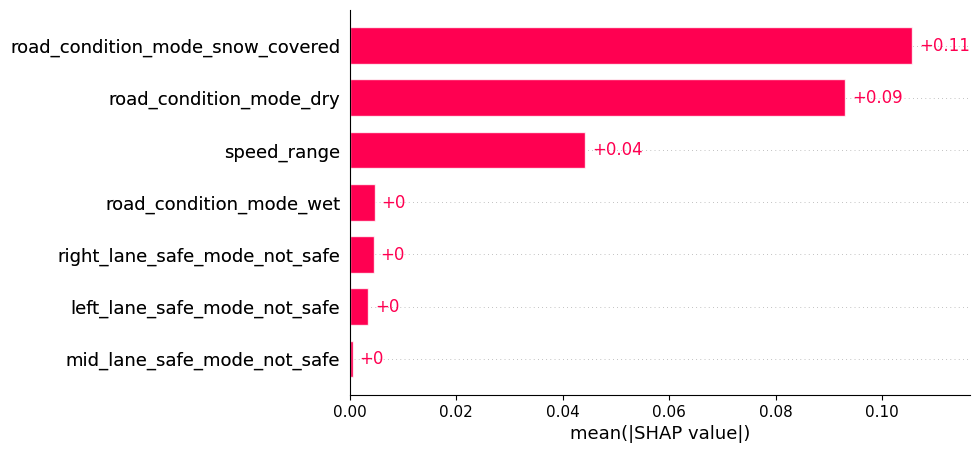

In [ ]:
import shap
import matplotlib.pyplot as plt

# Generate SHAP bar plot
shap.plots.bar(shap_values_anomalies_if, show=False)  # Disable immediate display

# Save the plot
plt.savefig('/content/drive/My Drive/Colab Notebooks/IF_SHAP/shap_bar_plot.png', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

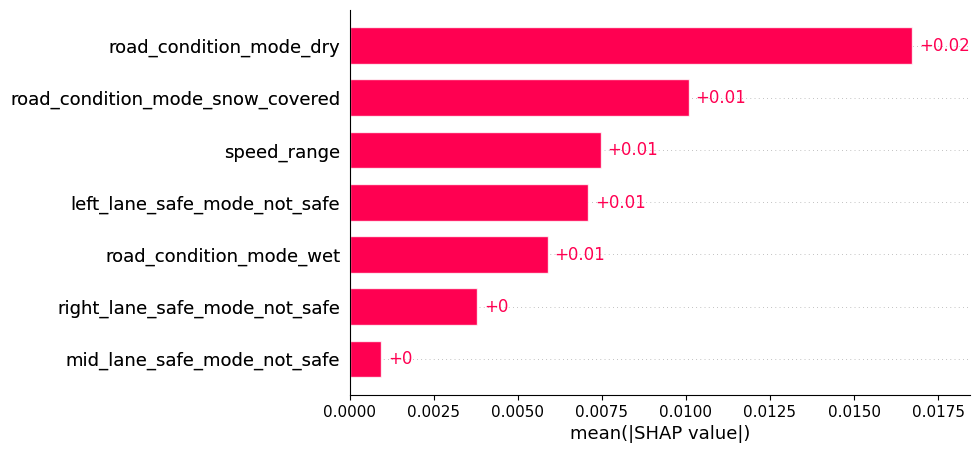

In [ ]:
import shap
import matplotlib.pyplot as plt

# Generate SHAP bar plot
shap.plots.bar(shap_values_anomalies_dif, show=False)  # Disable immediate display

# Save the plot
plt.savefig('/content/drive/My Drive/Colab Notebooks/DIF_SHAP/shap_bar_plot.png', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

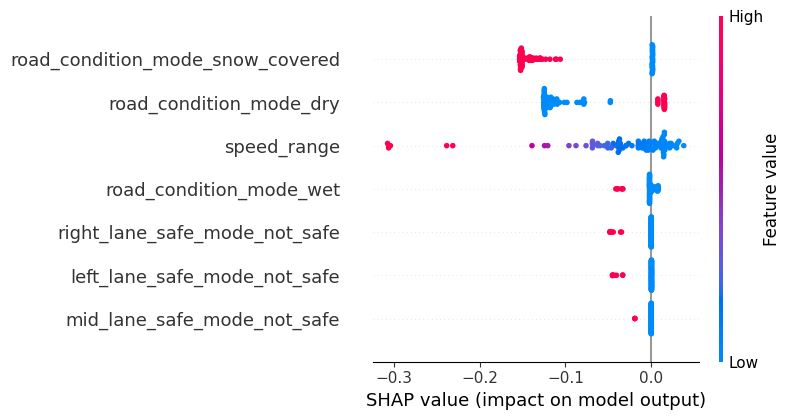

In [ ]:
import shap
import matplotlib.pyplot as plt

# Generate SHAP bar plot
shap.summary_plot(shap_values_anomalies_if, show=False)

# Save the plot
plt.savefig('/content/drive/My Drive/Colab Notebooks/IF_SHAP/shap_summary_plot.png', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

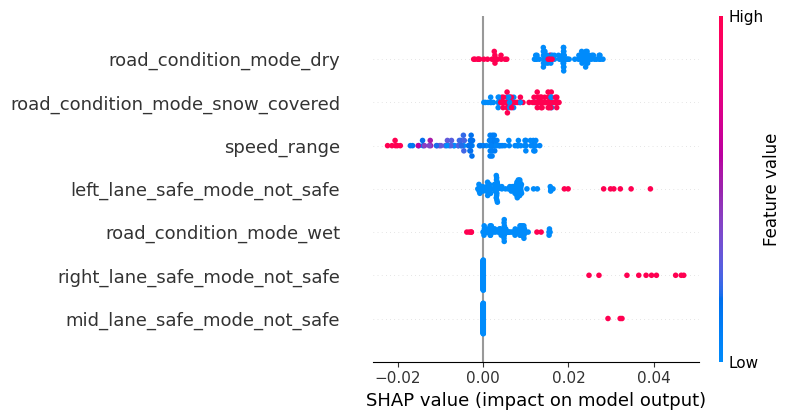

In [ ]:
import shap
import matplotlib.pyplot as plt

# Generate SHAP bar plot
shap.summary_plot(shap_values_anomalies_dif, show=False)

# Save the plot
plt.savefig('/content/drive/My Drive/Colab Notebooks/DIF_SHAP/shap_summary_plot.png', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

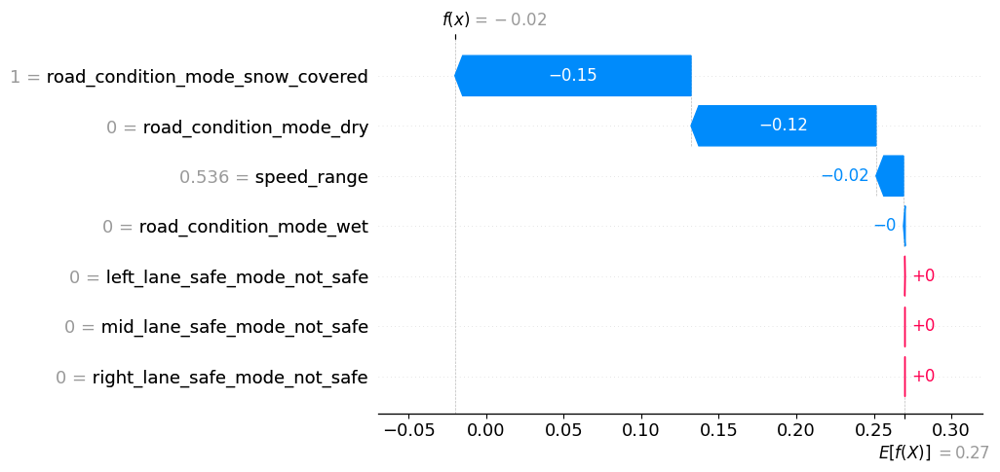

In [ ]:
# Plot waterfall plot of an anomaly
shap.plots.waterfall(shap_values_anomalies[0])

In [ ]:
shap.dependence_plot("rain_impairment", shap_values, iforest_df)

### For DIF

In [ ]:
import shap

# Subset the data to only include anomalies
anomalies_dif_data = anomalies_dif.drop(columns=['anomaly_score', 'tsne_x', 'tsne_y', 'tsne_z'])

# Use the sampled background for KernelExplainer
explainer_dif = shap.KernelExplainer(model_dif.decision_function, background_data)

# Compute SHAP values
shap_values_anomalies_dif = explainer_dif(anomalies_dif_data)

  0%|          | 0/100 [00:00<?, ?it/s]

In [ ]:
shap_values_dif = explainer_dif(background_data)

  0%|          | 0/100 [00:00<?, ?it/s]

In [ ]:
shap.plots.bar(shap_values_anomalies_dif)

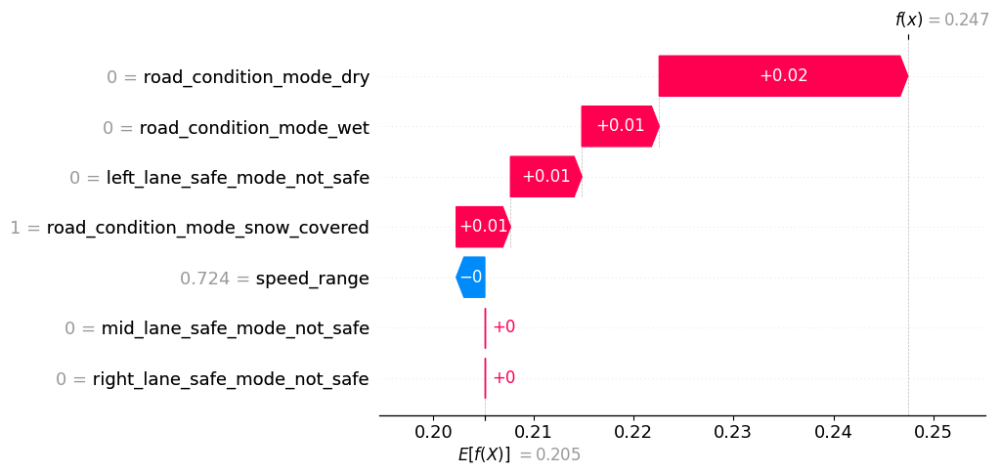

In [ ]:
# Plot waterfall plot of an anomaly
shap.plots.waterfall(shap_values_anomalies[1])

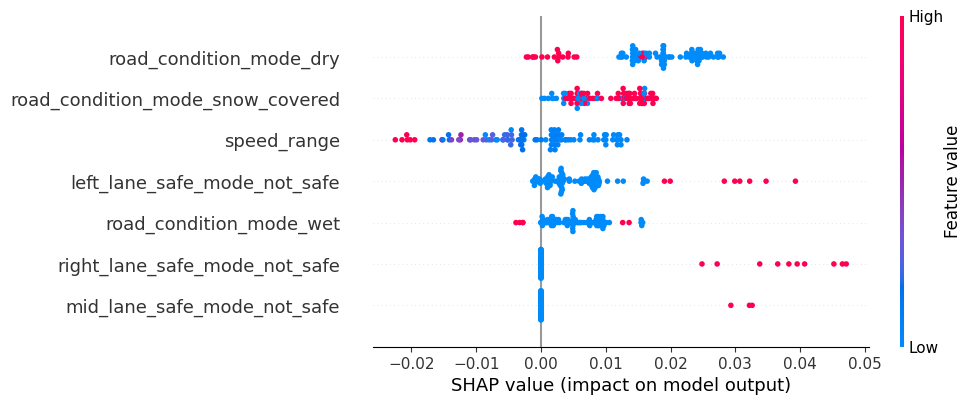

In [ ]:
# summarize the effects of all the features
shap.plots.beeswarm(shap_values_anomalies)

# EM, MV

In [ ]:
"""Excess-Mass and Mass-Volume scores for unsupervised ML AD models."""

import logging
from typing import Any
from sklearn.metrics import auc

import numpy as np
import pandas as pd

logger = logging.getLogger(__name__)


def default_scoring_func(model, df):
    """Default scoring function for anomaly detection models."""
    return model.decision_function(df)


def emmv_scores(
    model: Any,
    df: pd.DataFrame,
    scoring_func: Any = None,
    n_generated: int = 100000,
    alpha_min: float = 0.9,
    alpha_max: float = 0.999,
    em_min: float = 0.9,
) -> tuple:
    """Get Excess-Mass (EM) and Mass Volume (MV) scores for unsupervised ML AD models.

    :param model: Trained ML model with a 'decision_function' method
    :param df: Pandas dataframe of features (X matrix)
    :param scoring_func: Anomaly scoring function (callable)
    :param n_generated: Number of generated samples, defaults to 100000
    :param alpha_min: Min value for alpha axis, defaults to 0.9
    :param alpha_max: Max value for alpha axis, defaults to 0.999
    :param em_min: Min EM value required, defaults to 0.9
    :return: Tuple of EM and MV scores
    """

    if scoring_func is None:
        scoring_func = default_scoring_func

    # Specify limits, volume, and levels for uniform sampling
    lim_inf, lim_sup, volume, levels = calculate_limits(df)

    # Perform uniform sampling
    try:
        uniform_sample = np.random.uniform(lim_inf, lim_sup, size=(n_generated, df.shape[1]))
    except IndexError:  # 1D array
        uniform_sample = np.random.uniform(lim_inf, lim_sup, size=n_generated)

    # Get anomaly scores
    uniform_scores = scoring_func(model, uniform_sample)
    anomaly_scores = scoring_func(model, df)  # .reshape(1, -1)[0]

    # Calculate EM and MV scores
    em_scores, em_auc = excess_mass(levels, em_min, volume, uniform_scores, anomaly_scores)
    mv_scores, mv_auc = mass_volume(alpha_min, alpha_max, volume, uniform_scores, anomaly_scores)

    # Return the mean scores and their AUCs
    return (
        float(np.mean(em_scores)),  # EM mean
        float(np.mean(mv_scores)),  # MV mean
        em_scores,
        mv_scores,
        em_auc,  # EM AUC
        mv_auc,  # MV AUC
    )

    # Calculate and return EM and MV scores
    #return (
    #    float(np.mean(excess_mass(levels, em_min, volume, uniform_scores, anomaly_scores))),
    #    float(np.mean(mass_volume(alpha_min, alpha_max, volume, uniform_scores, anomaly_scores))),
    #)


def calculate_limits(df: pd.DataFrame, offset: float = 1e-60) -> tuple:
    """Specify a rectangle containing all data in X.

    :param pd.DataFrame df: Input dataframe
    :param float offset: Offset to prevent division by 0, defaults to 1e-60
    :return float: Volume of rectangle containing all data in X
    """
    # Min and max values of each feature
    lim_inf = df.min(axis=0)
    lim_sup = df.max(axis=0)

    # Volume of rectangle containing all data in X
    volume = float((lim_sup - lim_inf).prod()) + offset

    # An "array of levels, on which we want to evaluate
    # EM_s(t) on samples X from an underlying density f."
    levels = np.arange(0, 100 / volume, 0.01 / volume)

    return lim_inf, lim_sup, volume, levels


def excess_mass(
    levels: np.ndarray,
    em_min: float,
    volume: float,
    uniform_scores: np.ndarray,
    anomaly_scores: np.ndarray,
) -> np.ndarray:
    """Calculate Excess-Mass scores.

    Variables explained here: https://github.com/ngoix/EMMV_benchmarks/issues/2
    - "t" ('levels' in this code): levels to evaluate EM_s(t) on samples X from underlying density f
    - "leb" refers to Lebesgue measure
    - "s" refers a measurable function
    - "X" refers to dataset
    - "uniform_scores" represents uniform samples from rectangle of all data in X

    :param np.ndarray levels: Levels on which to evaluate EM_s(t) on samples X
    :param float em_min: Beginning of EM curve.
    :param float volume: Volume of rectangle containing all data in X.
    :param np.ndarray uniform_scores: s(U), used to estimate Leb(s>t)
    :param np.ndarray anomaly_scores: s(X), s evaluated on a sample, used to estimate P(s>t)
    :return np.ndarray: EM scores
    """
    n_samples = anomaly_scores.shape[0]
    unique_anomaly_scores = np.unique(anomaly_scores)
    excess_mass_scores = np.zeros(levels.shape[0])
    excess_mass_scores[0] = 1.0

    for score in unique_anomaly_scores:
        anomaly_fraction = 1.0 / n_samples * (anomaly_scores > score).sum()
        uniform = levels * (uniform_scores > score).sum() / len(uniform_scores)
        excess_mass_scores = np.maximum(excess_mass_scores, anomaly_fraction - (uniform * volume))

    index = int(np.argmax(excess_mass_scores <= em_min).flatten()[0]) + 1
    if index == 1:
        logger.warning('Failed to achieve em_min')
        index = -1

    em_auc = auc(levels[:index], excess_mass_scores[:index])
    return excess_mass_scores, em_auc


def mass_volume(
    alpha_min: float,
    alpha_max: float,
    volume: float,
    uniform_scores: np.ndarray,
    anomaly_scores: np.ndarray,
    alpha_count: int = 1000,
) -> np.ndarray:
    """Calculate Mass-Volume (MV) scores.

    Variables explained here: https://github.com/ngoix/EMMV_benchmarks/issues/2
    - "t" ('levels' in this code): levels to evaluate EM_s(t) on samples X from underlying density f
    - "leb" refers to Lebesgue measure
    - "s" refers a measurable function
    - "X" refers to dataset
    - "uniform_scores" represents uniform samples from rectangle of all data in X

    :param float alpha_min: Minimum alpha axis value
    :param float alpha_max: Maximum alpha axis value
    :param float volume: Volume of rectangle containing all data in X.
    :param np.ndarray uniform_scores: s(U), used to estimate Leb(s>t)
    :param np.ndarray anomaly_scores: s(X), s evaluated on a sample, used to estimate P(s>t)
    :param int alpha_count: Number of levels
    :return np.ndarray: MV scores
    """

    n_samples = anomaly_scores.shape[0]
    sorted_indices = anomaly_scores.argsort()
    mass = 0.0
    count = 0
    score = anomaly_scores[sorted_indices[-1]]  # i.e. 'u'
    axis_alpha = np.linspace(alpha_min, alpha_max, alpha_count)

    # Calculate MV scores
    mv_scores = np.zeros(axis_alpha.shape[0])
    for i in range(axis_alpha.shape[0]):
        while mass < axis_alpha[i]:
            count += 1
            score = anomaly_scores[sorted_indices[-count]]
            mass = 1.0 / n_samples * count  # sum(s_X > u)

        score_count = float((uniform_scores >= float(score)).sum())
        mv_scores[i] = (score_count / len(uniform_scores)) * volume

    mv_auc = auc(axis_alpha, mv_scores)
    return mv_scores, mv_auc

In [ ]:
# Compute EM and MV scores using the updated function
if_em_scores_mean, if_mv_scores_mean, if_em_scores, if_mv_scores, if_em_auc, if_mv_auc = emmv_scores(model_if, iforest_df)

# Print the results
print(f"Excess Mass Score (Mean): {if_em_scores_mean}")
print(f"Mass Volume Score (Mean): {if_mv_scores_mean}")
print(f"Excess Mass AUC: {if_em_auc}")
print(f"Mass Volume AUC: {if_mv_auc}")

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:2739: UserWarning:

X does not have valid feature names, but IsolationForest was fitted with feature names



Excess Mass Score (Mean): 0.9387894615798786
Mass Volume Score (Mean): 0.60829036458571
Excess Mass AUC: 0.1683768631071684
Mass Volume AUC: 0.05976783020210289


In [ ]:
# Scoring function for DIF
def dif_scoring_function(model, df):
    """
    Scoring function for DIF anomaly detection.
    Calculates anomaly scores using the decision function of the DIF model.

    Args:
        model: Trained DIF model.
        df: DataFrame or array of features.

    Returns:
        anomaly_scores: Array of anomaly scores.
    """
    # Ensure data is in the correct format
    df = np.array(df) if not isinstance(df, np.ndarray) else df

    # Call the decision_function of DIF to compute scores
    anomaly_scores = model.decision_function(df)
    return anomaly_scores

In [ ]:
# Compute EM and MV scores using the updated function
dif_em_scores_mean, dif_mv_scores_mean, dif_em_scores, dif_mv_scores, dif_em_auc, dif_mv_auc = emmv_scores(model_dif, iforest_df, dif_scoring_function)

# Print the results
print(f"Excess Mass Score (Mean): {dif_em_scores_mean}")
print(f"Mass Volume Score (Mean): {dif_mv_scores_mean}")
print(f"Excess Mass AUC: {dif_em_auc}")
print(f"Mass Volume AUC: {dif_mv_auc}")

Excess Mass Score (Mean): 0.00504640670747937
Mass Volume Score (Mean): 557.4406302906011
Excess Mass AUC: 0.00017035988004794123
Mass Volume AUC: 55.186622398769494


In [ ]:
from sklearn.svm import OneClassSVM

# OC-SVM setup
nu = 0.05  # Proportion of anomalies in the data
kernel = 'rbf'  # Radial basis function kernel
gamma = 'scale'  # Kernel coefficient

oc_svm = OneClassSVM(nu=nu, kernel=kernel, gamma=gamma)
oc_svm.fit(iforest_df)

# Predict anomalies (-1: anomaly, 1: normal)
predictions = oc_svm.predict(iforest_df)

In [ ]:
# Compute EM and MV scores using the updated function
ocsvm_em_scores_mean, ocsvm_mv_scores_mean, ocsvm_em_scores, ocsvm_mv_scores, ocsvm_em_auc, ocsvm_mv_auc = emmv_scores(oc_svm, iforest_df)

# Print the results
print(f"Excess Mass Score (Mean): {ocsvm_em_scores_mean}")
print(f"Mass Volume Score (Mean): {ocsvm_mv_scores_mean}")
print(f"Excess Mass AUC: {ocsvm_em_auc}")
print(f"Mass Volume AUC: {ocsvm_mv_auc}")

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:2739: UserWarning:

X does not have valid feature names, but OneClassSVM was fitted with feature names



Excess Mass Score (Mean): 0.8696926669347907
Mass Volume Score (Mean): 3.489266178866201
Excess Mass AUC: 0.051386288085884996
Mass Volume AUC: 0.34210347426403603


In [ ]:
import pandas as pd
import numpy as np
from sklearn.neighbors import LocalOutlierFactor

# LOF setup
n_neighbors = 20  # Number of neighbors to consider
contamination = 0.01  # Proportion of anomalies in the data

lof = LocalOutlierFactor(
    n_neighbors=n_neighbors,
    contamination=contamination,
    novelty=True  # Set to False as LOF does not directly support prediction on new data
)

# Fit LOF and predict anomalies
lof.fit(iforest_df)  # -1: anomaly, 1: normal

LocalOutlierFactor(contamination=0.01, novelty=True)

In [ ]:
# Compute EM and MV scores using the updated function
lof_em_scores_mean, lof_mv_scores_mean, lof_em_scores, lof_mv_scores, lof_em_auc, lof_mv_auc = emmv_scores(lof, iforest_df)

# Print the results
print(f"Excess Mass Score (Mean): {lof_em_scores_mean}")
print(f"Mass Volume Score (Mean): {lof_mv_scores_mean}")
print(f"Excess Mass AUC: {lof_em_auc}")
print(f"Mass Volume AUC: {lof_mv_auc}")

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:2739: UserWarning:

X does not have valid feature names, but LocalOutlierFactor was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:2739: UserWarning:

X does not have valid feature names, but LocalOutlierFactor was fitted with feature names



Excess Mass Score (Mean): 0.06947171146630582
Mass Volume Score (Mean): 373.6982259339431
Excess Mass AUC: 0.00017041761238529288
Mass Volume AUC: 36.99914842367045


In [ ]:
import pandas as pd
import numpy as np
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import MinMaxScaler


# KNN setup
n_neighbors = 5  # You can adjust this parameter
knn = NearestNeighbors(n_neighbors=n_neighbors)
knn.fit(iforest_df)

# Calculate distances to the n_neighbors
distances, indices = knn.kneighbors(iforest_df)

# Calculate the mean distance to n_neighbors for each point
mean_distances = distances.mean(axis=1)

# Define a threshold for anomalies (e.g., top 1% of distances)
threshold = np.percentile(mean_distances, 99)  # Adjust percentile for desired sensitivity
anomalies = mean_distances > threshold

In [ ]:
def knn_scoring_function(model, df):
    """
    Scoring function for KNN anomaly detection.
    Calculates the mean distance to the nearest neighbors for each data point.

    Args:
        model: Trained NearestNeighbors model.
        df: DataFrame or array of features.

    Returns:
        anomaly_scores: Array of anomaly scores (mean distances).
    """
    # Get distances to the nearest neighbors
    distances, _ = model.kneighbors(df, n_neighbors=5)
    # Use the distance to the k-th nearest neighbor as the anomaly score
    anomaly_scores = distances[:, -1]
    return anomaly_scores

In [ ]:
# Compute EM and MV scores using the updated function
knn_em_scores_mean, knn_mv_scores_mean, knn_em_scores, knn_mv_scores, knn_em_auc, knn_mv_auc = emmv_scores(knn, iforest_df, knn_scoring_function)

# Print the results
print(f"Excess Mass Score (Mean): {knn_em_scores_mean}")
print(f"Mass Volume Score (Mean): {knn_mv_scores_mean}")
print(f"Excess Mass AUC: {knn_em_auc}")
print(f"Mass Volume AUC: {knn_mv_auc}")

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:2739: UserWarning:

X does not have valid feature names, but NearestNeighbors was fitted with feature names



Excess Mass Score (Mean): 0.0022578048975246206
Mass Volume Score (Mean): 557.4406302906011
Excess Mass AUC: 1.4817184523555455e-05
Mass Volume AUC: 55.186622398769494


In [ ]:
lim_inf, lim_sup, volume, levels = calculate_limits(iforest_df)
axis_alpha = np.linspace(0.9, 0.999, 1000)

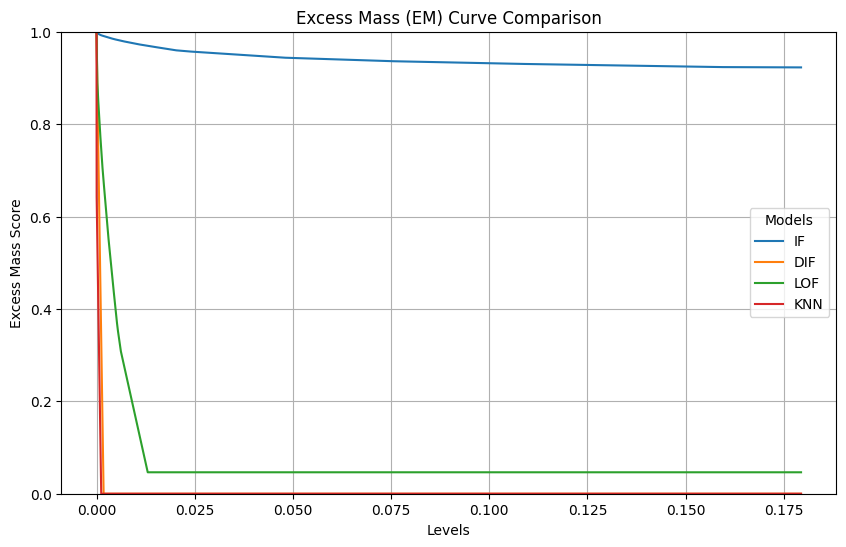

In [ ]:
import matplotlib.pyplot as plt

# Assuming `levels` is the same for all models
# Example data structure (replace with actual scores for each model):
# em_scores_dict = {"iForest": em_scores_iforest, "kNN": em_scores_knn, "OCSVM": em_scores_ocsvm, "LOF": em_scores_lof}

def plot_em_curve(em_scores_dict, levels):
    plt.figure(figsize=(10, 6))
    for model_name, em_scores in em_scores_dict.items():
        plt.plot(levels, em_scores, label=model_name)
    plt.title("Excess Mass (EM) Curve Comparison")
    plt.xlabel("Levels")
    plt.ylabel("Excess Mass Score")
    plt.ylim(0, 1)  # Ensure y-axis is from 0 to 1
    plt.legend(title="Models")
    plt.grid(True)
    plt.show()

# Example call
em_scores_dict = {
    "IF": if_em_scores,
    "DIF": dif_em_scores,
    "LOF": lof_em_scores,
    "KNN": knn_em_scores
}
plot_em_curve(em_scores_dict, levels)

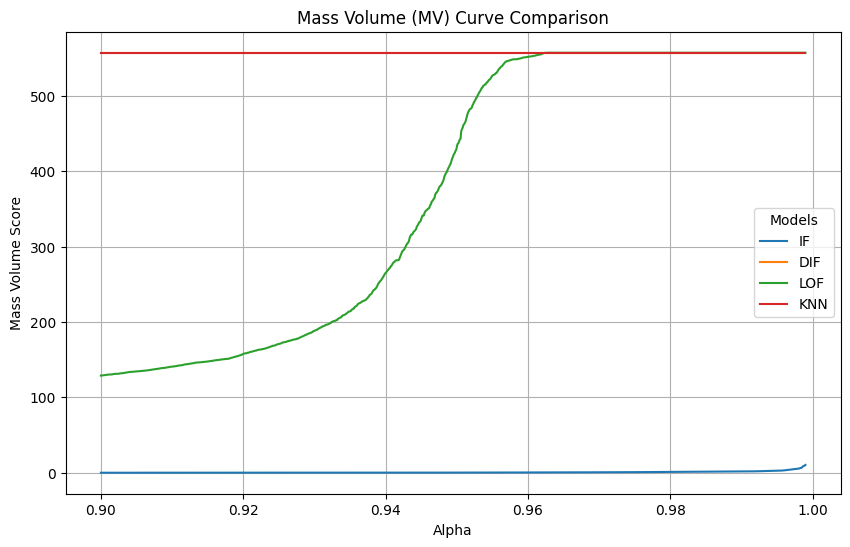

In [ ]:
import matplotlib.pyplot as plt

def plot_mv_curve(mv_scores_dict, axis_alpha):
    plt.figure(figsize=(10, 6))
    for model_name, mv_scores in mv_scores_dict.items():
        plt.plot(axis_alpha, mv_scores, label=model_name)
    plt.title("Mass Volume (MV) Curve Comparison")
    plt.xlabel("Alpha")
    plt.ylabel("Mass Volume Score")
    plt.legend(title="Models")
    plt.grid(True)
    plt.show()

# Example data
mv_scores_dict = {
    "IF": if_mv_scores,
    "DIF": dif_mv_scores,
    "LOF": lof_mv_scores,
    "KNN": knn_mv_scores
}
plot_mv_curve(mv_scores_dict, axis_alpha)